Plan:
Import ranking data for each NYC school district using school digger.

Info available:

Detailed record for one district:
Number of schools by type (elementary, high)
Number of students
number of teachers and what level
rank
mean standardized test scores as compared to district, state


In [29]:
from pprint import pprint
import numpy as np
import pandas as pd
import requests as req
import json
import pickle
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
#Get list of NYC school districts from school digger API for district list
#School digger api credentials

#Lists of all NYC zip codes obtained from health.ny.gov 
NYC_zips = [10455, 10459, 10474, 10463, 10471, 10466, 10469, 10470, 10475, 10461, 10453, 10457, 
            10460, 10458, 10467, 10468, 10451, 10452, 10456, 10454, 10462,10464, 10465, 10472, 
            10473, 11212, 11213, 11216, 11233, 11238, 11209, 11214, 11228, 11204, 11218,
            11219, 11230, 11234, 11236, 11239, 11223, 11224, 11229, 11235, 11201,
            11205, 11215, 11217, 11231, 11203, 11210, 11225, 11226, 11207, 11208,
            11211, 11222, 11220, 11232, 11206, 11221, 11237, 10026, 10027, 10030,
            10037, 10039, 10001, 10011, 10018, 10019, 10020, 10036, 10029, 10035, 10010, 
            10016, 10017, 10022, 10012, 10013, 10014, 10004, 10005, 10006, 10007, 10038, 
            10280, 10002, 10003, 10009, 10021,10028, 10044, 10065, 10075, 10128, 10023, 10024, 10025, 10031, 10032,
            10033, 10034, 10040, 11361, 11362, 11363, 11364, 11354, 11355, 11356, 11357, 11358, 11359,
            11360, 11365, 11366, 11367, 11412, 11423, 11432, 11433, 11434, 11435, 11436, 11101, 
            11102, 11103, 11104, 11105, 11106, 11374, 11375, 11379, 11385, 11691, 11692, 11693, 
            11694, 11695, 11697, 11004, 11005, 11411, 11413, 11422, 11426, 11427, 11428, 11429, 
            11414, 11415, 11416, 11417, 11418, 11419, 11420, 11421, 11368, 11369, 11370, 11372, 
            11373, 11377, 11378, 10302, 10303, 10310, 10306, 10307, 10308, 10309, 10312, 10301, 10304, 10305, 10314]

In [15]:
# url_list= []

# #Loop through list of boros to create request url's
# for zipcode in NYC_zips:
#     target_url = "https://api.schooldigger.com/v1.1/districts?st=NY&zip=%s&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47" % (zipcode)
#     print(target_url)
#     url_list.append(target_url)

# pickle_out = open("zips.pickle", "wb")
# pickle.dump(url_list, pickle_out)
# pickle_out.close()

pickle_in = open("zips.pickle", "rb")
url_list = pickle.load(pickle_in)

print(url_list)

['https://api.schooldigger.com/v1.1/districts?st=NY&zip=10455&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47', 'https://api.schooldigger.com/v1.1/districts?st=NY&zip=10459&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47', 'https://api.schooldigger.com/v1.1/districts?st=NY&zip=10474&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47', 'https://api.schooldigger.com/v1.1/districts?st=NY&zip=10463&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47', 'https://api.schooldigger.com/v1.1/districts?st=NY&zip=10471&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47', 'https://api.schooldigger.com/v1.1/districts?st=NY&zip=10466&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47', 'https://api.schooldigger.com/v1.1/districts?st=NY&zip=10469&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47', 'https://api.schooldigger.com/v1.1/districts?st=NY&zip=10470&appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47', 'https://api.schooldigger.com/v1.1/districts?st=NY&zip=

In [14]:
# #Create request for each url
# request_list = []
# for url in url_list:
#     response = req.get(url).json()
#     request_list.append(response)

# pickle_out = open("requests.pickle", "wb")
# pickle.dump(request_list, pickle_out)
# pickle_out.close()

pickle_in = open("requests.pickle", "rb")
request_list = pickle.load(pickle_in)

pprint(request_list)

[{'districtList': [{'address': {'city': 'Bronx',
                                'cityURL': 'https://www.schooldigger.com/go/NY/city/Bronx/search.aspx',
                                'html': '681 Kelly St-Rm 205<br />Bronx, NY '
                                        '10455-3410',
                                'latLong': {'latitude': 40.815457,
                                            'longitude': -73.902117},
                                'state': 'NY',
                                'stateFull': 'New York',
                                'street': '681 Kelly St-Rm 205',
                                'zip': '10455',
                                'zip4': '3410',
                                'zipURL': 'https://www.schooldigger.com/go/NY/zip/10455/search.aspx'},
                    'county': {'countyName': 'Bronx',
                               'countyURL': 'https://www.schooldigger.com/go/NY/county/Bronx/search.aspx'},
                    'districtID': '3600986',
   

                                     'year': 2017}],
                    'testScores': None,
                    'url': 'https://www.schooldigger.com/go/NY/district/01131/search.aspx'},
                   {'address': {'city': 'Bronx',
                                'cityURL': 'https://www.schooldigger.com/go/NY/city/Bronx/search.aspx',
                                'html': "600 St Ann's Ave<br />Bronx, NY "
                                        '10455-2800',
                                'latLong': {'latitude': 40.814955,
                                            'longitude': -73.912521},
                                'state': 'NY',
                                'stateFull': 'New York',
                                'street': "600 St Ann's Ave",
                                'zip': '10455',
                                'zip4': '2800',
                                'zipURL': 'https://www.schooldigger.com/go/NY/zip/10455/search.aspx'},
                    'county': 

                                               'numberOfTeachersK': None,
                                               'numberOfTeachersPK': None,
                                               'numberOfTeachersSecondary': 15.0,
                                               'year': 2016}],
                    'hasBoundary': False,
                    'highGrade': '12',
                    'locationIsWithinBoundary': None,
                    'lowGrade': '9',
                    'numberAlternativeSchools': 0,
                    'numberHighSchools': 1,
                    'numberMiddleSchools': 0,
                    'numberPrimarySchools': 0,
                    'numberTotalSchools': 1,
                    'phone': '(718) 562-2300',
                    'rankHistory': [{'rank': 431,
                                     'rankOf': 801,
                                     'rankScore': 0.5364455,
                                     'rankStars': 2,
                                     '

                                     'rankStatewidePercentage': 30.63,
                                     'year': 2016}],
                    'testScores': None,
                    'url': 'https://www.schooldigger.com/go/NY/district/01005/search.aspx'}],
  'numberOfDistricts': 1,
  'numberOfPages': 1},
 {'districtList': [{'address': {'city': 'Bronx',
                                'cityURL': 'https://www.schooldigger.com/go/NY/city/Bronx/search.aspx',
                                'html': '1500 Pelham Pkwy S<br />Bronx, NY '
                                        '10461',
                                'latLong': {'latitude': 40.8571,
                                            'longitude': -73.843669},
                                'state': 'NY',
                                'stateFull': 'New York',
                                'street': '1500 Pelham Pkwy S',
                                'zip': '10461',
                                'zip4': '',
                   

                                     'rankStars': 0,
                                     'rankStatewidePercentage': 9.03,
                                     'year': 2016}],
                    'testScores': None,
                    'url': 'https://www.schooldigger.com/go/NY/district/00968/search.aspx'}],
  'numberOfDistricts': 1,
  'numberOfPages': 1},
 {'districtList': [], 'numberOfDistricts': 0, 'numberOfPages': 0},
 {'districtList': [{'address': {'city': 'Bronx',
                                'cityURL': 'https://www.schooldigger.com/go/NY/city/Bronx/search.aspx',
                                'html': '750 Concourse Village W-Lower<br '
                                        '/>Bronx, NY 10451',
                                'latLong': {'latitude': 40.82301,
                                            'longitude': -73.922521},
                                'state': 'NY',
                                'stateFull': 'New York',
                                'street': '7

                                     'rankScore': 0.6003723,
                                     'rankStars': 3,
                                     'rankStatewidePercentage': 54.45,
                                     'year': 2016}],
                    'testScores': None,
                    'url': 'https://www.schooldigger.com/go/NY/district/00066/search.aspx'},
                   {'address': {'city': 'Bronx',
                                'cityURL': 'https://www.schooldigger.com/go/NY/city/Bronx/search.aspx',
                                'html': '180 W 165th St<br />Bronx, NY 10452',
                                'latLong': {'latitude': 40.83425,
                                            'longitude': -73.930191},
                                'state': 'NY',
                                'stateFull': 'New York',
                                'street': '180 W 165th St',
                                'zip': '10452',
                                'zip4': '',
     

                                               'numberOfGuidanceTotal': 113.8,
                                               'numberOfLEAAdministrators': None,
                                               'numberOfLEASupportStaff': 0.0,
                                               'numberOfLibrarians': 7.3,
                                               'numberOfLibraryStaff': 0.0,
                                               'numberOfOtherSupportStaff': 0.0,
                                               'numberOfSchoolAdminSupportStaff': 18.5,
                                               'numberOfSchoolAdministrators': 204.0,
                                               'numberOfSpecialEdStudents': 10216,
                                               'numberOfStudentSupportStaff': 121.7,
                                               'numberOfStudents': 37209,
                                               'numberOfTeachers': 2506.8,
                                      

                    'phone': '(718) 292-7015',
                    'rankHistory': [{'rank': 339,
                                     'rankOf': 801,
                                     'rankScore': 0.6131601,
                                     'rankStars': 3,
                                     'rankStatewidePercentage': 57.68,
                                     'year': 2017},
                                    {'rank': 185,
                                     'rankOf': 764,
                                     'rankScore': 0.75,
                                     'rankStars': 4,
                                     'rankStatewidePercentage': 75.79,
                                     'year': 2016}],
                    'testScores': None,
                    'url': 'https://www.schooldigger.com/go/NY/district/00960/search.aspx'},
                   {'address': {'city': 'Bronx',
                                'cityURL': 'https://www.schooldigger.com/go/NY/city/Bronx/search.

                    'county': {'countyName': 'Bronx',
                               'countyURL': 'https://www.schooldigger.com/go/NY/county/Bronx/search.aspx'},
                    'districtID': '3600085',
                    'districtName': 'New York City Geographic District # 8',
                    'districtYearlyDetails': [{'numberOfAids': 0.0,
                                               'numberOfCoordsSupervisors': 2.0,
                                               'numberOfEnglishLanguageLearnerStudents': 3686,
                                               'numberOfGuidanceElem': 22.0,
                                               'numberOfGuidanceSecondary': 60.0,
                                               'numberOfGuidanceTotal': 82.0,
                                               'numberOfLEAAdministrators': None,
                                               'numberOfLEASupportStaff': 0.0,
                                               'numberOfLibrarians': 10.6,

                                     'rankStatewidePercentage': 1.5,
                                     'year': 2017}],
                    'testScores': None,
                    'url': 'https://www.schooldigger.com/go/NY/district/01101/search.aspx'},
                   {'address': {'city': 'Brooklyn',
                                'cityURL': 'https://www.schooldigger.com/go/NY/city/Brooklyn/search.aspx',
                                'html': '188 Rochester Ave<br />Brooklyn, NY '
                                        '11213-3102',
                                'latLong': {'latitude': 40.67271,
                                            'longitude': -73.928921},
                                'state': 'NY',
                                'stateFull': 'New York',
                                'street': '188 Rochester Ave',
                                'zip': '11213',
                                'zip4': '3102',
                                'zipURL': 'https://www

                    'lowGrade': 'PK',
                    'numberAlternativeSchools': 2,
                    'numberHighSchools': 5,
                    'numberMiddleSchools': 7,
                    'numberPrimarySchools': 15,
                    'numberTotalSchools': 29,
                    'phone': '(718) 240-3677',
                    'rankHistory': [{'rank': 745,
                                     'rankOf': 801,
                                     'rankScore': 0.1885108,
                                     'rankStars': 0,
                                     'rankStatewidePercentage': 6.99,
                                     'year': 2017},
                                    {'rank': 712,
                                     'rankOf': 764,
                                     'rankScore': 0.2040802,
                                     'rankStars': 0,
                                     'rankStatewidePercentage': 6.81,
                                     'year': 2016}],
   

                                               'year': 2016}],
                    'hasBoundary': False,
                    'highGrade': '12',
                    'locationIsWithinBoundary': None,
                    'lowGrade': 'K',
                    'numberAlternativeSchools': 1,
                    'numberHighSchools': 0,
                    'numberMiddleSchools': 0,
                    'numberPrimarySchools': 0,
                    'numberTotalSchools': 1,
                    'phone': '(347) 889-7041',
                    'rankHistory': None,
                    'testScores': None,
                    'url': 'https://www.schooldigger.com/go/NY/district/00991/search.aspx'}],
  'numberOfDistricts': 1,
  'numberOfPages': 1},
 {'districtList': [], 'numberOfDistricts': 0, 'numberOfPages': 0},
 {'districtList': [{'address': {'city': 'Brooklyn',
                                'cityURL': 'https://www.schooldigger.com/go/NY/city/Brooklyn/search.aspx',
                                'ht

                                               'year': 2016}],
                    'hasBoundary': False,
                    'highGrade': '12',
                    'locationIsWithinBoundary': None,
                    'lowGrade': 'K',
                    'numberAlternativeSchools': 1,
                    'numberHighSchools': 0,
                    'numberMiddleSchools': 0,
                    'numberPrimarySchools': 0,
                    'numberTotalSchools': 1,
                    'phone': '(718) 513-6951',
                    'rankHistory': None,
                    'testScores': None,
                    'url': 'https://www.schooldigger.com/go/NY/district/01004/search.aspx'},
                   {'address': {'city': 'Brooklyn',
                                'cityURL': 'https://www.schooldigger.com/go/NY/city/Brooklyn/search.aspx',
                                'html': '501 West Ave<br />Brooklyn, NY 11224',
                                'latLong': {'latitude': 40.582382,
     

                    'highGrade': '8',
                    'locationIsWithinBoundary': None,
                    'lowGrade': 'K',
                    'numberAlternativeSchools': 0,
                    'numberHighSchools': 0,
                    'numberMiddleSchools': 0,
                    'numberPrimarySchools': 1,
                    'numberTotalSchools': 1,
                    'phone': '(718) 858-1629',
                    'rankHistory': [{'rank': 211,
                                     'rankOf': 801,
                                     'rankScore': 0.7407397,
                                     'rankStars': 4,
                                     'rankStatewidePercentage': 73.66,
                                     'year': 2017},
                                    {'rank': 289,
                                     'rankOf': 764,
                                     'rankScore': 0.6529265,
                                     'rankStars': 3,
                                    

                   {'address': {'city': 'Brooklyn',
                                'cityURL': 'https://www.schooldigger.com/go/NY/city/Brooklyn/search.aspx',
                                'html': '72 Veronica Pl-4th Fl<br />Brooklyn, '
                                        'NY 11226',
                                'latLong': {'latitude': 40.648716,
                                            'longitude': -73.952839},
                                'state': 'NY',
                                'stateFull': 'New York',
                                'street': '72 Veronica Pl-4th Fl',
                                'zip': '11226',
                                'zip4': '',
                                'zipURL': 'https://www.schooldigger.com/go/NY/zip/11226/search.aspx'},
                    'county': {'countyName': 'Kings',
                               'countyURL': 'https://www.schooldigger.com/go/NY/county/Kings/search.aspx'},
                    'districtID': '3600999',

                    'numberTotalSchools': 1,
                    'phone': '(347) 471-2620',
                    'rankHistory': [{'rank': 143,
                                     'rankOf': 801,
                                     'rankScore': 0.8081428,
                                     'rankStars': 4,
                                     'rankStatewidePercentage': 82.15,
                                     'year': 2017},
                                    {'rank': 314,
                                     'rankOf': 764,
                                     'rankScore': 0.6319796,
                                     'rankStars': 3,
                                     'rankStatewidePercentage': 58.9,
                                     'year': 2016}],
                    'testScores': None,
                    'url': 'https://www.schooldigger.com/go/NY/district/01028/search.aspx'},
                   {'address': {'city': 'Brooklyn',
                                'cityURL': 'h

                   {'address': {'city': 'Brooklyn',
                                'cityURL': 'https://www.schooldigger.com/go/NY/city/Brooklyn/search.aspx',
                                'html': '545 Willoughby Ave<br />Brooklyn, NY '
                                        '11206',
                                'latLong': {'latitude': 40.694239,
                                            'longitude': -73.94783},
                                'state': 'NY',
                                'stateFull': 'New York',
                                'street': '545 Willoughby Ave',
                                'zip': '11206',
                                'zip4': '',
                                'zipURL': 'https://www.schooldigger.com/go/NY/zip/11206/search.aspx'},
                    'county': {'countyName': 'Kings',
                               'countyURL': 'https://www.schooldigger.com/go/NY/county/Kings/search.aspx'},
                    'districtID': '3600045',
      

                                               'numberOfTeachers': 57.5,
                                               'numberOfTeachersElementary': 40.0,
                                               'numberOfTeachersK': 5.0,
                                               'numberOfTeachersPK': None,
                                               'numberOfTeachersSecondary': 8.5,
                                               'year': 2016}],
                    'hasBoundary': False,
                    'highGrade': '12',
                    'locationIsWithinBoundary': None,
                    'lowGrade': 'K',
                    'numberAlternativeSchools': 1,
                    'numberHighSchools': 0,
                    'numberMiddleSchools': 0,
                    'numberPrimarySchools': 0,
                    'numberTotalSchools': 1,
                    'phone': '(718) 638-1875',
                    'rankHistory': [{'rank': 39,
                                     'rankOf': 764,

                    'locationIsWithinBoundary': None,
                    'lowGrade': '6',
                    'numberAlternativeSchools': 1,
                    'numberHighSchools': 0,
                    'numberMiddleSchools': 0,
                    'numberPrimarySchools': 0,
                    'numberTotalSchools': 1,
                    'phone': '(212) 866-6137',
                    'rankHistory': None,
                    'testScores': None,
                    'url': 'https://www.schooldigger.com/go/NY/district/00109/search.aspx'},
                   {'address': {'city': 'New York',
                                'cityURL': 'https://www.schooldigger.com/go/NY/city/New+York/search.aspx',
                                'html': '125 W 115th St<br />New York, NY '
                                        '10026-2908',
                                'latLong': {'latitude': 40.802065,
                                            'longitude': -73.951362},
                             

                                               'numberOfLEASupportStaff': 0.0,
                                               'numberOfLibrarians': 0.0,
                                               'numberOfLibraryStaff': 0.0,
                                               'numberOfOtherSupportStaff': 0.0,
                                               'numberOfSchoolAdminSupportStaff': 5.0,
                                               'numberOfSchoolAdministrators': 3.0,
                                               'numberOfSpecialEdStudents': None,
                                               'numberOfStudentSupportStaff': 0.0,
                                               'numberOfStudents': 313,
                                               'numberOfTeachers': 37.0,
                                               'numberOfTeachersElementary': 31.0,
                                               'numberOfTeachersK': 3.0,
                                               'numbe

                                               'numberOfEnglishLanguageLearnerStudents': 24,
                                               'numberOfGuidanceElem': 0.0,
                                               'numberOfGuidanceSecondary': 0.0,
                                               'numberOfGuidanceTotal': 0.0,
                                               'numberOfLEAAdministrators': 3.0,
                                               'numberOfLEASupportStaff': 0.0,
                                               'numberOfLibrarians': 0.0,
                                               'numberOfLibraryStaff': 0.0,
                                               'numberOfOtherSupportStaff': 1.0,
                                               'numberOfSchoolAdminSupportStaff': 3.0,
                                               'numberOfSchoolAdministrators': 2.0,
                                               'numberOfSpecialEdStudents': None,
                             

                    'locationIsWithinBoundary': None,
                    'lowGrade': 'K',
                    'numberAlternativeSchools': 1,
                    'numberHighSchools': 0,
                    'numberMiddleSchools': 0,
                    'numberPrimarySchools': 0,
                    'numberTotalSchools': 1,
                    'phone': '(646) 442-6600',
                    'rankHistory': [{'rank': 4,
                                     'rankOf': 764,
                                     'rankScore': 0.9949238,
                                     'rankStars': 5,
                                     'rankStatewidePercentage': 99.48,
                                     'year': 2016}],
                    'testScores': None,
                    'url': 'https://www.schooldigger.com/go/NY/district/00954/search.aspx'}],
  'numberOfDistricts': 5,
  'numberOfPages': 1},
 {'districtList': [{'address': {'city': 'New York',
                                'cityURL': 'https://www.

                    'districtYearlyDetails': [{'numberOfAids': 0.0,
                                               'numberOfCoordsSupervisors': 1.2,
                                               'numberOfEnglishLanguageLearnerStudents': 1049,
                                               'numberOfGuidanceElem': 12.0,
                                               'numberOfGuidanceSecondary': 31.0,
                                               'numberOfGuidanceTotal': 43.0,
                                               'numberOfLEAAdministrators': None,
                                               'numberOfLEASupportStaff': 0.0,
                                               'numberOfLibrarians': 5.0,
                                               'numberOfLibraryStaff': 0.0,
                                               'numberOfOtherSupportStaff': 0.0,
                                               'numberOfSchoolAdminSupportStaff': 4.5,
                                        

                                     'rankScore': 0.5570422,
                                     'rankStars': 2,
                                     'rankStatewidePercentage': 47.91,
                                     'year': 2016}],
                    'testScores': None,
                    'url': 'https://www.schooldigger.com/go/NY/district/00952/search.aspx'}],
  'numberOfDistricts': 2,
  'numberOfPages': 1},
 {'districtList': [{'address': {'city': 'Bayside',
                                'cityURL': 'https://www.schooldigger.com/go/NY/city/Bayside/search.aspx',
                                'html': '61-15 Oceania St<br />Bayside, NY '
                                        '11361',
                                'latLong': {'latitude': 40.7451,
                                            'longitude': -73.7668},
                                'state': 'NY',
                                'stateFull': 'New York',
                                'street': '61-15 Oceania St

                                'state': 'NY',
                                'stateFull': 'New York',
                                'street': '36-12 35th Ave',
                                'zip': '11106',
                                'zip4': '1227',
                                'zipURL': 'https://www.schooldigger.com/go/NY/zip/11106/search.aspx'},
                    'county': {'countyName': 'Queens',
                               'countyURL': 'https://www.schooldigger.com/go/NY/county/Queens/search.aspx'},
                    'districtID': '3600057',
                    'districtName': 'Our World Neighborhood Charter School',
                    'districtYearlyDetails': [{'numberOfAids': 0.0,
                                               'numberOfCoordsSupervisors': 0.0,
                                               'numberOfEnglishLanguageLearnerStudents': 49,
                                               'numberOfGuidanceElem': 0.0,
                                 

                                               'numberOfLibrarians': 5.9,
                                               'numberOfLibraryStaff': 0.0,
                                               'numberOfOtherSupportStaff': 0.0,
                                               'numberOfSchoolAdminSupportStaff': 16.1,
                                               'numberOfSchoolAdministrators': 126.0,
                                               'numberOfSpecialEdStudents': 6031,
                                               'numberOfStudentSupportStaff': 52.5,
                                               'numberOfStudents': 27809,
                                               'numberOfTeachers': 1699.8,
                                               'numberOfTeachersElementary': 995.7,
                                               'numberOfTeachersK': 49.7,
                                               'numberOfTeachersPK': 57.1,
                                               

In [5]:
#Get list of district id's
district_ids = []
for request in request_list:
        for district in request["districtList"]:
            district_id = district["districtID"]
            district_ids.append(district_id)
        
#Get list of boros to correspond with ids
district_boros = []
for request in request_list:
        for district in request["districtList"]:
            boro = district["address"]["city"]
            district_boros.append(boro)
        
#Concat lists in a dataframe
district_list = pd.DataFrame({"Boro": district_boros, "District ID": district_ids})

In [17]:
#Get ranking/test score info for each school district in the district list
#School digger api credentials
# appid = "6c0fc6b7"
# apikey = "c9afc046a1198a993222f9b6107ffb47"

# district_details = []

# for district in district_list["District ID"]:
#     target_url = "https://api.schooldigger.com/v1.1/districts/%s?appID=6c0fc6b7&appKey=c9afc046a1198a993222f9b6107ffb47" % (district)
#     response = req.get(target_url).json()
#     district_details.append(response)
    
# pickle_out = open("district_details.pickle", "wb")
# pickle.dump(district_details, pickle_out)
# pickle_out.close()

pickle_in = open("district_details.pickle", "rb")
district_details = pickle.load(pickle_in)

pprint(district_details)

[{'address': {'city': 'Bronx',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/Bronx/search.aspx',
              'html': '681 Kelly St-Rm 205<br />Bronx, NY 10455-3410',
              'latLong': {'latitude': 40.815457, 'longitude': -73.902117},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '681 Kelly St-Rm 205',
              'zip': '10455',
              'zip4': '3410',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/10455/search.aspx'},
  'county': {'countyName': 'Bronx',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/Bronx/search.aspx'},
  'districtID': '3600986',
  'districtName': 'Girls Preparatory Charter School Of The Bronx',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 2.0,
                             'numberOfEnglishLanguageLearnerStudents': 36,
                             'numberOfGuidanceElem': 0.0,
           

                             'numberOfSchoolAdministrators': 5.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 1.0,
                             'numberOfStudents': 441,
                             'numberOfTeachers': 34.0,
                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': 33.3,
                             'year': 2016},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAd

                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 572,
                             'numberOfTeachers': 33.0,
                             'numberOfTeachersElementary': 19.7,
                             'numberOfTeachersK': 2.2,
                             

                  'stateTestScore': {'percentMetStandard': 77.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 227043},
                  'subject': 'Mathematics A',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 48.0,
                                        'percentTier1': 30.0,
                                        'percentTier2': 23.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 5.0,
                                        'studentsTested'

                                     'percentTier4': 32.0,
                                     'studentsTested': 208177},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2006},
                 {'districtTestScore': {'percentMetStandard': 42.0,
                                        'percentTier1': 39.0,
                                        'percentTier2': 19.0,
                                        'percentTier3': 39.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 1854},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 78.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 10.0,
                       

                                     'percentTier1': 14.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 35.0,
                                     'percentTier4': 41.0,
                                     'studentsTested': 191130},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 51.0,
                                        'percentTier1': 27.0,
                                        'percentTier2': 21.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 656},
                  'grade': '13',
                

                  'year': 2015},
                 {'districtTestScore': {'numTier1': 539,
                                        'numTier2': 515,
                                        'numTier3': 889,
                                        'numTier4': 55,
                                        'percentMetStandard': 47.25,
                                        'percentTier1': 26.98,
                                        'percentTier2': 25.78,
                                        'percentTier3': 44.49,
                                        'percentTier4': 2.75,
                                        'studentsTested': 1998},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 23524,
                                     'numTier2': 29933,
                                     'numTier3': 114496,
                                     'numTier4': 71587,
                                     'percentMetStandard': 77.68,
                               

                  'stateTestScore': {'percentMetStandard': 78.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 15.0,
                                     'percentTier3': 58.0,
                                     'percentTier4': 20.0,
                                     'studentsTested': 108466},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 18.0,
                                        'percentTier1': 55.0,
                                        'percentTier2': 27.0,
                                        'percentTier3': 16.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 299

                 {'districtTestScore': {'percentMetStandard': 50.0,
                                        'percentTier1': 22.0,
                                        'percentTier2': 29.0,
                                        'percentTier3': 47.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 3036},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 16.0,
                                     'percentTier3': 55.0,
                                     'percentTier4': 17.0,
                                     'studentsTested': 283530},
                  'subject': 'Integrated Algebra',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4

                                     'percentTier4': 7.0,
                                     'studentsTested': 198738},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 283.0,
                                        'percentMetStandard': 12.0,
                                        'percentTier1': 55.0,
                                        'percentTier2': 33.0,
                                        'percentTier3': 12.0,
                                        'percentTier4': 0.0,
                                        'studentsTested': 1834},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 300.0,
                        

                  'stateTestScore': {'meanScaledScore': 675.0,
                                     'percentMetStandard': 83.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 17.0,
                                     'percentTier3': 69.0,
                                     'percentTier4': 14.0,
                                     'studentsTested': 197765},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 659.0,
                                        'percentMetStandard': 31.0,
                                        'percentTier1': 24.0,
                                        'percentTier2': 45.0,
  

                                     'numTier1': 67214,
                                     'numTier2': 68355,
                                     'numTier3': 42691,
                                     'numTier4': 11044,
                                     'percentMetStandard': 29.0,
                                     'percentTier1': 36.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 23.0,
                                     'percentTier4': 6.0,
                                     'studentsTested': 189304},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 277.0,
                                 

                                     'numTier2': 46753,
                                     'numTier3': 43377,
                                     'numTier4': 40590,
                                     'percentMetStandard': 48.38,
                                     'percentTier1': 24.69,
                                     'percentTier2': 26.94,
                                     'percentTier3': 24.99,
                                     'percentTier4': 23.39,
                                     'studentsTested': 173568},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 654.0,
                                        'percentMetStandard': 57.0,
                                

                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 662.0,
                                        'percentMetStandard': 37.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 46.0,
                                        'percentTier3': 27.0,
                                        'percentTier4': 10.0,
                                        'studentsTested': 1846},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 680.0,
                                     'percentMetStandard': 61.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 34.0,
                                     'percentTier4': 27.0,
                                     'studentsTested': 200576},
                  'subject': 'Math',
                  'test'

                                        'percentTier4': 3.0,
                                        'studentsTested': 1648},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 293.0,
                                     'numTier1': 55039,
                                     'numTier2': 60278,
                                     'numTier3': 24829,
                                     'numTier4': 6821,
                                     'percentMetStandard': 22.0,
                                     'percentTier1': 37.0,
                                     'percentTier2': 41.0,
                                     'percentTier3': 17.0,
                                     'percentTier4': 5.0,
                                     'studentsTested': 146967},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
      

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 64.0,
                                        'percentMetStandard': 52.0,
                                        'percentTier1': 31.0,
                                        'percentTier2': 17.0,
                                        'percentTier3': 46.0,
                                        'percentTier4': 6.0,
                                        'studentsTested': 1914},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 77.0,
                                     'percentMetStandard': 82.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 7.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 34.0,
    

                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 1.0,
                             'numberOfGuidanceTotal': 1.0,
                             'numberOfLEAAdministrators': 3.5,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 4.0,
                             'numberOfSchoolAdminSupportStaff': 1.0,
                             'numberOfSchoolAdministrators': 0.5,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 7.0,
                             'numberOfStudents': 239,
                             'numberOfTeachers': 23.8,
                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                         

                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': 155,
                             'numberOfTeachers': None,
                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': None,
                

                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
                             'numberOfTeachers': 11.0,
                             'numberOfTeachersElementary': 0.0,
                             'numberOfTeachersK': 0.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 10.0,
                             'year': 2008},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': 10,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEA

                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
                             'numberOfTeachers': 26.0,
                             'numberOfTeachersElementary': 22.6,
                             'numberOfTeachersK': 3.3,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             '

                             'numberOfTeachers': 2620.0,
                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': None,
                             'year': 2007},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': 3539,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOt

                                     'percentTier4': 63.0,
                                     'studentsTested': 76221},
                  'subject': 'Spanish',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 88.0,
                                        'percentTier1': 7.0,
                                        'percentTier2': 6.0,
                                        'percentTier3': 32.0,
                                        'percentTier4': 56.0,
                                        'studentsTested': 562},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 96.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 2.0,
                            

                                     'percentMetStandard': 68.18,
                                     'percentTier1': 18.33,
                                     'percentTier2': 13.49,
                                     'percentTier3': 37.6,
                                     'percentTier4': 30.58,
                                     'studentsTested': 240408},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2017},
                 {'districtTestScore': {'percentMetStandard': 46.0,
                                        'percentTier1': 35.0,
                                        'percentTier2': 20.0,
                                        'percentTier3': 35.0,
                                        'percentTier4': 11.0,
                                    

                                     'percentTier2': 12.5,
                                     'percentTier3': 47.8,
                                     'percentTier4': 29.89,
                                     'studentsTested': 239540},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 691,
                                        'numTier2': 667,
                                        'numTier3': 1567,
                                        'numTier4': 172,
                                        'percentMetStandard': 56.15,
                                        'percentTier1': 22.31,
                                        'percentTier2': 21.54,
                                        'percentTier3': 50.6,
   

                                        'numTier2': 147,
                                        'numTier3': 121,
                                        'numTier4': 10,
                                        'percentMetStandard': 31.8,
                                        'percentTier1': 32.52,
                                        'percentTier2': 35.68,
                                        'percentTier3': 29.37,
                                        'percentTier4': 2.43,
                                        'studentsTested': 412},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 7675,
                                     'numTier2': 17941,
                                     'numTier3': 55293,
                                     'numTier4': 25499,
                                     'percentMetStandard': 75.93,
                                     'percentTier1': 7.21,
                                     'percentTier2': 16.86,
      

                  'year': 2015},
                 {'districtTestScore': {'numTier1': 187,
                                        'numTier2': 108,
                                        'numTier3': 118,
                                        'numTier4': 14,
                                        'percentMetStandard': 30.91,
                                        'percentTier1': 43.79,
                                        'percentTier2': 25.29,
                                        'percentTier3': 27.63,
                                        'percentTier4': 3.28,
                                        'studentsTested': 427},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 6297,
                                     'numTier2': 5605,
                                     'numTier3': 6480,
                                     'numTier4': 677,
                                     'percentMetStandard': 37.55,
                                     '

                  'stateTestScore': {'meanScaledScore': 299.0,
                                     'percentMetStandard': 30.0,
                                     'percentTier1': 30.0,
                                     'percentTier2': 39.0,
                                     'percentTier3': 21.0,
                                     'percentTier4': 9.0,
                                     'studentsTested': 196076},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 292.0,
                                        'numTier1': 1215,
                                        'numTier2': 1208,
                                        'numTier3': 526,
                     

                                        'percentTier3': 14.0,
                                        'percentTier4': 10.81,
                                        'studentsTested': 2922},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 299.0,
                                     'numTier1': 44795,
                                     'numTier2': 59388,
                                     'numTier3': 24963,
                                     'numTier4': 24858,
                                     'percentMetStandard': 32.35,
                                     'percentTier1': 29.09,
                                     'percentTier2': 38.56,
                                     'percentTier3': 16.21,
                                     'percentTier4': 16.14,
                                     'studentsTested': 154004},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                 

                                        'percentTier1': 1.0,
                                        'percentTier2': 8.0,
                                        'percentTier3': 71.0,
                                        'percentTier4': 19.0,
                                        'studentsTested': 3189},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 692.0,
                                     'percentMetStandard': 93.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 6.0,
                                     'percentTier3': 66.0,
                                     'percentTier4': 27.0,
                                     'studentsTested': 200184},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
    

                 {'districtTestScore': {'meanScaledScore': 299.0,
                                        'numTier1': 1241,
                                        'numTier2': 1055,
                                        'numTier3': 582,
                                        'numTier4': 261,
                                        'percentMetStandard': 27.0,
                                        'percentTier1': 40.0,
                                        'percentTier2': 34.0,
                                        'percentTier3': 19.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 3139},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 307.0,
                                     'numTier1': 60861,
                                     'numTier2': 54163,
                                     'numTier3': 45973,
                                     'numTier4': 28679,
     

                  'stateTestScore': {'meanScaledScore': 306.0,
                                     'numTier1': 48038,
                                     'numTier2': 42656,
                                     'numTier3': 34904,
                                     'numTier4': 19915,
                                     'percentMetStandard': 37.67,
                                     'percentTier1': 33.01,
                                     'percentTier2': 29.31,
                                     'percentTier3': 23.99,
                                     'percentTier4': 13.69,
                                     'studentsTested': 145513},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanSc

                                        'percentTier3': 32.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 3015},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 70.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 25.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 21.0,
                                     'studentsTested': 185178},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScor

                                        'percentTier1': 16.39,
                                        'percentTier2': 9.44,
                                        'percentTier3': 32.33,
                                        'percentTier4': 20.85,
                                        'percentTier5': 21.0,
                                        'studentsTested': 2648},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 23471,
                                     'numTier2': 13064,
                                     'numTier3': 45203,
                                     'numTier4': 37404,
                                     'numTier5': 105954,
                                     'percentMetStandard': 63.69,
                                     'percentTier1': 10.43,
                                     'percentTier2': 5.8,
                                     'percentTier3': 20.08,
                                     'percentTier4': 16.62,
    

                             'numberOfTeachersElementary': 5.0,
                             'numberOfTeachersK': 2.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2009}],
  'highGrade': '8',
  'lowGrade': 'K',
  'numberAlternativeSchools': 0,
  'numberHighSchools': 0,
  'numberMiddleSchools': 0,
  'numberPrimarySchools': 1,
  'numberTotalSchools': 1,
  'phone': '(718) 828-0034',
  'rankHistory': [{'rank': 91,
                   'rankOf': 801,
                   'rankScore': 0.859511,
                   'rankStars': 4,
                   'rankStatewidePercentage': 88.64,
                   'year': 2017},
                  {'rank': 195,
                   'rankOf': 764,
                   'rankScore': 0.7384416,
                   'rankStars': 4,
                   'rankStatewidePercentage': 74.48,
                   'year': 2016},
                  {'rank': 351,
              

                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
                             'numberOfTeachers': 61.0,
                             'numberOfTeachersElementary': 17.0,
                             'numberOfTeachersK': 0.0,
                            

 {'address': {'city': 'Bronx',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/Bronx/search.aspx',
              'html': '1701 Fulton Ave<br />Bronx, NY 10457',
              'latLong': {'latitude': 40.84176, 'longitude': -73.897961},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '1701 Fulton Ave',
              'zip': '10457',
              'zip4': '',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/10457/search.aspx'},
  'county': {'countyName': 'Bronx',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/Bronx/search.aspx'},
  'districtID': '3601069',
  'districtName': 'Icahn Charter School 6',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 6,
                             'numberOfGuidanceElem': 0.5,
                             'numberOfGuidanceSeconda

                                     'percentTier4': 29.0,
                                     'studentsTested': 252576},
                  'subject': 'Mathematics A',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 62.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 20.0,
                                        'percentTier3': 44.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 5140},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 76.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 13.0,
                

                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 68.0,
                                        'percentTier1': 20.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 47.0,
                                        'percentTier4': 21.0,
                                        'studentsTested': 6189},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 85.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 7.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 37.0,
                                     'studentsTested': 238357},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
  

                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 71.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 11.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 33.0,
                                        'studentsTested': 4842},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 80.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 35.0,
                                     'percentTier4': 45.0,
                                     'studentsTested': 221651},
    

                 {'districtTestScore': {'percentMetStandard': 34.0,
                                        'percentTier1': 49.0,
                                        'percentTier2': 17.0,
                                        'percentTier3': 28.0,
                                        'percentTier4': 6.0,
                                        'studentsTested': 2720},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 16.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 42.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 165998},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '8

                                     'percentMetStandard': 81.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 44.0,
                                     'percentTier4': 37.0,
                                     'studentsTested': 51288},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 95,
                                        'numTier2': 72,
                                        'numTier3': 335,
                                        'numTier4': 680,
                                        'percentMetStandard': 86.0,
                                        'percentTier1': 8.0,
                        

                                     'numTier3': 41177,
                                     'numTier4': 33293,
                                     'percentMetStandard': 65.0,
                                     'percentTier1': 22.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 36.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 113480},
                  'subject': 'Algebra 2/Trigonometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 583,
                                        'numTier2': 234,
                                        'numTier3': 466,
                                        'numTier4': 626,
                      

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 646.0,
                                        'percentMetStandard': 48.0,
                                        'percentTier1': 10.0,
                                        'percentTier2': 42.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 3815},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 663.0,
                                     'percentMetStandard': 67.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 26.0,
                                     'percentTier3': 55.0,
         

                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 654.0,
                                        'percentMetStandard': 26.0,
                                        'percentTier1': 19.0,
                                        'percentTier2': 56.0,
                                        'percentTier3': 25.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 3762},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 664.0,
                                     'percentMetStandard': 48.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 43.0,
                                     'percentTier3': 44.0,
                                     'percentTier4': 4.0,
                                     'studentsTested': 200307},
                  'subject': 'English Language Arts',
         

                                     'percentTier4': 16.0,
                                     'studentsTested': 190623},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 292.0,
                                        'numTier1': 1759,
                                        'numTier2': 1501,
                                        'numTier3': 716,
                                        'numTier4': 371,
                                        'percentMetStandard': 25.0,
                                        'percentTier1': 40.5,
                                        'percentTier2': 34.5,
                                        'percentTier3': 16.5,
                               

                                        'percentTier1': 25.0,
                                        'percentTier2': 35.0,
                                        'percentTier3': 35.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 4235},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 656.0,
                                     'percentMetStandard': 60.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 26.0,
                                     'percentTier3': 47.0,
                                     'percentTier4': 13.0,
                                     'studentsTested': 211121},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
 

                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 288.0,
                                        'numTier1': 1843,
                                        'numTier2': 1234,
                                        'numTier3': 472,
                                        'numTier4': 161,
                                        'percentMetStandard': 17.0,
                                        'percentTier1': 49.7,
                                        'percentTier2': 33.3,
                                        'percentTier3': 12.7,
                                        'percentTier4': 4.3,
                                        'studentsTested': 1843},
                  'grade': '7',
                  'stateTestScore': {'percentMetStandard': 34.8,
                                     'percentTier1': 33.6,
                                     'percentTier2': 31.6,
                                     'percentTier3': 22.8,
                 

                                        'numTier1': 253,
                                        'numTier2': 735,
                                        'numTier3': 1683,
                                        'numTier4': 1337,
                                        'percentMetStandard': 75.35,
                                        'percentTier1': 6.31,
                                        'percentTier2': 18.34,
                                        'percentTier3': 41.99,
                                        'percentTier4': 33.36,
                                        'studentsTested': 4008},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 81.0,
                                     'numTier1': 6839,
                                     'numTier2': 17924,
                                     'numTier3': 58671,
                                     'numTier4': 93496,
                                     'percentMetStandard': 86.0,
   

                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2017},
                 {'districtTestScore': {'numTier1': 241,
                                        'numTier2': 117,
                                        'numTier3': 223,
                                        'numTier4': 116,
                                        'numTier5': 46,
                                        'percentMetStandard': 22.0,
                                        'percentTier1': 32.0,
                                        'percentTier2': 16.0,
                                        'percentTier3': 30.0,
                                        'percentTier4': 16.0,
                                        'percentTier5': 6.0,
                                        'studentsTested': 743},
                  'grade':

  'rankHistory': [{'rank': 663,
                   'rankOf': 801,
                   'rankScore': 0.3146687,
                   'rankStars': 1,
                   'rankStatewidePercentage': 17.23,
                   'year': 2017},
                  {'rank': 695,
                   'rankOf': 764,
                   'rankScore': 0.2305414,
                   'rankStars': 0,
                   'rankStatewidePercentage': 9.03,
                   'year': 2016},
                  {'rank': 657,
                   'rankOf': 752,
                   'rankScore': 0.2816962,
                   'rankStars': 1,
                   'rankStatewidePercentage': 12.63,
                   'year': 2015},
                  {'rank': 542,
                   'rankOf': 747,
                   'rankScore': 0.429501,
                   'rankStars': 1,
                   'rankStatewidePercentage': 27.44,
                   'year': 2014},
                  {'rank': 680,
                   'rankOf': 719,
            

              'latLong': {'latitude': 40.8154, 'longitude': -73.9201},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '501 Courtland Ave',
              'zip': '10451',
              'zip4': '',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/10451/search.aspx'},
  'county': {'countyName': 'Bronx',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/Bronx/search.aspx'},
  'districtID': '3600084',
  'districtName': 'New York City Geographic District # 7',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 14.9,
                             'numberOfEnglishLanguageLearnerStudents': 3410,
                             'numberOfGuidanceElem': 21.0,
                             'numberOfGuidanceSecondary': 45.0,
                             'numberOfGuidanceTotal': 66.0,
                             'numberOfLEAAdministrators': None,
                         

                                     'percentTier2': 14.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 16.0,
                                     'studentsTested': 39309},
                  'subject': 'Mathematics B',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 100.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 19.0,
                                        'percentTier4': 81.0,
                                        'studentsTested': 16},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 97.0,
                    

                                     'studentsTested': 245336},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 37.0,
                                        'percentTier1': 44.0,
                                        'percentTier2': 19.0,
                                        'percentTier3': 33.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 2258},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 70.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 43.0,
  

                                     'percentTier4': 33.0,
                                     'studentsTested': 233369},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 51.0,
                                        'percentTier1': 23.0,
                                        'percentTier2': 25.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 1788},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 77.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 13.0,
            

                                     'percentTier4': 30.99,
                                     'studentsTested': 154042},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2017},
                 {'districtTestScore': {'percentMetStandard': 22.0,
                                        'percentTier1': 52.0,
                                        'percentTier2': 26.0,
                                        'percentTier3': 21.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 438},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 73.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 17.0,
                 

                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 48,
                                        'numTier2': 5,
                                        'numTier3': 21,
                                        'numTier4': 2,
                                        'percentMetStandard': 30.26,
                                        'percentTier1': 63.16,
                                        'percentTier2': 6.58,
                                        'percentTier3': 27.63,
                                        'percentTier4': 2.63,
                                        'studentsTested': 76},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 4659,
                                     'numTier2': 5

                                     'percentMetStandard': 67.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 24.0,
                                     'percentTier3': 57.0,
                                     'percentTier4': 10.0,
                                     'studentsTested': 197517},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 642.0,
                                        'percentMetStandard': 38.0,
                                        'percentTier1': 16.0,
                                        'percentTier2': 46.0,
                                        'percentTier3': 36.0,
   

                                        'percentTier3': 31.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 1501},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 663.0,
                                     'percentMetStandard': 67.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 26.0,
                                     'percentTier3': 55.0,
                                     'percentTier4': 12.0,
                                     'studentsTested': 200996},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {

                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 652.0,
                                     'percentMetStandard': 57.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 8.0,
                                     'studentsTested': 210417},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 628.0,
                                        'percentMetStandard': 26.0,
                                        'percentTier1': 15.0,
                                 

                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 676.0,
                                        'percentMetStandard': 34.0,
                                        'percentTier1': 19.0,
                                        'percentTier2': 47.0,
                                        'percentTier3': 31.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 1330},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 687.0,
                                     'percentMetStandard': 59.0,
                                     'percentTier1': 9.0,
                                     'pe

                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 286.0,
                                        'numTier1': 679,
                                        'numTier2': 385,
                                        'numTier3': 181,
                                        'numTier4': 36,
                                        'percentMetStandard': 16.9,
                                        'percentTier1': 53.0,
                                        'percentTier2': 30.1,
                                        'percentTier3': 14.1,
                                        'percentTier4': 2.8,
                                        'studentsTested': 679},
                  'grade': '5',
                  'stateTestScore': {'percentMetStandard': 42.7,
                                     'percentTier1': 30.8,
                                     'percentTier2': 26.5,
                                     'percen

                                     'studentsTested': 219025},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 627.0,
                                        'percentMetStandard': 22.0,
                                        'percentTier1': 32.0,
                                        'percentTier2': 46.0,
                                        'percentTier3': 21.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 1594},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 657.0,
                                     'percentMetStandard': 59.0,
                                  

                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 58.0,
                                        'percentMetStandard': 35.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 48.0,
                                        'percentTier3': 32.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 1313},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 71.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 25.0,
                                     'percentTier3': 47.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 175068},
                  'subject':

                                        'numTier3': 637,
                                        'numTier4': 401,
                                        'numTier5': 363,
                                        'percentMetStandard': 35.11,
                                        'percentTier1': 23.62,
                                        'percentTier2': 11.99,
                                        'percentTier3': 29.27,
                                        'percentTier4': 18.43,
                                        'percentTier5': 16.68,
                                        'studentsTested': 2176},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 23471,
                                     'numTier2': 13064,
                                     'numTier3': 45203,
                                     'numTier4': 37404,
                                     'numTier5': 105954,
                                     'percentMetStandard': 63.69,


                             'numberOfStudents': None,
                             'numberOfTeachers': 14.0,
                             'numberOfTeachersElementary': 10.0,
                             'numberOfTeachersK': 3.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2009}],
  'highGrade': '8',
  'lowGrade': 'K',
  'numberAlternativeSchools': 0,
  'numberHighSchools': 0,
  'numberMiddleSchools': 0,
  'numberPrimarySchools': 1,
  'numberTotalSchools': 1,
  'phone': '(718) 293-6950',
  'rankHistory': [{'rank': 363,
                   'rankOf': 801,
                   'rankScore': 0.5970005,
                   'rankStars': 3,
                   'rankStatewidePercentage': 54.68,
                   'year': 2017},
                  {'rank': 369,
                   'rankOf': 764,
                   'rankScore': 0.5856664,
                   'rankStars': 3,
                   '

                             'numberOfGuidanceSecondary': 2.0,
                             'numberOfGuidanceTotal': 2.0,
                             'numberOfLEAAdministrators': 1.5,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 2.0,
                             'numberOfSchoolAdministrators': 4.5,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 8.0,
                             'numberOfStudents': 627,
                             'numberOfTeachers': 55.7,
                             'numberOfTeachersElementary': 10.6,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                          

                   'rankOf': 651,
                   'rankScore': 0.1411103,
                   'rankStars': 0,
                   'rankStatewidePercentage': 2.46,
                   'year': 2008},
                  {'rank': 636,
                   'rankOf': 643,
                   'rankScore': 0.0877444,
                   'rankStars': 0,
                   'rankStatewidePercentage': 1.09,
                   'year': 2007},
                  {'rank': 628,
                   'rankOf': 639,
                   'rankScore': 0.0892955,
                   'rankStars': 0,
                   'rankStatewidePercentage': 1.72,
                   'year': 2006}],
  'testScores': None,
  'url': 'https://www.schooldigger.com/go/NY/district/00048/search.aspx'},
 {'address': {'city': 'Bronx',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/Bronx/search.aspx',
              'html': '1260 Franklin Ave<br />Bronx, NY 10456',
              'latLong': {'latitude': 40.83088, 'longitude': -7

                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': None,
                             'year': 2007},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': 7736,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'num

                                        'percentTier4': 0.0,
                                        'studentsTested': 55},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 95.0,
                                     'percentTier1': 3.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 30.0,
                                     'percentTier4': 65.0,
                                     'studentsTested': 2161},
                  'subject': 'Latin',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 58.0,
                                        'percentTier1': 23.0,
                                        'percentTier2': 19.0,
                                  

                                        'numTier4': 271,
                                        'percentMetStandard': 50.0,
                                        'percentTier1': 33.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 3024},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 49011,
                                     'numTier2': 35269,
                                     'numTier3': 98001,
                                     'numTier4': 73028,
                                     'percentMetStandard': 67.0,
                                     'percentTier1': 19.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 38.0,
                                     'percentTier4': 29.0,
     

                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 44.0,
                                     'percentTier4': 28.0,
                                     'studentsTested': 160570},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 38.0,
                                        'percentTier1': 36.0,
                                        'percentTier2': 26.0,
                                        'percentTier3': 33.0,
                                        'percentTier4': 5.0,
                                        'studentsTested'

                                     'studentsTested': 47932},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 30.0,
                                        'percentTier1': 55.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 27.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 62},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 82.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 49.0,
                           

                                        'percentTier4': 6.0,
                                        'studentsTested': 1216},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 22015,
                                     'numTier2': 20941,
                                     'numTier3': 74940,
                                     'numTier4': 33366,
                                     'percentMetStandard': 72.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 50.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 151262},
                  'subject': 'Geometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 

                 {'districtTestScore': {'meanScaledScore': 656.0,
                                        'percentMetStandard': 31.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 51.0,
                                        'percentTier3': 30.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 2805},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 673.0,
                                     'percentMetStandard': 57.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 35.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 6.0,
                                     'studentsTested': 199423},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assess

                                        'percentTier4': 3.0,
                                        'studentsTested': 2776},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 298.0,
                                     'numTier1': 51294,
                                     'numTier2': 83430,
                                     'numTier3': 28095,
                                     'numTier4': 24249,
                                     'percentMetStandard': 28.0,
                                     'percentTier1': 27.0,
                                     'percentTier2': 45.0,
                                     'percentTier3': 15.0,
                                     'percentTier4': 13.0,
                                     'studentsTested': 187068},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below 

                                     'studentsTested': 137637},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 656.0,
                                        'percentMetStandard': 60.0,
                                        'percentTier1': 16.0,
                                        'percentTier2': 24.0,
                                        'percentTier3': 49.0,
                                        'percentTier4': 11.0,
                                        'studentsTested': 3283},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 678.0,
                                     'percentMetStandard': 80.0,
                

                  'stateTestScore': {'meanScaledScore': 674.0,
                                     'percentMetStandard': 76.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 18.0,
                                     'percentTier3': 54.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 203115},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 657.0,
                                        'percentMetStandard': 65.0,
                                        'percentTier1': 10.0,
                                        'percentTier2': 25.0,
                   

                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 279.0,
                                        'numTier1': 1419,
                                        'numTier2': 845,
                                        'numTier3': 280,
                                        'numTier4': 132,
                                        'percentMetStandard': 15.4,
                                        'percentTier1': 53.03,
                                        'percentTier2': 31.58,
                                        'percentTier3': 10.46,
                                        'percentTier4': 4.93,
                                        'studentsTested': 2676},
                  'grade': '6',
                  'stateTestSc

                                     'studentsTested': 197405},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 67.0,
                                        'percentMetStandard': 60.0,
                                        'percentTier1': 11.0,
                                        'percentTier2': 29.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 19.0,
                                        'studentsTested': 2873},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 80.0,
                                     'percentMetStandard': 86.0,
                                

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 57.0,
                                        'percentMetStandard': 33.0,
                                        'percentTier1': 22.0,
                                        'percentTier2': 45.0,
                                        'percentTier3': 29.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 2950},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 72.0,
                                     'percentMetStandard': 71.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 22.0,
                                     'percentTier3': 43.0,
           

                  'stateTestScore': {'numTier1': 6308,
                                     'numTier2': 4780,
                                     'numTier3': 13025,
                                     'numTier4': 9836,
                                     'numTier5': 10340,
                                     'percentMetStandard': 45.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 29.0,
                                     'percentTier4': 22.0,
                                     'percentTier5': 23.0,
                                     'studentsTested': 44289},
                  'subject': 'English',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'ti

                   'rankStatewidePercentage': 99.2,
                   'year': 2015},
                  {'rank': 2,
                   'rankOf': 747,
                   'rankScore': 0.9930585,
                   'rankStars': 5,
                   'rankStatewidePercentage': 99.73,
                   'year': 2014}],
  'testScores': None,
  'url': 'https://www.schooldigger.com/go/NY/district/01012/search.aspx'},
 {'address': {'city': 'Bronx',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/Bronx/search.aspx',
              'html': '677 E 141st St<br />Bronx, NY 10454',
              'latLong': {'latitude': 40.80792, 'longitude': -73.912561},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '677 E 141st St',
              'zip': '10454',
              'zip4': '',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/10454/search.aspx'},
  'county': {'countyName': 'Bronx',
             'countyURL': 'https://www.schooldig

                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
                             'numberOfTeachers': 27.0,
                             'numberOfTeachersElementary': 20.8,
                             'numberOfTeachersK': 4.4,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2009},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 23,
                             'numb

                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': 280,
                             'numberOfTeachers': None,
                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': None,
                             'year': 2016},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             

                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
                             'numberOfTeachers': 15.0,
                             'numberOfTeachersElementary': 14.0,
                             'numberOfTeachersK': 1.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2009},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 30,
                             'numb

                  {'rank': 101,
                   'rankOf': 663,
                   'rankScore': 0.8334081,
                   'rankStars': 4,
                   'rankStatewidePercentage': 84.77,
                   'year': 2010}],
  'testScores': None,
  'url': 'https://www.schooldigger.com/go/NY/district/00943/search.aspx'},
 {'address': {'city': 'Bronx',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/Bronx/search.aspx',
              'html': '925 Hutchinson Parkway<br />Bronx, NY 10465',
              'latLong': {'latitude': 40.836771, 'longitude': -73.917469},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '925 Hutchinson Parkway',
              'zip': '10465',
              'zip4': '',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/10465/search.aspx'},
  'county': {'countyName': 'Bronx',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/Bronx/search.aspx'},
  'districtID': '3600112'

                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 8.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 11.7,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': 9233,
                             'numberOfStudentSupportStaff': 22.0,
                             'numberOfStudents': 28669,
                             'numberOfTeachers': 2004.4,
                             'numberOfTeachersElementary': 995.0,
                             'numberOfTeachersK': 40.9,
                             'numberOfTeachersPK': 53.0,
                             'numberOfTeachersSecondary': 832.3,
                             'year': 2015},
                            {'numberOfAids': 0.0,
                             'numberOfCoords

                                        'percentTier2': 2.0,
                                        'percentTier3': 21.0,
                                        'percentTier4': 76.0,
                                        'studentsTested': 1110},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 96.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 30.0,
                                     'percentTier4': 66.0,
                                     'studentsTested': 86780},
                  'subject': 'Spanish',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 97.0,
                             

                                        'studentsTested': 2718},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 44059,
                                     'numTier2': 32440,
                                     'numTier3': 90384,
                                     'numTier4': 73525,
                                     'percentMetStandard': 68.18,
                                     'percentTier1': 18.33,
                                     'percentTier2': 13.49,
                                     'percentTier3': 37.6,
                                     'percentTier4': 30.58,
                                     'studentsTested': 240408},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2017},
                 {'districtTes

                  'grade': '13',
                  'stateTestScore': {'numTier1': 27295,
                                     'numTier2': 26855,
                                     'numTier3': 105244,
                                     'numTier4': 77845,
                                     'percentMetStandard': 77.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 44.0,
                                     'percentTier4': 33.0,
                                     'studentsTested': 237239},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 664,
                                        'numTier2':

                                        'percentTier3': 27.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 313},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 76.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 16.0,
                                     'percentTier3': 55.0,
                                     'percentTier4': 21.0,
                                     'studentsTested': 104406},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTestScore': {'numTier1': 160,
                                        'numTier2': 75,
                                        'nu

                                        'studentsTested': 4077},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 16.0,
                                     'percentTier3': 55.0,
                                     'percentTier4': 17.0,
                                     'studentsTested': 283530},
                  'subject': 'Integrated Algebra',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 46.0,
                                        'percentTier1': 25.0,
                                        'percentTier2': 29.0,
                                        'percentTier3': 43.0,
              

                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 288.0,
                                        'numTier1': 1075,
                                        'numTier2': 729,
                                        'numTier3': 435,
                                        'numTier4': 28,
                                        'percentMetStandard': 20.0,
                                        'percentTier1': 47.0,
                                        'percentTier2': 32.0,
                                        'percentTier3': 19.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 2267},
             

                                        'percentMetStandard': 40.0,
                                        'percentTier1': 15.0,
                                        'percentTier2': 45.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 2417},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 668.0,
                                     'percentMetStandard': 53.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 4.0,
                                     'studentsTested': 200442},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
     

                                     'percentMetStandard': 53.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 39.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 4.0,
                                     'studentsTested': 198946},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 284.0,
                                        'percentMetStandard': 14.0,
                                        'percentTier1': 49.0,
                                        'percentTier2': 36.0,
                                        'percentTier3': 13.0,
    

                  'stateTestScore': {'meanScaledScore': 306.0,
                                     'numTier1': 43045,
                                     'numTier2': 52407,
                                     'numTier3': 37674,
                                     'numTier4': 37540,
                                     'percentMetStandard': 44.0,
                                     'percentTier1': 25.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 22.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 170666},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledS

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 298.0,
                                        'numTier1': 901,
                                        'numTier2': 699,
                                        'numTier3': 430,
                                        'numTier4': 193,
                                        'percentMetStandard': 28.0,
                                        'percentTier1': 41.0,
                                        'percentTier2': 31.0,
                                        'percentTier3': 19.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 2223},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 307.0,
                      

                                        'studentsTested': 1170},
                  'grade': '7',
                  'stateTestScore': {'percentMetStandard': 34.8,
                                     'percentTier1': 33.6,
                                     'percentTier2': 31.6,
                                     'percentTier3': 22.8,
                                     'percentTier4': 12.0},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 286.0,
                                        'numTier1': 1145,
                                        'numTier2': 569,
                                        'numTier3': 244,
                                        'numTier4': 120,
          

                                        'numTier4': 731,
                                        'percentMetStandard': 78.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 16.0,
                                        'percentTier3': 46.0,
                                        'percentTier4': 32.0,
                                        'studentsTested': 2260},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 81.0,
                                     'numTier1': 5936,
                                     'numTier2': 18635,
                                     'numTier3': 58484,
                                     'numTier4': 89166,
                                     'percentMetStandard': 86.0,
                                     'percentTier1': 3.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 34.0,
     

                 {'districtTestScore': {'meanScaledScore': 56.0,
                                        'percentMetStandard': 25.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 57.0,
                                        'percentTier3': 22.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 2237},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 69.0,
                                     'percentMetStandard': 63.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 20.0,
                                     'studentsTested': 205459},
                  'subject': 'Social Studies',
                  'test': 'NY State Assessments',


                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 974,
                             'numberOfTeachers': 62.1,
                             'numberOfTeachersElementary': 43.1,
                             'numberOfTeachersK': 5.0,
                             'numberOfTeachersPK': 0.0,
                            

                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 221,
                             'numberOfTeachers': 16.0,
                             'numberOfTeachersElementary': 8.0,
                             'numberOfTeachersK': 0.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 8.0,
                             'year': 2013},
                            {'numberOfAids': 0.

                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 904,
                             'numberOfTeachers': 88.0,
                             'numberOfTeachersElementary': 40.9,
                             'numberOfTeachersK': 6.6,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 40.5,
                             '

                             'numberOfStudents': 786,
                             'numberOfTeachers': 62.0,
                             'numberOfTeachersElementary': 25.1,
                             'numberOfTeachersK': 6.5,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': 25.5,
                             'year': 2016},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
 

                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 8.4,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': 5599,
                             'numberOfStudentSupportStaff': 10.0,
                             'numberOfStudents': 24358,
                             'numberOfTeachers': 1568.0,
                             'numberOfTeachersElementary': 682.5,
                             'numberOfTeachersK': 105.1,
                

                 {'districtTestScore': {'percentMetStandard': 91.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 4.0,
                                        'percentTier3': 56.0,
                                        'percentTier4': 35.0,
                                        'studentsTested': 142},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 97.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 34.0,
                                     'percentTier4': 63.0,
                                     'studentsTested': 18570},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
   

                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 47.0,
                                        'percentTier1': 33.0,
                                        'percentTier2': 19.0,
                                        'percentTier3': 40.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 3254},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 69.0,
                                     'percentTier1': 19.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 40.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 245336},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  

                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 56.0,
                                        'percentTier1': 24.0,
                                        'percentTier2': 21.0,
                                        'percentTier3': 51.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 2257},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 75.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 52.0,
                                     'percentTier4': 23.0,
                 

                                        'percentTier3': 39.0,
                                        'percentTier4': 12.0,
                                        'studentsTested': 1075},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 23686,
                                     'numTier2': 19684,
                                     'numTier3': 59761,
                                     'numTier4': 51047,
                                     'percentMetStandard': 72.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 33.0,
                                     'studentsTested': 154178},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84

                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 83,
                                        'numTier2': 52,
                                        'numTier3': 106,
                                        'numTier4': 28,
                                        'percentMetStandard': 49.81,
                                        'percentTier1': 30.86,
                                        'percentTier2': 19.33,
                                        'percentTier3': 39.41,
                                        'percentTier4': 10.41,
                                        'studentsTested': 269},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 4358,
                                     'numTier2': 4482,
                                     'numTier3': 20543,
                                     'numTier4': 18522,
                           

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 649.0,
                                        'percentMetStandard': 48.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 35.0,
                                        'percentTier3': 46.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 2195},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 669.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 22.0,
                                     'percentTier3': 62.0,
                                     'percentTier4': 7.0,
               

                  'stateTestScore': {'meanScaledScore': 307.0,
                                     'numTier1': 40503,
                                     'numTier2': 58047,
                                     'numTier3': 42462,
                                     'numTier4': 26605,
                                     'percentMetStandard': 41.21,
                                     'percentTier1': 24.16,
                                     'percentTier2': 34.63,
                                     'percentTier3': 25.33,
                                     'percentTier4': 15.87,
                                     'studentsTested': 167617},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTes

                                        'percentMetStandard': 30.0,
                                        'percentTier1': 28.0,
                                        'percentTier2': 41.0,
                                        'percentTier3': 20.0,
                                        'percentTier4': 10.0,
                                        'studentsTested': 1405},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'numTier1': 41797,
                                     'numTier2': 58224,
                                     'numTier3': 30840,
                                     'numTier4': 21569,
                                     'percentMetStandard': 34.0,
                                     'percentTier1': 27.0,
                                     'percentTier2': 38.0,
                                     'percentTier3': 20.0,
                                     'percentTier4': 14.0,

                  'stateTestScore': {'meanScaledScore': 304.0,
                                     'numTier1': 32837,
                                     'numTier2': 49261,
                                     'numTier3': 37760,
                                     'numTier4': 18974,
                                     'percentMetStandard': 41.0,
                                     'percentTier1': 24.0,
                                     'percentTier2': 35.0,
                                     'percentTier3': 27.0,
                                     'percentTier4': 14.0,
                                     'studentsTested': 138832},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScor

                                     'numTier1': 50765,
                                     'numTier2': 59639,
                                     'numTier3': 45645,
                                     'numTier4': 33645,
                                     'percentMetStandard': 42.0,
                                     'percentTier1': 27.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 24.0,
                                     'percentTier4': 18.0,
                                     'studentsTested': 189694},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 292.0,
                                        'numTier1

                  'stateTestScore': {'meanScaledScore': 303.0,
                                     'numTier1': 50850,
                                     'numTier2': 65675,
                                     'numTier3': 36030,
                                     'numTier4': 32900,
                                     'percentMetStandard': 37.0,
                                     'percentTier1': 27.0,
                                     'percentTier2': 35.0,
                                     'percentTier3': 19.0,
                                     'percentTier4': 18.0,
                                     'studentsTested': 185455},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledS

                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 663.0,
                                        'percentMetStandard': 34.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 50.0,
                                        'percentTier3': 25.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 2208},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 677.0,
                                     'percentMetStandard': 55.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 18.0,
                                     'studentsTested': 206417},
                  'subject': 'Math',
                  'test':

                                        'percentTier1': 28.0,
                                        'percentTier2': 47.0,
                                        'percentTier3': 24.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 2243},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 68.0,
                                     'percentMetStandard': 63.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 27.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 18.0,
                                     'studentsTested': 194611},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',


                                     'percentTier1': 10.82,
                                     'percentTier2': 14.5,
                                     'percentTier3': 39.31,
                                     'percentTier4': 18.15,
                                     'percentTier5': 17.22,
                                     'studentsTested': 280741},
                  'subject': 'Algebra I',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2017},
                 {'districtTestScore': {'numTier1': 160,
                                        'numTier2': 132,
                                        'numTier3': 329,
                                        'numTier4': 

                             'year': 2010},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                     

                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
                             'numberOfTeachers': 25.0,
                             'numberOfTeachersElementary': 18.0,
                             'numberOfTeachersK': 6.0,
                             'numberOfTeachersPK': 0.5,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2010},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdmi

                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': None,
                             'numberOfTeachers': None,
                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': None,
                             'year': 2005}],
  'highGrade': '12',
  'lowGrade': 'PK',
  'numberAlternativeSchools': 2,
  'numberHighSchools': 5,
  'numberMiddleSchools': 7,
  'numberPrimarySchools': 15,
  'numberTotalSchools': 29,
  'phone': '(718) 240-3677',
  'rankHistory': [{'rank': 745,
                   'rankOf': 801,
                   'rankScore': 0.1885108,
                   'rankStars': 0,
                   'rankStatewidePercentage': 6.99,
                   'year': 2017},
                  {'rank': 7

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 65.0,
                                        'percentTier1': 22.0,
                                        'percentTier2': 13.0,
                                        'percentTier3': 53.0,
                                        'percentTier4': 12.0,
                                        'studentsTested': 621},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 82.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 46.0,
                                     'percentTier4': 36.0,
                                     'studentsTested': 235462},
                  'subject': 'English',
                  'test': 'Regents',
 

                                     'numTier2': 17013,
                                     'numTier3': 71247,
                                     'numTier4': 102190,
                                     'percentMetStandard': 82.29,
                                     'percentTier1': 9.64,
                                     'percentTier2': 8.07,
                                     'percentTier3': 33.8,
                                     'percentTier4': 48.49,
                                     'studentsTested': 210761},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 250,
                                        'numTier2': 116,
                                        'numTier3': 341,
                     

                                     'percentTier1': 16.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 42.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 165998},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 30.0,
                                        'percentTier1': 46.0,
                                        'percentTier2': 24.0,
                                        'percentTier3': 28.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 446},
                  'grade': '13',
                  'state

                                     'percentTier1': 11.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 45083},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 32.0,
                                        'percentTier1': 42.0,
                                        'percentTier2': 26.0,
                                        'percentTier3': 32.0,
                                        'percentTier4': 0.0,
                                        'studentsTested': 50},
                  'grade': '13',
                  'stateTestScore

                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 64.0,
                                     'percentTier1': 24.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 41.0,
                                     'percentTier4': 23.0,
                                     'studentsTested': 120387},
                  'subject': 'Algebra 2/Trigonometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 28.0,
                                        'percentTier1': 52.0,
                                        'percentTier2': 20.0,
                                        'percentTier3': 26.0,
                                        'percentTier4': 2.0,
              

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 654.0,
                                        'percentMetStandard': 29.0,
                                        'percentTier1': 22.0,
                                        'percentTier2': 49.0,
                                        'percentTier3': 28.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 1047},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 673.0,
                                     'percentMetStandard': 57.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 35.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 6.0,
   

                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 654.0,
                                        'percentMetStandard': 31.0,
                                        'percentTier1': 20.0,
                                        'percentTier2': 50.0,
                                        'percentTier3': 30.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 1280},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 664.0,
                                     'percentMetStandard': 54.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 34.0,
                                     'percentTier3': 47.0,
                                     'percentTier4': 7.0,
                                     'studentsTes

                                     'percentTier2': 39.0,
                                     'percentTier3': 50.0,
                                     'percentTier4': 6.0,
                                     'studentsTested': 209146},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 649.0,
                                        'percentMetStandard': 49.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 49.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 1368},
  

                  'stateTestScore': {'meanScaledScore': 687.0,
                                     'percentMetStandard': 64.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 38.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 201634},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 666.0,
                                        'percentMetStandard': 37.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 49.0,
                   

                                        'studentsTested': 1310},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 668.0,
                                     'percentMetStandard': 71.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 20.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 20.0,
                                     'studentsTested': 205642},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 660.0,
                                        'percentMetStandard': 66.0,
                                        'perce

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 643.0,
                                        'percentMetStandard': 41.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 41.0,
                                        'percentTier3': 36.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 1437},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 657.0,
                                     'percentMetStandard': 59.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 29.0,
                                     'percentTier3': 47.0,
                                     'percentTier4': 12.0,
 

                 {'districtTestScore': {'meanScaledScore': 55.0,
                                        'percentMetStandard': 27.0,
                                        'percentTier1': 23.0,
                                        'percentTier2': 50.0,
                                        'percentTier3': 26.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 1194},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 68.0,
                                     'percentMetStandard': 63.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 27.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 18.0,
                                     'studentsTested': 194611},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
       

                  'tier5': 'Exceeds expectations',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 11,
                                        'numTier2': 14,
                                        'numTier3': 43,
                                        'numTier4': 21,
                                        'numTier5': 46,
                                        'percentMetStandard': 50.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 10.0,
                                        'percentTier3': 32.0,
                                        'percentTier4': 16.0,
                                        'percentTier5': 34.0,
                                        'studentsTested': 135},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 8844,
                                     'numTier2': 6909,
                                     'numTier3': 184

                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 1,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
             

                             'numberOfTeachersPK': 46.3,
                             'numberOfTeachersSecondary': 404.8,
                             'year': 2011},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 13.7,
                             'numberOfEnglishLanguageLearnerStudents': 957,
                             'numberOfGuidanceElem': 13.0,
                             'numberOfGuidanceSecondary': 39.0,
                             'numberOfGuidanceTotal': 52.0,
                             'numberOfLEAAdministrators': 11.1,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 13.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 11.9,
                             'numberOfSchoolAdminSupportStaff': 39.6,
                             'numberOfSchoolAdministrators': 99.7,
                    

                  'subject': 'Mathematics B',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 50.0,
                                        'percentTier1': 35.0,
                                        'percentTier2': 16.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 312},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 61.0,
                                     'percentTier1': 25.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 16.0,
                       

                  'stateTestScore': {'percentMetStandard': 77.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 50.0,
                                     'percentTier4': 27.0,
                                     'studentsTested': 232360},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTestScore': {'numTier1': 280,
                                        'numTier2': 269,
                                        'numTier3': 1482,
                                        'numTier4': 1523,
                                        'percentMetStandard': 85.0,
                                        'percentTier1': 8.0,
                  

                                     'percentTier1': 13.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 38.0,
                                     'percentTier4': 41.0,
                                     'studentsTested': 231071},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 78.0,
                                        'percentTier1': 13.0,
                                        'percentTier2': 10.0,
                                        'percentTier3': 32.0,
                                        'percentTier4': 46.0,
                                        'studentsTested': 3200},
                  'grade': '13',
               

                 {'districtTestScore': {'percentMetStandard': 53.0,
                                        'percentTier1': 30.0,
                                        'percentTier2': 17.0,
                                        'percentTier3': 44.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 663},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 16.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 42.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 165998},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85

                 {'districtTestScore': {'percentMetStandard': 75.0,
                                        'percentTier1': 10.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 21.0,
                                        'studentsTested': 954},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 80.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 42891},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',

                                        'studentsTested': 2392},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 75.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 24.0,
                                     'studentsTested': 162505},
                  'subject': 'Geometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 75.0,
                                        'percentTier1': 15.0,
                                        'percentTier2': 10.0,
                                        'percentTier3': 42.0,
                        

                                        'studentsTested': 1109},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 31.0,
                                     'percentTier1': 36.0,
                                     'percentTier2': 33.0,
                                     'percentTier3': 27.0,
                                     'percentTier4': 4.0,
                                     'studentsTested': 196396},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 296.0,
                                        'numTier1': 417,
                                        

                 {'districtTestScore': {'meanScaledScore': 657.0,
                                        'percentMetStandard': 67.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 32.0,
                                        'percentTier3': 64.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 1119},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 667.0,
                                     'percentMetStandard': 78.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 21.0,
                                     'percentTier3': 72.0,
                                     'percentTier4': 6.0,
                                     'studentsTested': 197893},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessm

                                     'percentMetStandard': 58.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 52.0,
                                     'percentTier4': 6.0,
                                     'studentsTested': 210790},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 652.0,
                                        'percentMetStandard': 56.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 40.0,
                                        'percentTier3': 56.0,
     

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 679.0,
                                        'percentMetStandard': 80.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 56.0,
                                        'percentTier4': 24.0,
                                        'studentsTested': 1229},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 685.0,
                                     'percentMetStandard': 85.0,
                                     'percentTier1': 4.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 56.0,
                                     'percentTier4': 29.0,
  

                 {'districtTestScore': {'meanScaledScore': 297.0,
                                        'numTier1': 348,
                                        'numTier2': 308,
                                        'numTier3': 212,
                                        'numTier4': 162,
                                        'percentMetStandard': 36.31,
                                        'percentTier1': 33.79,
                                        'percentTier2': 29.9,
                                        'percentTier3': 20.58,
                                        'percentTier4': 15.73,
                                        'studentsTested': 1030},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 304.0,
                                     'numTier1': 45315,
                                     'numTier2': 51188,
                                     'numTier3': 37281,
                                     'numTier4': 35557,
  

                                     'percentTier4': 21.04,
                                     'studentsTested': 153701},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 628.0,
                                        'percentMetStandard': 29.0,
                                        'percentTier1': 27.0,
                                        'percentTier2': 44.0,
                                        'percentTier3': 27.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 1233},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 651.0,
                                     'p

                                     'studentsTested': 105469},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 69.0,
                                        'percentMetStandard': 66.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 28.0,
                                        'percentTier3': 49.0,
                                        'percentTier4': 17.0,
                                        'studentsTested': 1212},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 80.0,
                                     'percentMetStandard': 86.0,
                                    

                                        'studentsTested': 635},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 67.0,
                                     'numTier1': 14193,
                                     'numTier2': 31644,
                                     'numTier3': 50536,
                                     'numTier4': 18800,
                                     'percentMetStandard': 60.2,
                                     'percentTier1': 12.32,
                                     'percentTier2': 27.48,
                                     'percentTier3': 43.88,
                                     'percentTier4': 16.32,
                                     'studentsTested': 115173},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  '

                                     'numTier4': 13550,
                                     'numTier5': 16332,
                                     'percentMetStandard': 24.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 19.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 11.0,
                                     'percentTier5': 13.0,
                                     'studentsTested': 124657},
                  'subject': 'Geometry',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2015},
                 {'districtTestScore': {'numTier1':

                 {'districtTestScore': {'percentMetStandard': 83.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 10.0,
                                        'percentTier3': 52.0,
                                        'percentTier4': 31.0,
                                        'studentsTested': 928},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 70.0,
                                     'percentTier1': 19.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 44.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 105377},
                  'subject': 'Mathematics B',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85

                                     'numTier3': 116866,
                                     'numTier4': 74675,
                                     'percentMetStandard': 82.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 50.0,
                                     'percentTier4': 32.0,
                                     'studentsTested': 232939},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 336,
                                        'numTier2': 310,
                                        'numTier3': 1757,
                                        'numTier4': 693,
                                     

                                     'studentsTested': 216591},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 266,
                                        'numTier2': 223,
                                        'numTier3': 1146,
                                        'numTier4': 1394,
                                        'percentMetStandard': 84.0,
                                        'percentTier1': 9.0,
                                        'percentTier2': 7.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 46.0,
                                        'studentsTested': 3029},
                  'grade': '13',
                  'sta

                                     'numTier2': 19684,
                                     'numTier3': 59761,
                                     'numTier4': 51047,
                                     'percentMetStandard': 72.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 33.0,
                                     'studentsTested': 154178},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 428,
                                        'numTier2': 277,
                                        'numTier3': 625,
                                

                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 74.0,
                                        'percentTier1': 11.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 26.0,
                                        'studentsTested': 572},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 81.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 46.0,
                                     'percentTier4': 35.0,
                                     'studentsTested': 51049},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
   

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTestScore': {'numTier1': 360,
                                        'numTier2': 412,
                                        'numTier3': 1380,
                                        'numTier4': 492,
                                        'percentMetStandard': 71.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 16.0,
                                        'percentTier3': 52.0,
                                        'percentTier4': 19.0,
                                        'studentsTested': 2644},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 21657,
                                     'numTier2': 21898,
                                     'numTier3': 74968,
                                     'numTie

                                        'percentMetStandard': 66.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 25.0,
                                        'percentTier3': 58.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 2812},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 665.0,
                                     'percentMetStandard': 68.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 24.0,
                                     'percentTier3': 60.0,
                                     'percentTier4': 8.0,
                                     'studentsTested': 196650},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
       

                                        'percentTier3': 27.0,
                                        'percentTier4': 15.0,
                                        'studentsTested': 3731},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 298.0,
                                     'numTier1': 57080,
                                     'numTier2': 47884,
                                     'numTier3': 36784,
                                     'numTier4': 16019,
                                     'percentMetStandard': 33.0,
                                     'percentTier1': 36.0,
                                     'percentTier2': 30.0,
                                     'percentTier3': 23.0,
                                     'percentTier4': 10.0,
                                     'studentsTested': 157767},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier

                                     'percentTier4': 6.0,
                                     'studentsTested': 189304},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 303.0,
                                        'numTier1': 1031,
                                        'numTier2': 1123,
                                        'numTier3': 1004,
                                        'numTier4': 329,
                                        'percentMetStandard': 38.2,
                                        'percentTier1': 29.6,
                                        'percentTier2': 32.2,
                                        'percentTier3': 28.8,
              

                                        'percentTier4': 23.0,
                                        'studentsTested': 3696},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 34.0,
                                     'percentTier1': 30.0,
                                     'percentTier2': 35.0,
                                     'percentTier3': 22.0,
                                     'percentTier4': 12.0,
                                     'studentsTested': 197909},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 316.0,
                                        'numTier1':

                  'stateTestScore': {'meanScaledScore': 307.0,
                                     'numTier1': 60861,
                                     'numTier2': 54163,
                                     'numTier3': 45973,
                                     'numTier4': 28679,
                                     'percentMetStandard': 39.0,
                                     'percentTier1': 32.0,
                                     'percentTier2': 29.0,
                                     'percentTier3': 24.0,
                                     'percentTier4': 15.0,
                                     'studentsTested': 189676},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledS

                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 689.0,
                                        'percentMetStandard': 72.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 22.0,
                                        'percentTier3': 28.0,
                                        'percentTier4': 44.0,
                                        'studentsTested': 3438},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 679.0,
                                     'percentMetStandard': 65.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 26.0,
                                     'percentTier3': 34.0,
                                     'percentTier4': 31.0,
                                     'studentsTested': 200618},
                  'subject

                 {'districtTestScore': {'meanScaledScore': 82.0,
                                        'percentMetStandard': 88.0,
                                        'percentTier1': 4.0,
                                        'percentTier2': 8.0,
                                        'percentTier3': 32.0,
                                        'percentTier4': 56.0,
                                        'studentsTested': 3317},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 82.0,
                                     'percentMetStandard': 89.0,
                                     'percentTier1': 3.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 32.0,
                                     'percentTier4': 57.0,
                                     'studentsTested': 195239},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
         

                                        'percentTier4': 31.0,
                                        'studentsTested': 3036},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 78.0,
                                     'percentMetStandard': 86.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 6.0,
                                     'percentTier3': 50.0,
                                     'percentTier4': 36.0,
                                     'studentsTested': 197463},
                  'subject': 'Social Studies',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 61.0,
                                        'perc

              'html': '99 Ave P-4th Fl<br />Brooklyn, NY 11204',
              'latLong': {'latitude': 40.607577, 'longitude': -73.984649},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '99 Ave P-4th Fl',
              'zip': '11204',
              'zip4': '',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/11204/search.aspx'},
  'county': {'countyName': 'Kings',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/Kings/search.aspx'},
  'districtID': '3601122',
  'districtName': 'Success Academy Charter School - Bensonhurst',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 40,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                     

                             'numberOfTeachersPK': 69.5,
                             'numberOfTeachersSecondary': 700.5,
                             'year': 2016},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 2.3,
                             'numberOfEnglishLanguageLearnerStudents': 2944,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 12.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 27.7,
                             'numberOfSchoolAdministrators': None,
                        

                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 99.0,
                                        'percentTier1': 1.0,
                                        'percentTier2': 1.0,
                                        'percentTier3': 28.0,
                                        'percentTier4': 71.0,
                                        'studentsTested': 112},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 97.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 34.0,
                                     'percentTier4': 63.0,
                                     'studentsTested': 18570},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
       

                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 83,
                                        'numTier2': 54,
                                        'numTier3': 114,
                                        'numTier4': 12,
                                        'percentMetStandard': 47.91,
                                        'percentTier1': 31.56,
                                        'percentTier2': 20.53,
                                        'percentTier3': 43.35,
                                        'percentTier4': 4.56,
                                        'studentsTested': 263},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 6831,
                                     'numTier2': 5701,
                              

                                        'percentTier3': 36.0,
                                        'percentTier4': 38.0,
                                        'studentsTested': 2969},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 80.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 35.0,
                                     'percentTier4': 45.0,
                                     'studentsTested': 221651},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTestScore': {'numTier1': 365,
                                        'numTier2': 249,
                            

                                        'percentTier3': 42.0,
                                        'percentTier4': 27.0,
                                        'studentsTested': 1363},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 21743,
                                     'numTier2': 20361,
                                     'numTier3': 66183,
                                     'numTier4': 44335,
                                     'percentMetStandard': 72.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 152622},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84

                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 78,
                                        'numTier2': 148,
                                        'numTier3': 498,
                                        'numTier4': 159,
                                        'percentMetStandard': 74.41,
                                        'percentTier1': 8.83,
                                        'percentTier2': 16.76,
                                        'percentTier3': 56.4,
                                        'percentTier4': 18.01,
                                        'studentsTested': 883},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 4659,
                                     'numTie

                                        'numTier3': 79,
                                        'numTier4': 5,
                                        'percentMetStandard': 40.38,
                                        'percentTier1': 27.88,
                                        'percentTier2': 31.73,
                                        'percentTier3': 37.98,
                                        'percentTier4': 2.4,
                                        'studentsTested': 208},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 6297,
                                     'numTier2': 5605,
                                     'numTier3': 6480,
                                     'numTier4': 677,
                                     'percentMetStandard': 37.55,
                                     'percentTier1': 33.04,
                                     'percentTier2': 29.41,
                                     'percentTier3': 34.0,
         

                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 662.0,
                                        'percentMetStandard': 65.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 27.0,
                                        'percentTier3': 58.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 2772},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 665.0,
                                     'percentMetStandard': 68.0,
                                     'percentTier1': 8.0,
                        

                                        'percentTier1': 2.0,
                                        'percentTier2': 37.0,
                                        'percentTier3': 59.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 2539},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 661.0,
                                     'percentMetStandard': 67.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 62.0,
                                     'percentTier4': 5.0,
                                     'studentsTested': 200387},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': '

                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 657.0,
                                        'percentMetStandard': 65.0,
                                        'percentTier1': 1.0,
                                        'percentTier2': 34.0,
                                        'percentTier3': 62.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 2611},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 661.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 30.0,
                                     'percentTier3': 64.0,
                                     'percentTier4': 5.0,
                                     'studentsTeste

                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 680.0,
                                        'percentMetStandard': 80.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 52.0,
                                        'percentTier4': 28.0,
                                        'studentsTested': 2812},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 680.0,
                                     'percentMetStandard': 81.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 53.0,
                                     'percentTier4': 28.0,
                                     'studentsTested': 198720},
                  'subject

                                        'percentTier2': 17.0,
                                        'percentTier3': 51.0,
                                        'percentTier4': 27.0,
                                        'studentsTested': 2579},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 675.0,
                                     'percentMetStandard': 79.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 15.0,
                                     'percentTier3': 53.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 201883},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2

                                     'percentTier3': 23.99,
                                     'percentTier4': 13.69,
                                     'studentsTested': 145513},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 647.0,
                                        'percentMetStandard': 48.0,
                                        'percentTier1': 19.0,
                                        'percentTier2': 32.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 10.0,
                                        'studentsTested': 2822},
                  'grade': '8',
                  'stateTestScore': {'mea

                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 81.0,
                                     'numTier1': 5274,
                                     'numTier2': 14588,
                                     'numTier3': 62979,
                                     'numTier4': 90419,
                                     'percentMetStandard': 88.54,
                                     'percentTier1': 3.04,
                                     'percentTier2': 8.42,
                                     'percentTier3': 36.35,
                                     'percentTier4': 52.19,
                                     'studentsTested': 173260},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                

                                     'percentTier5': 4.0,
                                     'studentsTested': 170688},
                  'subject': 'Algebra I',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 324,
                                        'numTier2': 413,
                                        'numTier3': 808,
                                        'numTier4': 371,
                                        'numTier5': 121,
                                        'percentMetStandard': 24.0,
                                        'percentTier1': 16.0,
                                        'percentT

  'numberMiddleSchools': 0,
  'numberPrimarySchools': 1,
  'numberTotalSchools': 1,
  'phone': '(718) 907-0153',
  'rankHistory': [{'rank': 104,
                   'rankOf': 801,
                   'rankScore': 0.8482816,
                   'rankStars': 4,
                   'rankStatewidePercentage': 87.02,
                   'year': 2017}],
  'testScores': None,
  'url': 'https://www.schooldigger.com/go/NY/district/01102/search.aspx'},
 {'address': {'city': 'Brooklyn',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/Brooklyn/search.aspx',
              'html': '1077 Remsen Ave<br />Brooklyn, NY 11236',
              'latLong': {'latitude': 40.642596, 'longitude': -73.908053},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '1077 Remsen Ave',
              'zip': '11236',
              'zip4': '',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/11236/search.aspx'},
  'county': {'countyName': 'Kings',
       

                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': 1118,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': 22251,
                             'numberOfTeachers'

                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 93.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 5.0,
                                        'percentTier3': 45.0,
                                        'percentTier4': 48.0,
                                        'studentsTested': 177},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 96.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 33.0,
                                     'percentTier4': 63.0,
                                     'studentsTested': 76221},
         

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 45.0,
                                        'percentTier1': 36.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 1527},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 70.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 27.0,
                                     'studentsTested': 252363},
                  'subject': 'Global History and Geography',
                

                  'stateTestScore': {'percentMetStandard': 81.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 32.0,
                                     'studentsTested': 236323},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 60.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 20.0,
                                        'percentTier3': 51.0,
                                        'percentTier4': 9.0,
                                        'studentsTe

                                     'percentTier4': 18.0,
                                     'studentsTested': 109859},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 37.0,
                                        'percentTier1': 37.0,
                                        'percentTier2': 26.0,
                                        'percentTier3': 36.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 198},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 73.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 17.0,
                      

                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 279,
                                        'numTier2': 310,
                                        'numTier3': 731,
                                        'numTier4': 9,
                                        'percentMetStandard': 56.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 23.0,
                                        'percentTier3': 55.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 1329},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 20639,
                                     'numTier2': 23775,
                                     'numTier3': 65383,
                                     'numTier4': 5792,
                              

                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 293.0,
                                        'percentMetStandard': 21.0,
                                        'percentTier1': 42.0,
                                        'percentTier2': 37.0,
                                        'percentTier3': 19.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 1391},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 31.0,
                                     'percentTier1': 36.0,
                                     'percentTier2': 33.0,
                                     'percentTier3': 27.0,
                                     'percentTier4': 4.0,
                                     'studentsTested': 196396},
                  'subject': 'English Language Arts',
        

                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 666.0,
                                        'percentMetStandard': 50.0,
                                        'percentTier1': 13.0,
                                        'percentTier2': 38.0,
                                        'percentTier3': 47.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 1607},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 670.0,
                                     'percentMetStandard': 58.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 32.0,
                                     'percentTier3': 53.0,
                                     'percentTier4': 5.0,
                                     'studentsTested': 197120},
                  'subject': 'English Language Arts',
        

                                     'percentMetStandard': 57.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 8.0,
                                     'studentsTested': 210417},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 640.0,
                                        'percentMetStandard': 37.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 54.0,
                                        'percentTier3': 36.0,
     

                                     'studentsTested': 199462},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 682.0,
                                        'percentMetStandard': 87.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 10.0,
                                        'percentTier3': 67.0,
                                        'percentTier4': 20.0,
                                        'studentsTested': 1703},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 688.0,
                                     'percentMetStandard': 90.0,
                                  

                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 304.0,
                                     'numTier1': 45315,
                                     'numTier2': 51188,
                                     'numTier3': 37281,
                                     'numTier4': 35557,
                                     'percentMetStandard': 43.01,
                                     'percentTier1': 26.76,
                                     'percentTier2': 30.23,
                                     'percentTier3': 22.02,
                                     'percentTier4': 21.0,
                                     'studentsTested': 169341},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                

                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 657.0,
                                        'percentMetStandard': 63.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 32.0,
                                        'percentTier3': 52.0,
                                        'percentTier4': 11.0,
                                        'studentsTested': 1472},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 675.0,
                                     'percentMetStandard': 79.0,
                                     'percentTier1': 4.0,
                                     'percentTier2': 17.0,
                  

                                     'numTier1': 42338,
                                     'numTier2': 38547,
                                     'numTier3': 16797,
                                     'numTier4': 8436,
                                     'percentMetStandard': 24.0,
                                     'percentTier1': 40.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 16.0,
                                     'percentTier4': 8.0,
                                     'studentsTested': 106118},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 284.0,
                                        'numTier1':

                                        'studentsTested': 972},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 67.0,
                                     'numTier1': 14193,
                                     'numTier2': 31644,
                                     'numTier3': 50536,
                                     'numTier4': 18800,
                                     'percentMetStandard': 60.2,
                                     'percentTier1': 12.32,
                                     'percentTier2': 27.48,
                                     'percentTier3': 43.88,
                                     'percentTier4': 16.32,
                                     'studentsTested': 115173},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  '

                                     'numTier2': 23099,
                                     'numTier3': 48885,
                                     'numTier4': 13550,
                                     'numTier5': 16332,
                                     'percentMetStandard': 24.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 19.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 11.0,
                                     'percentTier5': 13.0,
                                     'studentsTested': 124657},
                  'subject': 'Geometry',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier

                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 7056,
                             'numberOfStudentSupportStaff': 31.2,
                             'numberOfStudents': 33641,
                             'numberOfTeachers': 2079.0,
                             'numberOfTeachersElementary': 910.0,
                             'numberOfTeachersK': 150.1,
                             'numberOfTeachersPK': 51.8,
                             'numberOfTeachersSecondary': 966.5,
                             'year': 2014},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 11.1,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': 5.7,
                             'numberOfGuidanceSecondary': 48.2,
                             'numberOfGuidanceTotal': 54.0,
                             

                                        'percentTier2': 0.0,
                                        'percentTier3': 40.0,
                                        'percentTier4': 60.0,
                                        'studentsTested': 65},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 97.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 35.0,
                                     'percentTier4': 62.0,
                                     'studentsTested': 17472},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 97.0,
                                

                  'stateTestScore': {'numTier1': 20795,
                                     'numTier2': 20603,
                                     'numTier3': 116866,
                                     'numTier4': 74675,
                                     'percentMetStandard': 82.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 50.0,
                                     'percentTier4': 32.0,
                                     'studentsTested': 232939},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 445,
                                        'numTier2': 341,
                                        

                                     'percentTier2': 8.0,
                                     'percentTier3': 36.0,
                                     'percentTier4': 47.0,
                                     'studentsTested': 215878},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 489,
                                        'numTier2': 331,
                                        'numTier3': 1042,
                                        'numTier4': 793,
                                        'percentMetStandard': 69.11,
                                        'percentTier1': 18.42,
                                        'percentTier2': 12.47,
                                        'percentTier3': 39.25,
 

                                     'percentTier4': 29.0,
                                     'studentsTested': 152622},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 610,
                                        'numTier2': 435,
                                        'numTier3': 790,
                                        'numTier4': 304,
                                        'percentMetStandard': 51.15,
                                        'percentTier1': 28.52,
                                        'percentTier2': 20.34,
                                        'percentTier3': 36.93,
                                        'percentTier4': 14.21,
                                        'studentsTested': 2139},

                                        'numTier2': 79,
                                        'numTier3': 163,
                                        'numTier4': 53,
                                        'percentMetStandard': 49.0,
                                        'percentTier1': 32.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 37.0,
                                        'percentTier4': 12.0,
                                        'studentsTested': 435},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 4616,
                                     'numTier2': 5010,
                                     'numTier3': 22679,
                                     'numTier4': 18983,
                                     'percentMetStandard': 81.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 10.0,
              

                  'grade': '13',
                  'stateTestScore': {'numTier1': 6297,
                                     'numTier2': 5605,
                                     'numTier3': 6480,
                                     'numTier4': 677,
                                     'percentMetStandard': 37.55,
                                     'percentTier1': 33.04,
                                     'percentTier2': 29.41,
                                     'percentTier3': 34.0,
                                     'percentTier4': 3.55,
                                     'studentsTested': 19059},
                  'subject': 'Geometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'percentMetStandard': 42.0,
                                        'percentTier1'

                  'stateTestScore': {'meanScaledScore': 666.0,
                                     'percentMetStandard': 71.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 21.0,
                                     'percentTier3': 63.0,
                                     'percentTier4': 8.0,
                                     'studentsTested': 196834},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 666.0,
                                        'percentMetStandard': 73.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 21.0,
    

                                     'percentTier4': 2.0,
                                     'studentsTested': 200547},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 306.0,
                                        'percentMetStandard': 37.0,
                                        'percentTier1': 23.0,
                                        'percentTier2': 40.0,
                                        'percentTier3': 18.0,
                                        'percentTier4': 19.0,
                                        'studentsTested': 2643},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 299.0,
                       

                                     'percentTier4': 8.0,
                                     'studentsTested': 204148},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 658.0,
                                        'percentMetStandard': 52.0,
                                        'percentTier1': 7.0,
                                        'percentTier2': 40.0,
                                        'percentTier3': 49.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 2787},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 655.0,
                         

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 698.0,
                                        'percentMetStandard': 76.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 21.0,
                                        'percentTier3': 35.0,
                                        'percentTier4': 41.0,
                                        'studentsTested': 1929},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 690.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 25.0,
                                     'percentTier3': 39.0,
         

                  'grade': '6',
                  'stateTestScore': {'percentMetStandard': 38.8,
                                     'percentTier1': 28.4,
                                     'percentTier2': 32.7,
                                     'percentTier3': 19.8,
                                     'percentTier4': 19.0},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 320.0,
                                        'numTier1': 486,
                                        'numTier2': 791,
                                        'numTier3': 513,
                                        'numTier4': 1014,
                                        'percentMetStandard': 54.0,
       

                                        'percentTier4': 40.0,
                                        'studentsTested': 1916},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 79.0,
                                     'percentMetStandard': 85.0,
                                     'percentTier1': 3.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 36.0,
                                     'percentTier4': 49.0,
                                     'studentsTested': 197405},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 77.0,
                                        'percentMet

                                        'numTier1': 203,
                                        'numTier2': 502,
                                        'numTier3': 1034,
                                        'numTier4': 462,
                                        'percentMetStandard': 67.97,
                                        'percentTier1': 9.22,
                                        'percentTier2': 22.81,
                                        'percentTier3': 46.98,
                                        'percentTier4': 20.99,
                                        'studentsTested': 2201},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 67.0,
                                     'numTier1': 14193,
                                     'numTier2': 31644,
                                     'numTier3': 50536,
                                     'numTier4': 18800,
                                     'percentMetStandard': 60.2,
   

                                     'percentMetStandard': 23.67,
                                     'percentTier1': 17.32,
                                     'percentTier2': 19.3,
                                     'percentTier3': 39.72,
                                     'percentTier4': 11.12,
                                     'percentTier5': 12.56,
                                     'studentsTested': 163048},
                  'subject': 'Geometry',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2017},
                 {'districtTestScore': {'numTier1': 303,
                                        'numTier2': 183,
                                        'num

                             'numberOfTeachersSecondary': 671.6,
                             'year': 2014},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 13.5,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': 18.7,
                             'numberOfGuidanceSecondary': 26.7,
                             'numberOfGuidanceTotal': 45.5,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 12.8,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 73.3,
                             'numberOfSchoolAdministrators': 96.7,
                             'numberOfSpecialEdStudents': 5466,
              

                 {'districtTestScore': {'percentMetStandard': 26.0,
                                        'percentTier1': 64.0,
                                        'percentTier2': 11.0,
                                        'percentTier3': 23.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 261},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 68.0,
                                     'percentTier1': 21.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 23.0,
                                     'studentsTested': 111025},
                  'subject': 'Mathematics B',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85

                                        'percentTier1': 14.0,
                                        'percentTier2': 13.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 19.0,
                                        'studentsTested': 1429},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 16523,
                                     'numTier2': 16432,
                                     'numTier3': 85302,
                                     'numTier4': 71020,
                                     'percentMetStandard': 83.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 38.0,
                                     'studentsTested': 189277},
                  'subject': 'English',
                  'test': '

                                        'percentTier1': 19.0,
                                        'percentTier2': 13.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 20.0,
                                        'studentsTested': 1100},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 80.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 36.0,
                                     'percentTier4': 44.0,
                                     'studentsTested': 221732},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {

                                        'percentTier4': 4.0,
                                        'studentsTested': 526},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 16.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 42.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 169920},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 54.0,
                                        'percentTier1': 32.0,
                                        'percentTier2': 14.0,
                     

                                     'percentTier4': 33.0,
                                     'studentsTested': 48772},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 31.0,
                                        'percentTier1': 55.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 28.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 58},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 79.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 10.0,
                          

                                     'numTier4': 42482,
                                     'percentMetStandard': 73.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 47.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 161005},
                  'subject': 'Geometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 291,
                                        'numTier2': 207,
                                        'numTier3': 403,
                                        'numTier4': 20,
                                        'percentMetStandard': 46.0,
                         

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 662.0,
                                        'percentMetStandard': 65.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 27.0,
                                        'percentTier3': 58.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 2169},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 665.0,
                                     'percentMetStandard': 68.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 24.0,
                                     'percentTier3': 60.0,
                                     'percentTier4': 8.0,
    

                 {'districtTestScore': {'meanScaledScore': 648.0,
                                        'percentMetStandard': 51.0,
                                        'percentTier1': 11.0,
                                        'percentTier2': 38.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 10.0,
                                        'studentsTested': 1695},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 656.0,
                                     'percentMetStandard': 61.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 32.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 12.0,
                                     'studentsTested': 204471},
                  'subject': 'English Language Arts',
                  'test': 'NY State Asse

                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 295.0,
                                     'numTier1': 67214,
                                     'numTier2': 68355,
                                     'numTier3': 42691,
                                     'numTier4': 11044,
                                     'percentMetStandard': 29.0,
                                     'percentTier1': 36.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 23.0,
                                     'percentTier4': 6.0,
                                     'studentsTested': 189304},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
    

                                        'numTier4': 827,
                                        'percentMetStandard': 54.0,
                                        'percentTier1': 19.0,
                                        'percentTier2': 27.0,
                                        'percentTier3': 23.0,
                                        'percentTier4': 31.0,
                                        'studentsTested': 2650},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 306.0,
                                     'numTier1': 43045,
                                     'numTier2': 52407,
                                     'numTier3': 37674,
                                     'numTier4': 37540,
                                     'percentMetStandard': 44.0,
                                     'percentTier1': 25.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 22.0,
 

                                     'percentTier4': 23.0,
                                     'studentsTested': 202595},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 695.0,
                                        'percentMetStandard': 75.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 21.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 37.0,
                                        'studentsTested': 2255},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 687.0,
                                     'pe

                                        'percentTier4': 5.0,
                                        'studentsTested': 1819},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 651.0,
                                     'percentMetStandard': 56.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 44.0,
                                     'percentTier4': 12.0,
                                     'studentsTested': 216893},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 658.0,
                                        'percentMetS

                                     'studentsTested': 203239},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 679.0,
                                        'percentMetStandard': 61.0,
                                        'percentTier1': 7.0,
                                        'percentTier2': 32.0,
                                        'percentTier3': 40.0,
                                        'percentTier4': 21.0,
                                        'studentsTested': 1657},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 679.0,
                                     'percentMetStandard': 62.0,
                                  

                                     'studentsTested': 176930},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 61.0,
                                        'percentMetStandard': 43.0,
                                        'percentTier1': 15.0,
                                        'percentTier2': 41.0,
                                        'percentTier3': 34.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 1617},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 68.0,
                                     'percentMetStandard': 63.0,
                                 

                  'stateTestScore': {'meanScaledScore': 78.0,
                                     'percentMetStandard': 86.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 6.0,
                                     'percentTier3': 50.0,
                                     'percentTier4': 36.0,
                                     'studentsTested': 197463},
                  'subject': 'Social Studies',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 56.0,
                                        'percentMetStandard': 28.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 54.0,
            

              'stateFull': 'New York',
              'street': '284 Baltic St-Bsmt',
              'zip': '11201',
              'zip4': '',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/11201/search.aspx'},
  'county': {'countyName': 'Kings',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/Kings/search.aspx'},
  'districtID': '3601060',
  'districtName': 'Success Academy Charter School-Cobble Hill',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 15,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 2.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
         

 {'address': {'city': 'Brooklyn',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/Brooklyn/search.aspx',
              'html': '51 St Edwards St-3rd Fl<br />Brooklyn, NY 11205',
              'latLong': {'latitude': 40.695165, 'longitude': -73.977882},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '51 St Edwards St-3rd Fl',
              'zip': '11205',
              'zip4': '',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/11205/search.aspx'},
  'county': {'countyName': 'Kings',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/Kings/search.aspx'},
  'districtID': '3600159',
  'districtName': 'Community Roots Charter School',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 10,
                             'numberOfGuidanceElem': 0.0,
                  

                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 140,
                             'numberOfTeachers': 10.0,
                             'numberOfTeachersElementary': 10.5,
                             'numberOfTeachersK': 0.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2014}],
  'highGrade': '8',
  'lowGrade': '6',
  'numberAlternativeSchools': 0,
  'numberHighSchools': 0,
  'numberM

                  {'rank': 281,
                   'rankOf': 719,
                   'rankScore': 0.6533916,
                   'rankStars': 3,
                   'rankStatewidePercentage': 60.92,
                   'year': 2013},
                  {'rank': 188,
                   'rankOf': 700,
                   'rankScore': 0.7484662,
                   'rankStars': 4,
                   'rankStatewidePercentage': 73.14,
                   'year': 2012}],
  'testScores': None,
  'url': 'https://www.schooldigger.com/go/NY/district/00949/search.aspx'},
 {'address': {'city': 'Brooklyn',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/Brooklyn/search.aspx',
              'html': '27 Huntington St<br />Brooklyn, NY 11231',
              'latLong': {'latitude': 40.677558, 'longitude': -74.005109},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '27 Huntington St',
              'zip': '11231',
              'zip4': '',
        

  'county': {'countyName': 'Kings',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/Kings/search.aspx'},
  'districtID': '3600157',
  'districtName': 'Explore Charter School',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 3.0,
                             'numberOfEnglishLanguageLearnerStudents': 26,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 1.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 3.0

                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 11,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 11.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 4.0,
                             'numberOfSchoolAdminSupportStaff': 5.0,
                             'numberOfSchoolAdministrators': 3.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 6.0,
                             'numberOfStudents': 849,
                             'numberOfTeachers': 84.4,
       

                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 267,
                             'numberOfTeachers': 30.0,
                             'numberOfTeachersElementary': 25.0,
                             'numberOfTeachersK': 5.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2013},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfG

                 {'districtTestScore': {'percentMetStandard': 48.0,
                                        'percentTier1': 24.0,
                                        'percentTier2': 27.0,
                                        'percentTier3': 44.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 2851},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 79.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 235160},
                  'subject': 'Mathematics A',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85

                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 77.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 32.0,
                                     'studentsTested': 196219},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 43.0,
                                        'percentTier1': 36.0,
                                        'percentTier2': 21.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 5.0,
                             

                                     'percentTier3': 39.82,
                                     'percentTier4': 28.25,
                                     'studentsTested': 254340},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 925,
                                        'numTier2': 449,
                                        'numTier3': 668,
                                        'numTier4': 77,
                                        'percentMetStandard': 35.16,
                                        'percentTier1': 43.65,
                                        'percentTier2': 21.19,
                                        'percentTier3': 31.52,
                                        'percentTier

                                     'percentTier1': 12.66,
                                     'percentTier2': 13.09,
                                     'percentTier3': 46.34,
                                     'percentTier4': 27.91,
                                     'studentsTested': 241338},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2017},
                 {'districtTestScore': {'percentMetStandard': 32.0,
                                        'percentTier1': 43.0,
                                        'percentTier2': 26.0,
                                        'percentTier3': 30.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 995},
                  'grade': '13',
               

                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 22.0,
                                        'percentTier1': 55.0,
                                        'percentTier2': 23.0,
                                        'percentTier3': 22.0,
                                        'percentTier4': 0.0,
                                        'studentsTested': 164},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 78.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 15.0,
                                     'percentTier3': 58.0,
                                     'percentTier4': 20.0,
                                     'studentsTested': 108466},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
 

                                        'percentTier1': 72.73,
                                        'percentTier2': 15.15,
                                        'percentTier3': 12.12,
                                        'percentTier4': 0.0,
                                        'studentsTested': 33},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 4358,
                                     'numTier2': 4482,
                                     'numTier3': 20543,
                                     'numTier4': 18522,
                                     'percentMetStandard': 81.55,
                                     'percentTier1': 9.1,
                                     'percentTier2': 9.36,
                                     'percentTier3': 42.88,
                                     'percentTier4': 38.66,
                                     'studentsTested': 47905},
                  'subject': 'Physics',
                  'test': 

                                     'percentTier1': 22.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 36.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 113480},
                  'subject': 'Algebra 2/Trigonometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 205,
                                        'numTier2': 30,
                                        'numTier3': 58,
                                        'numTier4': 4,
                                        'percentMetStandard': 21.0,
                                        'percentTier1': 69.0,
                                        'percentTier2': 10.0,
           

                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 657.0,
                                        'percentMetStandard': 32.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 51.0,
                                        'percentTier3': 31.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 2221},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 673.0,
                                     'percentMetStandard': 57.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 35.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 6.0,
                                     'studentsTested': 199423},
                  'subject': 'English Language Arts',
         

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 290.0,
                                        'numTier1': 807,
                                        'numTier2': 606,
                                        'numTier3': 299,
                                        'numTier4': 111,
                                        'percentMetStandard': 22.49,
                                        'percentTier1': 44.27,
                                        'percentTier2': 33.24,
                                        'percentTier3': 16.4,
                                        'percentTier4': 6.09,
                                        'studentsTested': 1823},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 302.0,
                                     'numTier1': 52787,
              

                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 644.0,
                                        'percentMetStandard': 43.0,
                                        'percentTier1': 4.0,
                                        'percentTier2': 53.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 2079},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 661.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 30.0,
                   

                                        'numTier2': 584,
                                        'numTier3': 340,
                                        'numTier4': 209,
                                        'percentMetStandard': 29.12,
                                        'percentTier1': 39.89,
                                        'percentTier2': 30.98,
                                        'percentTier3': 18.04,
                                        'percentTier4': 11.09,
                                        'studentsTested': 1885},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 308.0,
                                     'numTier1': 42848,
                                     'numTier2': 46753,
                                     'numTier3': 43377,
                                     'numTier4': 40590,
                                     'percentMetStandard': 48.38,
                                     'percentTier1': 24.69

                                        'percentTier1': 14.0,
                                        'percentTier2': 26.0,
                                        'percentTier3': 46.0,
                                        'percentTier4': 14.0,
                                        'studentsTested': 1997},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 668.0,
                                     'percentMetStandard': 71.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 20.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 20.0,
                                     'studentsTested': 205642},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
 

                                     'percentTier1': 35.0,
                                     'percentTier2': 33.0,
                                     'percentTier3': 22.0,
                                     'percentTier4': 9.0,
                                     'studentsTested': 184715},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 283.0,
                                        'numTier1': 1009,
                                        'numTier2': 565,
                                        'numTier3': 197,
                                        'numTier4': 44,
                                        'percentMetStandard': 13.3,
                                        'pe

                                     'percentTier4': 59.0,
                                     'studentsTested': 196825},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 75.0,
                                        'percentMetStandard': 76.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 34.0,
                                        'studentsTested': 2220},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 82.0,
                                     'p

                                        'percentTier2': 59.0,
                                        'percentTier3': 18.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 2092},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 70.0,
                                     'percentMetStandard': 63.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 30.0,
                                     'percentTier3': 41.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 206665},
                  'subject': 'Social Studies',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  '

                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 957,
                             'numberOfTeachers': 61.4,
                             'numberOfTeachersElementary': 32.0,
                             'numberOfTeachersK': 4.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 22.3,
                             'year': 2015},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors

                   'rankStars': 1,
                   'rankStatewidePercentage': 10.57,
                   'year': 2013},
                  {'rank': 538,
                   'rankOf': 700,
                   'rankScore': 0.4219982,
                   'rankStars': 1,
                   'rankStatewidePercentage': 23.14,
                   'year': 2012},
                  {'rank': 454,
                   'rankOf': 673,
                   'rankScore': 0.4948866,
                   'rankStars': 2,
                   'rankStatewidePercentage': 32.54,
                   'year': 2011}],
  'testScores': None,
  'url': 'https://www.schooldigger.com/go/NY/district/00989/search.aspx'},
 {'address': {'city': 'Brooklyn',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/Brooklyn/search.aspx',
              'html': '370 Fountain Ave-3rd Fl<br />Brooklyn, NY 11208',
              'latLong': {'latitude': 40.670536, 'longitude': -73.874539},
              'state': 'NY',
              'sta

                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 2.0,
                             'numberOfStudents': 278,
                             'numberOfTeachers': 27.4,
                             'numberOfTeachersElementary': 23.4,
                             'numberOfTeachersK': 3.0,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': 0.9,
                             'year': 2016},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupport

                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 1.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
                             'numberOfTeachers': 28.0,
                             'numberOfTeachersElementary': 17.3,
   

                             'numberOfEnglishLanguageLearnerStudents': 16,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 2.0,
                             'numberOfSchoolAdministrators': 3.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 1.0,
                             'numberOfStudents': 245,
                             'numberOfTeachers': 35.9,
                             'numberOfTeachersElementary': 26.0,
     

                             'numberOfTeachers': 1451.0,
                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': None,
                             'year': 2007},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': 2611,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOt

                                     'percentTier4': 60.0,
                                     'studentsTested': 86972},
                  'subject': 'Spanish',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 94.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 3.0,
                                        'percentTier3': 26.0,
                                        'percentTier4': 68.0,
                                        'studentsTested': 557},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 94.0,
                                     'percentTier1': 3.0,
                                     'percentTier2': 4.0,
                            

                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTestScore': {'numTier1': 999,
                                        'numTier2': 506,
                                        'numTier3': 994,
                                        'numTier4': 261,
                                        'percentMetStandard': 45.0,
                                        'percentTier1': 36.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 36.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 2760},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 51860,
                                     'numTier2': 31762,
                             

                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 55.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 23.0,
                                        'percentTier3': 47.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 2563},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 77.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 46.0,
                                     'percentTier4': 31.0,
                                     'studentsTested': 237445},
                  'subject': 'Living Envi

                                     'percentTier2': 15.0,
                                     'percentTier3': 58.0,
                                     'percentTier4': 20.0,
                                     'studentsTested': 108466},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 56.0,
                                        'percentTier1': 22.0,
                                        'percentTier2': 23.0,
                                        'percentTier3': 51.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 569},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 78.0,
                      

                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 73.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 56.0,
                                     'percentTier4': 17.0,
                                     'studentsTested': 283446},
                  'subject': 'Integrated Algebra',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 57.0,
                                        'percentTier1': 20.0,
                                        'percentTier2': 23.0,
                                        'percentTier3': 53.0,
                                        'percentTier4': 4.0,
                  

                                        'percentMetStandard': 50.0,
                                        'percentTier1': 16.0,
                                        'percentTier2': 33.0,
                                        'percentTier3': 45.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 1335},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 664.0,
                                     'percentMetStandard': 56.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 7.0,
                                     'studentsTested': 198738},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
     

                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 669.0,
                                        'percentMetStandard': 44.0,
                                        'percentTier1': 16.0,
                                        'percentTier2': 40.0,
                                        'percentTier3': 33.0,
                                        'percentTier4': 11.0,
                                        'studentsTested': 1246},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 672.0,
                                     'percentMetStandard': 53.0,
                                     'percentTier1': 12.0,
                     

                 {'districtTestScore': {'meanScaledScore': 659.0,
                                        'percentMetStandard': 31.0,
                                        'percentTier1': 15.0,
                                        'percentTier2': 54.0,
                                        'percentTier3': 26.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 1360},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 668.0,
                                     'percentMetStandard': 50.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 40.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 11.0,
                                     'studentsTested': 200062},
                  'subject': 'English Language Arts',
                  'test': 'NY State Asse

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 307.0,
                                        'numTier1': 216,
                                        'numTier2': 441,
                                        'numTier3': 332,
                                        'numTier4': 147,
                                        'percentMetStandard': 42.17,
                                        'percentTier1': 19.01,
                                        'percentTier2': 38.82,
                                        'percentTier3': 29.23,
                                        'percentTier4': 12.94,
                                        'studentsTested': 1136},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 307.0,
                

                                        'percentTier3': 41.0,
                                        'percentTier4': 23.0,
                                        'studentsTested': 1249},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 690.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 25.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 196856},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore

                                        'percentTier2': 36.0,
                                        'percentTier3': 34.0,
                                        'percentTier4': 6.0,
                                        'studentsTested': 1637},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 656.0,
                                     'percentMetStandard': 60.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 26.0,
                                     'percentTier3': 47.0,
                                     'percentTier4': 13.0,
                                     'studentsTested': 211121},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2

                                     'percentTier3': 20.0,
                                     'percentTier4': 7.0,
                                     'studentsTested': 201026},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 295.0,
                                        'numTier1': 550,
                                        'numTier2': 426,
                                        'numTier3': 206,
                                        'numTier4': 67,
                                        'percentMetStandard': 21.0,
                                        'percentTier1': 44.0,
                                        'percentTier2': 34.0,
                                      

                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 79.0,
                                     'percentMetStandard': 85.0,
                                     'percentTier1': 3.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 36.0,
                                     'percentTier4': 49.0,
                                     'studentsTested': 197405},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 73.0,
                                        'percentMetStandard': 71.0,
                                        'percentTier1': 7.0,
                                        'percentT

                                        'percentMetStandard': 38.0,
                                        'percentTier1': 15.0,
                                        'percentTier2': 47.0,
                                        'percentTier3': 35.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 982},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 71.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 24.0,
                                     'percentTier3': 46.0,
                                     'percentTier4': 23.0,
                                     'studentsTested': 166716},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'ti

                                     'numTier3': 13025,
                                     'numTier4': 9836,
                                     'numTier5': 10340,
                                     'percentMetStandard': 45.0,
                                     'percentTier1': 14.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 29.0,
                                     'percentTier4': 22.0,
                                     'percentTier5': 23.0,
                                     'studentsTested': 44289},
                  'subject': 'English',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2014}

                             'numberOfTeachersK': 3.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 1.0,
                             'year': 2015},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolA

                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 402,
                             'numberOfTeachers': 48.1,
                             'numberOfTeachersElementary': 13.0,
       

                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 7.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 2.0,
                             'numberOfSchoolAdministrators': 2.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 2.0,
                             'numberOfStudents': 705,
                             'numberOfTeachers': 57.5,
                             'numberOfTeachersElementary': 40.0,
                             'numberOfTeachersK': 5.0,
                             'numberOfTeachersPK': None,
                           

                   'year': 2017}],
  'testScores': None,
  'url': 'https://www.schooldigger.com/go/NY/district/01093/search.aspx'},
 {'address': {'city': 'Brooklyn',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/Brooklyn/search.aspx',
              'html': '1010 Lafayette Ave<br />Brooklyn, NY 11221',
              'latLong': {'latitude': 40.691825, 'longitude': -73.931553},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '1010 Lafayette Ave',
              'zip': '11221',
              'zip4': '',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/11221/search.aspx'},
  'county': {'countyName': 'Kings',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/Kings/search.aspx'},
  'districtID': '3600094',
  'districtName': 'New York City Geographic District #16',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.9,
                      

                 {'districtTestScore': {'percentMetStandard': 20.0,
                                        'percentTier1': 64.0,
                                        'percentTier2': 16.0,
                                        'percentTier3': 18.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 50},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 66.0,
                                     'percentTier1': 21.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 18.0,
                                     'studentsTested': 94501},
                  'subject': 'Mathematics B',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-1

                 {'districtTestScore': {'percentMetStandard': 59.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 20.0,
                                        'percentTier3': 52.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 926},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 82.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 33.0,
                                     'studentsTested': 221860},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',

                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 80.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 43.0,
                                     'studentsTested': 214653},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 70.0,
                                        'percentTier1': 24.0,
                                        'percentTier2': 5.0,
                                        'percentTier3': 53.0,
                                        'percentTier4': 17.0,
                

                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 74.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 31.0,
                                     'studentsTested': 159756},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2006},
                 {'districtTestScore': {'percentMetStandard': 27.0,
                                        'percentTier1': 59.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 25.0,
                                        'percentTier4': 2.0,
                       

                  'stateTestScore': {'numTier1': 9799,
                                     'numTier2': 18421,
                                     'numTier3': 54676,
                                     'numTier4': 21707,
                                     'percentMetStandard': 73.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 18.0,
                                     'percentTier3': 52.0,
                                     'percentTier4': 21.0,
                                     'studentsTested': 104603},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 27,
                                        'numTier2': 30,
                                        '

                                     'percentMetStandard': 62.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 21.0,
                                     'percentTier3': 57.0,
                                     'percentTier4': 5.0,
                                     'studentsTested': 115589},
                  'subject': 'Integrated Algebra',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 30,
                                        'numTier2': 29,
                                        'numTier3': 40,
                                        'numTier4': 1,
                                        'percentMetStandard': 41.0,
                                        'percentTier1': 30.0,
              

                                     'percentTier3': 58.0,
                                     'percentTier4': 12.0,
                                     'studentsTested': 195570},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 658.0,
                                        'percentMetStandard': 64.0,
                                        'percentTier1': 10.0,
                                        'percentTier2': 26.0,
                                        'percentTier3': 59.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 868},
                  'grade': '3',
                  'stateTest

                                     'percentTier3': 21.3,
                                     'percentTier4': 11.3},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 300.0,
                                        'numTier1': 159,
                                        'numTier2': 228,
                                        'numTier3': 131,
                                        'numTier4': 40,
                                        'percentMetStandard': 30.0,
                                        'percentTier1': 28.0,
                                        'percentTier2': 41.0,
                                        'percentTier3': 23.0,
                     

                                     'percentMetStandard': 54.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 34.0,
                                     'percentTier3': 47.0,
                                     'percentTier4': 7.0,
                                     'studentsTested': 198085},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 652.0,
                                        'percentMetStandard': 26.0,
                                        'percentTier1': 24.0,
                                        'percentTier2': 50.0,
                                        'percentTier3': 26.0,
   

                 {'districtTestScore': {'meanScaledScore': 646.0,
                                        'percentMetStandard': 23.0,
                                        'percentTier1': 13.0,
                                        'percentTier2': 64.0,
                                        'percentTier3': 23.0,
                                        'percentTier4': 0.0,
                                        'studentsTested': 658},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 658.0,
                                     'percentMetStandard': 50.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 42.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 2.0,
                                     'studentsTested': 199190},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessm

                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 680.0,
                                        'percentMetStandard': 81.0,
                                        'percentTier1': 7.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 27.0,
                                        'studentsTested': 917},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 689.0,
                                     'percentMetStandard': 87.0,
                                     'percentTier1': 4.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 52.0,
                                     'percentTier4': 35.0,
                                     'studentsTested': 197561},
                  'subject': 'Math',
                  'test': '

                 {'districtTestScore': {'meanScaledScore': 289.0,
                                        'numTier1': 297,
                                        'numTier2': 186,
                                        'numTier3': 85,
                                        'numTier4': 10,
                                        'percentMetStandard': 16.4,
                                        'percentTier1': 51.4,
                                        'percentTier2': 32.2,
                                        'percentTier3': 14.7,
                                        'percentTier4': 1.7,
                                        'studentsTested': 297},
                  'grade': '5',
                  'stateTestScore': {'percentMetStandard': 42.7,
                                     'percentTier1': 30.8,
                                     'percentTier2': 26.5,
                                     'percentTier3': 26.3,
                                     'percentTier4': 16

                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 655.0,
                                        'percentMetStandard': 34.0,
                                        'percentTier1': 19.0,
                                        'percentTier2': 47.0,
                                        'percentTier3': 28.0,
                                        'percentTier4': 6.0,
                                        'studentsTested': 685},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 677.0,
                                     'percentMetStandard': 62.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 29.0,
                                     'percentTier3': 33.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 202488},
                  'subject': 'Math',
                  'test': 

                                        'numTier4': 6,
                                        'percentMetStandard': 9.01,
                                        'percentTier1': 59.32,
                                        'percentTier2': 31.68,
                                        'percentTier3': 7.14,
                                        'percentTier4': 1.86,
                                        'studentsTested': 322},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 290.0,
                                     'numTier1': 43676,
                                     'numTier2': 39023,
                                     'numTier3': 16225,
                                     'numTier4': 6545,
                                     'percentMetStandard': 21.59,
                                     'percentTier1': 41.41,
                                     'percentTier2': 37.0,
                                     'percentTier3': 15.38,


                                        'percentTier1': 21.0,
                                        'percentTier2': 39.0,
                                        'percentTier3': 36.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 632},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 71.0,
                                     'percentMetStandard': 70.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 23.0,
                                     'percentTier3': 46.0,
                                     'percentTier4': 24.0,
                                     'studentsTested': 172007},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
 

                                     'numTier2': 44016,
                                     'numTier3': 113361,
                                     'numTier4': 48555,
                                     'numTier5': 36936,
                                     'percentMetStandard': 30.82,
                                     'percentTier1': 12.45,
                                     'percentTier2': 15.87,
                                     'percentTier3': 40.86,
                                     'percentTier4': 17.5,
                                     'percentTier5': 13.31,
                                     'studentsTested': 277410},
                  'subject': 'Algebra I',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                

                                        'percentTier1': 25.0,
                                        'percentTier2': 28.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 1080},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 79.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 235160},
                  'subject': 'Mathematics A',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2006},
                 {'district

                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 53.0,
                                        'percentTier1': 23.0,
                                        'percentTier2': 24.0,
                                        'percentTier3': 46.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 826},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 82.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 33.0,
                                     'studentsTested': 221860},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
   

                                        'numTier2': 214,
                                        'numTier3': 372,
                                        'numTier4': 76,
                                        'percentMetStandard': 44.53,
                                        'percentTier1': 34.19,
                                        'percentTier2': 21.27,
                                        'percentTier3': 36.98,
                                        'percentTier4': 7.55,
                                        'studentsTested': 1006},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 44059,
                                     'numTier2': 32440,
                                     'numTier3': 90384,
                                     'numTier4': 73525,
                                     'percentMetStandard': 68.18,
                                     'percentTier1': 18.33,
                                     'percentTier2': 13.49,
  

                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 55.0,
                                        'percentTier1': 26.0,
                                        'percentTier2': 19.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 1131},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 81.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 32.0,
                                     'studentsTested': 236323},
                  'subject': 'Living Envi

                                        'numTier3': 105,
                                        'numTier4': 79,
                                        'percentMetStandard': 45.89,
                                        'percentTier1': 38.65,
                                        'percentTier2': 15.46,
                                        'percentTier3': 26.18,
                                        'percentTier4': 19.7,
                                        'studentsTested': 401},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 26692,
                                     'numTier2': 20543,
                                     'numTier3': 59077,
                                     'numTier4': 47730,
                                     'percentMetStandard': 69.34,
                                     'percentTier1': 17.33,
                                     'percentTier2': 13.34,
                                     'percentTier3': 38.35,


                                     'studentsTested': 48772},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 44.0,
                                        'percentTier1': 48.0,
                                        'percentTier2': 7.0,
                                        'percentTier3': 33.0,
                                        'percentTier4': 11.0,
                                        'studentsTested': 27},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 79.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 47.0,
                          

                                     'percentTier1': 15.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 50.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 151262},
                  'subject': 'Geometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 12,
                                        'numTier2': 15,
                                        'numTier3': 9,
                                        'numTier4': 1,
                                        'percentMetStandard': 27.03,
                                        'percentTier1': 32.43,
                                        'percentTier2': 40.54,
                        

                                        'numTier1': 385,
                                        'numTier2': 326,
                                        'numTier3': 240,
                                        'numTier4': 25,
                                        'percentMetStandard': 28.0,
                                        'percentTier1': 39.0,
                                        'percentTier2': 33.0,
                                        'percentTier3': 25.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 976},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 309.0,
                                     'numTier1': 45521,
                                     'numTier2': 53393,
                                     'numTier3': 59060,
                                     'numTier4': 12330,
                                     'percentMetStandard': 42.0,
          

                                        'percentTier4': 2.0,
                                        'studentsTested': 1294},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 670.0,
                                     'percentMetStandard': 58.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 32.0,
                                     'percentTier3': 53.0,
                                     'percentTier4': 5.0,
                                     'studentsTested': 197120},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 288.0,
                                    

                                     'percentTier4': 4.0,
                                     'studentsTested': 200307},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 656.0,
                                        'percentMetStandard': 31.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 51.0,
                                        'percentTier3': 30.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 1343},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 665.0,
                        

                                        'percentTier1': 1.0,
                                        'percentTier2': 10.0,
                                        'percentTier3': 72.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 1310},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 692.0,
                                     'percentMetStandard': 93.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 6.0,
                                     'percentTier3': 66.0,
                                     'percentTier4': 27.0,
                                     'studentsTested': 200184},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
   

                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 287.0,
                                        'percentMetStandard': 20.0,
                                        'percentTier1': 42.0,
                                        'percentTier2': 38.0,
                                        'percentTier3': 16.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 1156},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 36.0,
                                     'percentTier1': 29.0,
                                     'percentTier2': 35.0,
                                     'percentTier3': 23.0,
                                     'percentTier4': 13.0,
                                     'studentsTested': 197556},
                  'subject': 'Math',
                  'test'

                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 668.0,
                                        'percentMetStandard': 47.0,
                                        'percentTier1': 16.0,
                                        'percentTier2': 37.0,
                                        'percentTier3': 29.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 1373},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 680.0,
                                     'percentMetStandard': 61.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 34.0,
                                     'percentTier4': 27.0,
                                     'studentsTested': 200576},
                  'subject': 'Math',
                  'test'

                                     'percentMetStandard': 36.0,
                                     'percentTier1': 34.0,
                                     'percentTier2': 30.0,
                                     'percentTier3': 22.0,
                                     'percentTier4': 14.0,
                                     'studentsTested': 142103},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 292.0,
                                        'numTier1': 512,
                                        'numTier2': 331,
                                        'numTier3': 183,
                                        'numTier4': 56,
                                        'perce

                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 82.0,
                                     'percentMetStandard': 89.0,
                                     'percentTier1': 3.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 32.0,
                                     'percentTier4': 57.0,
                                     'studentsTested': 195239},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 78.0,
                                        'percentMetStandard': 83.0,
                                        'percentTier1': 4.0,
                                        'percentTi

                  'stateTestScore': {'meanScaledScore': 66.0,
                                     'numTier1': 14499,
                                     'numTier2': 32044,
                                     'numTier3': 46407,
                                     'numTier4': 18046,
                                     'percentMetStandard': 58.07,
                                     'percentTier1': 13.06,
                                     'percentTier2': 28.87,
                                     'percentTier3': 41.81,
                                     'percentTier4': 16.26,
                                     'studentsTested': 110996},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'mean

                                        'numTier3': 313,
                                        'numTier4': 165,
                                        'numTier5': 181,
                                        'percentMetStandard': 33.17,
                                        'percentTier1': 24.93,
                                        'percentTier2': 11.89,
                                        'percentTier3': 30.01,
                                        'percentTier4': 15.82,
                                        'percentTier5': 17.35,
                                        'studentsTested': 1043},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 23471,
                                     'numTier2': 13064,
                                     'numTier3': 45203,
                                     'numTier4': 37404,
                                     'numTier5': 105954,
                                     'percentMetStandard': 63.69,


                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 277,
                             'numberOfTeachers': 24.0,
                             'numberOfTeachersElementary': 18.0,
                             'numberOfTeachersK': 4.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': None,
                             'year': 2015},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 

              'state': 'NY',
              'stateFull': 'New York',
              'street': '240 W 113th St-4th Fl',
              'zip': '10026',
              'zip4': '',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/10026/search.aspx'},
  'county': {'countyName': 'New York',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/New+York/search.aspx'},
  'districtID': '3600109',
  'districtName': 'Opportunity Charter School',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 43,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 2.0,
                             'numberOfGuidanceTotal': 2.0,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibr

                             'numberOfTeachersSecondary': 0.0,
                             'year': 2006},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': None,
           

                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 472,
                             'numberOfTeachers': 27.0,
                             'numberOfTeachersElementary': 22.4,
                             'numberOfTeachersK': 4.5,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2013},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdminist

  'lowGrade': 'K',
  'numberAlternativeSchools': 0,
  'numberHighSchools': 0,
  'numberMiddleSchools': 0,
  'numberPrimarySchools': 1,
  'numberTotalSchools': 1,
  'phone': '(212) 678-2868',
  'rankHistory': [{'rank': 641,
                   'rankOf': 801,
                   'rankScore': 0.3446857,
                   'rankStars': 1,
                   'rankStatewidePercentage': 19.98,
                   'year': 2017},
                  {'rank': 661,
                   'rankOf': 764,
                   'rankScore': 0.3000059,
                   'rankStars': 1,
                   'rankStatewidePercentage': 13.48,
                   'year': 2016},
                  {'rank': 558,
                   'rankOf': 752,
                   'rankScore': 0.4178916,
                   'rankStars': 1,
                   'rankStatewidePercentage': 25.8,
                   'year': 2015},
                  {'rank': 593,
                   'rankOf': 747,
                   'rankScore': 0.3762249,
        

                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 154,
        

                             'numberOfTeachers': 987.0,
                             'numberOfTeachersElementary': 437.0,
                             'numberOfTeachersK': 69.9,
                             'numberOfTeachersPK': 28.8,
                             'numberOfTeachersSecondary': 271.7,
                             'year': 2011},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 19.4,
                             'numberOfEnglishLanguageLearnerStudents': 1499,
                             'numberOfGuidanceElem': 18.0,
                             'numberOfGuidanceSecondary': 12.0,
                             'numberOfGuidanceTotal': 30.0,
                             'numberOfLEAAdministrators': 4.1,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 7.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherS

                                     'percentTier1': 1.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 35.0,
                                     'percentTier4': 62.0,
                                     'studentsTested': 17472},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 100.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 35.0,
                                        'percentTier4': 65.0,
                                        'studentsTested': 31},
                  'grade': '13',
                  'stateTestScore':

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTestScore': {'numTier1': 172,
                                        'numTier2': 132,
                                        'numTier3': 584,
                                        'numTier4': 185,
                                        'percentMetStandard': 71.0,
                                        'percentTier1': 16.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 17.0,
                                        'studentsTested': 1073},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 20795,
                                     'numTier2': 20603,
                                     'numTier3': 116866,
                                     'numTie

                                     'percentMetStandard': 82.29,
                                     'percentTier1': 9.64,
                                     'percentTier2': 8.07,
                                     'percentTier3': 33.8,
                                     'percentTier4': 48.49,
                                     'studentsTested': 210761},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 195,
                                        'numTier2': 131,
                                        'numTier3': 352,
                                        'numTier4': 247,
                                        'percentMetStandard': 64.76,
                                        'percentTier1': 21.08,
 

                                        'percentTier4': 8.0,
                                        'studentsTested': 539},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 73.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 38.0,
                                     'percentTier4': 35.0,
                                     'studentsTested': 161637},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 47.0,
                                        'percentTier1': 26.0,
                                        'percentTier2': 27.0,
                     

                 {'districtTestScore': {'numTier1': 9,
                                        'numTier2': 7,
                                        'numTier3': 70,
                                        'numTier4': 72,
                                        'percentMetStandard': 90.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 4.0,
                                        'percentTier3': 44.0,
                                        'percentTier4': 46.0,
                                        'studentsTested': 158},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 4616,
                                     'numTier2': 5010,
                                     'numTier3': 22679,
                                     'numTier4': 18983,
                                     'percentMetStandard': 81.0,
                                     'percentTier1': 9.0,
                      

                                     'studentsTested': 84947},
                  'subject': 'Algebra 2/Trigonometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 68.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 50.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 413},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 64.0,
                                     'percentTier1': 24.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 41.0,
         

                                     'percentTier4': 7.05,
                                     'studentsTested': 172151},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 641.0,
                                        'percentMetStandard': 41.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 42.0,
                                        'percentTier3': 40.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 1056},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 666.0,
                       

                 {'districtTestScore': {'meanScaledScore': 281.0,
                                        'percentMetStandard': 11.0,
                                        'percentTier1': 57.0,
                                        'percentTier2': 32.0,
                                        'percentTier3': 9.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 822},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 31.0,
                                     'percentTier1': 34.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 22.0,
                                     'percentTier4': 9.0,
                                     'studentsTested': 194501},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessm

                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 668.0,
                                     'percentMetStandard': 50.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 40.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 11.0,
                                     'studentsTested': 200062},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 654.0,
                                        'percentMetStandard': 24.0,
                                        'percentTier1': 19.0,
                               

                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 677.0,
                                        'percentMetStandard': 37.0,
                                        'percentTier1': 19.0,
                                        'percentTier2': 44.0,
                                        'percentTier3': 33.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 979},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 688.0,
                                     'percentMetStandard': 61.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 30.0,
                   

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 670.0,
                                        'percentMetStandard': 42.0,
                                        'percentTier1': 11.0,
                                        'percentTier2': 47.0,
                                        'percentTier3': 34.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 907},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 686.0,
                                     'percentMetStandard': 66.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 28.0,
                                     'percentTier3': 43.0,
          

                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 661.0,
                                        'percentMetStandard': 38.0,
                                        'percentTier1': 15.0,
                                        'percentTier2': 47.0,
                                        'percentTier3': 27.0,
                                        'percentTier4': 11.0,
                                        'studentsTested': 1184},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 677.0,
                                     'percentMetStandard': 62.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 29.0,
                                     'percentTier3': 33.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 202488},
                  'subject': 'Math',
                  'test'

                 {'districtTestScore': {'meanScaledScore': 262.0,
                                        'numTier1': 458,
                                        'numTier2': 157,
                                        'numTier3': 23,
                                        'numTier4': 1,
                                        'percentMetStandard': 3.76,
                                        'percentTier1': 71.67,
                                        'percentTier2': 24.57,
                                        'percentTier3': 3.6,
                                        'percentTier4': 0.16,
                                        'studentsTested': 639},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 290.0,
                                     'numTier1': 43676,
                                     'numTier2': 39023,
                                     'numTier3': 16225,
                                     'numTier4': 6545,
          

                                     'studentsTested': 115173},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 51.0,
                                        'numTier1': 201,
                                        'numTier2': 279,
                                        'numTier3': 104,
                                        'numTier4': 10,
                                        'percentMetStandard': 19.19,
                                        'percentTier1': 33.84,
                                        'percentTier2': 46.97,
                                        'percentTier3': 17.51,
                                        'percentTier4': 1.68,
                         

                 {'districtTestScore': {'numTier1': 208,
                                        'numTier2': 100,
                                        'numTier3': 184,
                                        'numTier4': 59,
                                        'numTier5': 70,
                                        'percentMetStandard': 20.77,
                                        'percentTier1': 33.49,
                                        'percentTier2': 16.1,
                                        'percentTier3': 29.63,
                                        'percentTier4': 9.5,
                                        'percentTier5': 11.27,
                                        'studentsTested': 621},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 27795,
                                     'numTier2': 23573,
                                     'numTier3': 57545,
                                     'numTier4': 13247,
               

                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
                             'numberOfTeachers': 14.0,
                             'numberOfTeachersElementary': 5.3,
                             'numberOfTeachersK': 0.0,
                             'numberOfTeachersPK': 0.0,
                            

              'state': 'NY',
              'stateFull': 'New York',
              'street': '301 W 140th St-3rd Fl',
              'zip': '10030',
              'zip4': '',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/10030/search.aspx'},
  'county': {'countyName': 'New York',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/New+York/search.aspx'},
  'districtID': '3601009',
  'districtName': 'Success Academy Charter School-Harlem 5',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 34,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 3.0,
                             'numberOfLEASupportStaff': 0.0,
                             '

                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': 760

                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 91.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 9.0,
                                        'percentTier3': 27.0,
                                        'percentTier4': 64.0,
                                        'studentsTested': 11},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 100.0,
                                     'percentTier1': 0.0,
                                     'percentTier2': 1.0,
                                     'percentTier3': 27.0,
                                     'percentTier4': 73.0,
                                     'studentsTested': 176},
                  'subject': 'Hebrew',
         

                                     'percentTier2': 8.0,
                                     'percentTier3': 46.0,
                                     'percentTier4': 36.0,
                                     'studentsTested': 235462},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 73.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 13.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 19.0,
                                        'studentsTested': 9924},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 77.0,
                       

                  'tier4': '85-100%',
                  'year': 2006},
                 {'districtTestScore': {'percentMetStandard': 68.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 30.0,
                                        'studentsTested': 7280},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 79.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 42.0,
                                     'studentsTested': 208900},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier

                                     'percentTier3': 46.0,
                                     'percentTier4': 32.0,
                                     'studentsTested': 241638},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 945,
                                        'numTier2': 1275,
                                        'numTier3': 4192,
                                        'numTier4': 2233,
                                        'percentMetStandard': 74.0,
                                        'percentTier1': 11.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 26.0,
  

                  'stateTestScore': {'percentMetStandard': 73.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 18.0,
                                     'percentTier3': 58.0,
                                     'percentTier4': 15.0,
                                     'studentsTested': 109414},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 53.0,
                                        'percentTier1': 29.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 32.0,
                                        'percentTier4': 21.0,
                                        'studentsTested': 3

                 {'districtTestScore': {'numTier1': 159,
                                        'numTier2': 141,
                                        'numTier3': 564,
                                        'numTier4': 686,
                                        'percentMetStandard': 80.65,
                                        'percentTier1': 10.26,
                                        'percentTier2': 9.1,
                                        'percentTier3': 36.39,
                                        'percentTier4': 44.26,
                                        'studentsTested': 1550},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 4659,
                                     'numTier2': 5400,
                                     'numTier3': 22702,
                                     'numTier4': 15156,
                                     'percentMetStandard': 79.01,
                                     'percentTier1': 9.72,
        

                                        'percentTier4': 24.0,
                                        'studentsTested': 6726},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 75.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 166557},
                  'subject': 'Geometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 67.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 16.0,
                        

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 316.0,
                                        'percentMetStandard': 52.0,
                                        'percentTier1': 19.0,
                                        'percentTier2': 29.0,
                                        'percentTier3': 44.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 2667},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 31.0,
                                     'percentTier1': 36.0,
                                     'percentTier2': 33.0,
                                     'percentTier3': 27.0,
        

                                        'percentTier4': 30.0,
                                        'studentsTested': 2600},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 298.0,
                                     'numTier1': 57080,
                                     'numTier2': 47884,
                                     'numTier3': 36784,
                                     'numTier4': 16019,
                                     'percentMetStandard': 33.0,
                                     'percentTier1': 36.0,
                                     'percentTier2': 30.0,
                                     'percentTier3': 23.0,
                                     'percentTier4': 10.0,
                                     'studentsTested': 157767},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 670.0,
                                        'percentMetStandard': 63.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 31.0,
                                        'percentTier3': 56.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 2205},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 664.0,
                                     'percentMetStandard': 48.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 43.0,
                                     'percentTier3': 44.0,
          

                                     'numTier3': 41793,
                                     'numTier4': 20773,
                                     'percentMetStandard': 45.46,
                                     'percentTier1': 21.24,
                                     'percentTier2': 33.3,
                                     'percentTier3': 30.36,
                                     'percentTier4': 15.09,
                                     'studentsTested': 137637},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 691.0,
                                        'percentMetStandard': 90.0,
                                        'percentTier1': 3.0,
           

                                        'studentsTested': 2513},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 690.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 25.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 196856},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 325.0,
                                        'percentMetStandard': 68.0,
                                        'perce

                 {'districtTestScore': {'meanScaledScore': 681.0,
                                        'percentMetStandard': 80.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 50.0,
                                        'percentTier4': 30.0,
                                        'studentsTested': 2172},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 668.0,
                                     'percentMetStandard': 71.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 20.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 20.0,
                                     'studentsTested': 205642},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
        

                                     'percentMetStandard': 31.0,
                                     'percentTier1': 35.0,
                                     'percentTier2': 33.0,
                                     'percentTier3': 22.0,
                                     'percentTier4': 9.0,
                                     'studentsTested': 184715},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 330.0,
                                        'numTier1': 313,
                                        'numTier2': 465,
                                        'numTier3': 705,
                                        'numTier4': 775,
                                        'perce

                                        'percentTier1': 1.0,
                                        'percentTier2': 4.0,
                                        'percentTier3': 28.0,
                                        'percentTier4': 66.0,
                                        'studentsTested': 2617},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 81.0,
                                     'numTier1': 6628,
                                     'numTier2': 18421,
                                     'numTier3': 64355,
                                     'numTier4': 101640,
                                     'percentMetStandard': 87.0,
                                     'percentTier1': 3.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 34.0,
                                     'percentTier4': 53.0,
                                     'studentsTested': 191044},
       

                                     'percentTier1': 7.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 41.0,
                                     'percentTier4': 16.0,
                                     'studentsTested': 208359},
                  'subject': 'Social Studies',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 71.0,
                                        'percentMetStandard': 68.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 29.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 20.0,
               

                                     'studentsTested': 86897},
                  'subject': 'Algebra II',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 541,
                                        'numTier2': 583,
                                        'numTier3': 1212,
                                        'numTier4': 647,
                                        'numTier5': 789,
                                        'percentMetStandard': 38.07,
                                        'percentTier1': 14.34,
                                        'percentTier2': 15.46,
                                        '

                   'rankStars': 4,
                   'rankStatewidePercentage': 70.43,
                   'year': 2011},
                  {'rank': 478,
                   'rankOf': 663,
                   'rankScore': 0.467894,
                   'rankStars': 1,
                   'rankStatewidePercentage': 27.9,
                   'year': 2010},
                  {'rank': 231,
                   'rankOf': 657,
                   'rankScore': 0.7005853,
                   'rankStars': 3,
                   'rankStatewidePercentage': 64.84,
                   'year': 2009},
                  {'rank': 648,
                   'rankOf': 651,
                   'rankScore': 0.0921532,
                   'rankStars': 0,
                   'rankStatewidePercentage': 0.46,
                   'year': 2008},
                  {'rank': 590,
                   'rankOf': 643,
                   'rankScore': 0.2623626,
                   'rankStars': 0,
                   'rankStatewidePercentage'

                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
                             'numberOfTeachers': 18.0,
                             'numberOfTeachersElementary': 11.2,
                             'numberOfTeachersK': 0.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 4.8,
                             'year': 2010},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numbe

                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': 4,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': 4,
                             'numberOfTeachers': 2.0,
                             'numberOfTeachersElementary': 0.0,
                             'numberOfTeachersK': 0.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2006}],
  'highGrade': '3',
  'lowGrade': '1',
  'numberAlternativeSchools': 0,
  'numberHighSchools': 0,
  'numberMiddleSchools': 0,
  'numberPrimarySchools': 1,
  'numberTotalSchools': 1,
  'phone': '(212) 860-2580',
  'rankHistory': None,
  'testScores': None,
  'url': 'https://www.schooldigger.com/go/NY/district/00142/search.aspx'},
 {'address': {'c

                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 601,
                             'numberOfTeachers': 53.0,
                             'numberOfTeachersElementary': 36.2,
                             'numberOfTeachersK': 5.9,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 10.7,
                             'year': 2013},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOf

                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 159,
                             'numberOfTeachers': None,
                             'numberOfTeachersElementary': 6.0,
     

                             'numberOfTeachers': 1166.0,
                             'numberOfTeachersElementary': 597.7,
                             'numberOfTeachersK': 64.3,
                             'numberOfTeachersPK': 32.8,
                             'numberOfTeachersSecondary': 257.4,
                             'year': 2009},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': 15.6,
                             'numberOfEnglishLanguageLearnerStudents': 2089,
                             'numberOfGuidanceElem': 9.0,
                             'numberOfGuidanceSecondary': 14.0,
                             'numberOfGuidanceTotal': 38.2,
                             'numberOfLEAAdministrators': 5.5,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': 9.9,
                             'numberOfLibraryStaff': None,
                             'numberOfOth

                                     'studentsTested': 17298},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 96.0,
                                        'percentTier1': 1.0,
                                        'percentTier2': 3.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 48.0,
                                        'studentsTested': 94},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 95.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 3.0,
                                     'percentTier3': 39.0,
                              

                                        'percentTier2': 14.0,
                                        'percentTier3': 45.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 1226},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 70.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 27.0,
                                     'studentsTested': 252363},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 68.0,
    

                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 72.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 861},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 75.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 52.0,
                                     'percentTier4': 23.0,
                                     'studentsTested': 216029},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1':

                 {'districtTestScore': {'numTier1': 82,
                                        'numTier2': 92,
                                        'numTier3': 242,
                                        'numTier4': 36,
                                        'percentMetStandard': 62.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 20.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 452},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 23686,
                                     'numTier2': 19684,
                                     'numTier3': 59761,
                                     'numTier4': 51047,
                                     'percentMetStandard': 72.0,
                                     'percentTier1': 15.0,
               

                  'stateTestScore': {'percentMetStandard': 81.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 46.0,
                                     'percentTier4': 35.0,
                                     'studentsTested': 51049},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTestScore': {'numTier1': 31,
                                        'numTier2': 35,
                                        'numTier3': 159,
                                        'numTier4': 53,
                                        'percentMetStandard': 76.0,
                                        'percentTier1': 11.0,
                        

                  'year': 2013},
                 {'districtTestScore': {'numTier1': 202,
                                        'numTier2': 93,
                                        'numTier3': 222,
                                        'numTier4': 148,
                                        'percentMetStandard': 55.0,
                                        'percentTier1': 30.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 33.0,
                                        'percentTier4': 22.0,
                                        'studentsTested': 665},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 24564,
                                     'numTier2': 14446,
                                     'numTier3': 41177,
                                     'numTier4': 33293,
                                     'percentMetStandard': 65.0,
                                     '

                                     'numTier4': 12330,
                                     'percentMetStandard': 42.0,
                                     'percentTier1': 27.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 35.0,
                                     'percentTier4': 7.0,
                                     'studentsTested': 170304},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 306.0,
                                        'numTier1': 296,
                                        'numTier2': 271,
                                        'numTier3': 235,
                              

                  'grade': '5',
                  'stateTestScore': {'percentMetStandard': 29.7,
                                     'percentTier1': 35.3,
                                     'percentTier2': 35.0,
                                     'percentTier3': 20.0,
                                     'percentTier4': 9.7},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 293.0,
                                        'numTier1': 402,
                                        'numTier2': 265,
                                        'numTier3': 195,
                                        'numTier4': 90,
                                        'percentMetStandard':

                                        'percentTier1': 18.0,
                                        'percentTier2': 52.0,
                                        'percentTier3': 26.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 1127},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 668.0,
                                     'percentMetStandard': 50.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 40.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 11.0,
                                     'studentsTested': 200062},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3'

                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 293.0,
                                        'percentMetStandard': 26.0,
                                        'percentTier1': 39.0,
                                        'percentTier2': 36.0,
                                        'percentTier3': 17.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 1051},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 34.0,
                                     'percentTier1': 30.0,
                                     'percentTier2': 35.0,
                 

                                     'studentsTested': 199590},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 678.0,
                                        'percentMetStandard': 83.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 56.0,
                                        'percentTier4': 27.0,
                                        'studentsTested': 1146},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 686.0,
                                     'percentMetStandard': 88.0,
                                  

                                        'numTier1': 377,
                                        'numTier2': 378,
                                        'numTier3': 144,
                                        'numTier4': 101,
                                        'percentMetStandard': 24.5,
                                        'percentTier1': 37.7,
                                        'percentTier2': 37.8,
                                        'percentTier3': 14.4,
                                        'percentTier4': 10.1,
                                        'studentsTested': 377},
                  'grade': '6',
                  'stateTestScore': {'percentMetStandard': 38.8,
                                     'percentTier1': 28.4,
                                     'percentTier2': 32.7,
                                     'percentTier3': 19.8,
                                     'percentTier4': 19.0},
                  'subject': 'Math',
                  'te

                                        'percentTier2': 49.0,
                                        'percentTier3': 24.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 1180},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 677.0,
                                     'percentMetStandard': 55.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 18.0,
                                     'studentsTested': 206417},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 20

                                        'percentMetStandard': 86.11,
                                        'percentTier1': 2.95,
                                        'percentTier2': 10.95,
                                        'percentTier3': 41.89,
                                        'percentTier4': 44.21,
                                        'studentsTested': 950},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 81.0,
                                     'numTier1': 5274,
                                     'numTier2': 14588,
                                     'numTier3': 62979,
                                     'numTier4': 90419,
                                     'percentMetStandard': 88.54,
                                     'percentTier1': 3.04,
                                     'percentTier2': 8.42,
                                     'percentTier3': 36.35,
                                     'percentTier4': 52

                                     'percentTier2': 6.0,
                                     'percentTier3': 50.0,
                                     'percentTier4': 36.0,
                                     'studentsTested': 197463},
                  'subject': 'Social Studies',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 53.0,
                                        'percentMetStandard': 16.0,
                                        'percentTier1': 24.0,
                                        'percentTier2': 60.0,
                                        'percentTier3': 16.0,
                                        'percentTier4': 0.0,
                                        'studentsTested': 1207},
         

                                        'percentTier5': 7.44,
                                        'studentsTested': 927},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 28233,
                                     'numTier2': 31461,
                                     'numTier3': 64756,
                                     'numTier4': 18123,
                                     'numTier5': 20475,
                                     'percentMetStandard': 23.67,
                                     'percentTier1': 17.32,
                                     'percentTier2': 19.3,
                                     'percentTier3': 39.72,
                                     'percentTier4': 11.12,
                                     'percentTier5': 12.56,
                                     'studentsTested': 163048},
                  'subject': 'Geometry',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demon

                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': 21007,
                             'numberOfTeachers': None,
                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': None,
                             'year': 2007},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfEnglishLanguageLearnerStudents': 1471,
                             'numberOfGuidanceElem': None,
                             'numberOfGuidanceSecondary': None,
                             'numberOfGuidanceTotal': None,
                             'numberOfLEAAdministrators': None,
                             'numb

                             'numberOfTeachersElementary': 0.0,
                             'numberOfTeachersK': 0.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 16.0,
                             'year': 2004}],
  'highGrade': '12',
  'lowGrade': '9',
  'numberAlternativeSchools': 0,
  'numberHighSchools': 1,
  'numberMiddleSchools': 0,
  'numberPrimarySchools': 0,
  'numberTotalSchools': 1,
  'phone': '(212) 209-6036',
  'rankHistory': [{'rank': 636,
                   'rankOf': 801,
                   'rankScore': 0.3505323,
                   'rankStars': 1,
                   'rankStatewidePercentage': 20.6,
                   'year': 2017},
                  {'rank': 545,
                   'rankOf': 764,
                   'rankScore': 0.4445364,
                   'rankStars': 1,
                   'rankStatewidePercentage': 28.66,
                   'year': 2016},
                  {'rank': 504,
           

                             'numberOfTeachersElementary': 1.3,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': 4.1,
                             'year': 2016},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdmi

                             'year': 2015},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.6,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 5.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 16.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 2508,
                             'numberOfStudentSupportStaff': 8.0,
                       

                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 48.0,
                                        'percentTier1': 41.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 111},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 66.0,
                                     'percentTier1': 21.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 18.0,
                                     'studentsTested': 94501},
                  'subject': 'Mathematics B',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%'

                 {'districtTestScore': {'percentMetStandard': 96.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 1.0,
                                        'percentTier3': 22.0,
                                        'percentTier4': 74.0,
                                        'studentsTested': 152},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 95.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 3.0,
                                     'percentTier3': 35.0,
                                     'percentTier4': 60.0,
                                     'studentsTested': 86972},
                  'subject': 'Spanish',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
  

                                        'percentTier3': 45.0,
                                        'percentTier4': 24.0,
                                        'studentsTested': 1035},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 71.0,
                                     'percentTier1': 17.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 28.0,
                                     'studentsTested': 251051},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 71.0,
                                        'percentTier1': 16.0,
    

                                     'studentsTested': 232125},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 79.0,
                                        'percentTier1': 10.0,
                                        'percentTier2': 11.0,
                                        'percentTier3': 53.0,
                                        'percentTier4': 26.0,
                                        'studentsTested': 944},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 80.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 51.0,
            

                                     'numTier2': 20543,
                                     'numTier3': 59077,
                                     'numTier4': 47730,
                                     'percentMetStandard': 69.34,
                                     'percentTier1': 17.33,
                                     'percentTier2': 13.34,
                                     'percentTier3': 38.35,
                                     'percentTier4': 30.99,
                                     'studentsTested': 154042},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2017},
                 {'districtTestScore': {'percentMetStandard': 64.0,
                                        'percentTier1': 25.0,
                                        'percentTier2': 12.0,
      

                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 95.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 2.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 54.0,
                                        'studentsTested': 235},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 81.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 46.0,
                                     'percentTier4': 35.0,
                                     'studentsTested': 51049},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
      

                                     'numTier4': 42482,
                                     'percentMetStandard': 73.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 47.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 161005},
                  'subject': 'Geometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 31,
                                        'numTier2': 45,
                                        'numTier3': 272,
                                        'numTier4': 192,
                                        'percentMetStandard': 86.0,
                          

                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 303.0,
                                        'numTier1': 264,
                                        'numTier2': 205,
                                        'numTier3': 191,
                                        'numTier4': 90,
                                        'percentMetStandard': 37.5,
                                        'percentTier1': 35.2,
                                        'percentTier2': 27.3,
                                        'percentTier3': 25.5,
                                        'percentTier4': 12.0,
                                        'studentsTested': 264},
              

                                        'percentTier3': 54.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 834},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 665.0,
                                     'percentMetStandard': 68.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 27.0,
                                     'percentTier3': 61.0,
                                     'percentTier4': 7.0,
                                     'studentsTested': 201151},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'m

                                        'percentMetStandard': 37.6,
                                        'percentTier1': 29.0,
                                        'percentTier2': 33.4,
                                        'percentTier3': 14.3,
                                        'percentTier4': 23.3,
                                        'studentsTested': 228},
                  'grade': '6',
                  'stateTestScore': {'percentMetStandard': 30.6,
                                     'percentTier1': 30.6,
                                     'percentTier2': 38.8,
                                     'percentTier3': 16.2,
                                     'percentTier4': 14.4},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
      

                                     'studentsTested': 201371},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 657.0,
                                        'percentMetStandard': 43.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 49.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 2.0,
                                        'studentsTested': 799},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 658.0,
                                     'percentMetStandard': 50.0,
                   

                                        'percentTier2': 22.9,
                                        'percentTier3': 22.0,
                                        'percentTier4': 26.3,
                                        'studentsTested': 221},
                  'grade': '3',
                  'stateTestScore': {'percentMetStandard': 42.0,
                                     'percentTier1': 27.9,
                                     'percentTier2': 30.2,
                                     'percentTier3': 23.7,
                                     'percentTier4': 18.3},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 314.0,
                                        'numTier1': 18

                                     'percentTier4': 24.0,
                                     'studentsTested': 199507},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 687.0,
                                        'percentMetStandard': 64.0,
                                        'percentTier1': 7.0,
                                        'percentTier2': 28.0,
                                        'percentTier3': 36.0,
                                        'percentTier4': 28.0,
                                        'studentsTested': 875},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 686.0,
                                     'per

                                     'percentTier1': 7.0,
                                     'percentTier2': 26.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 18.0,
                                     'studentsTested': 212697},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 673.0,
                                        'percentMetStandard': 77.0,
                                        'percentTier1': 4.0,
                                        'percentTier2': 20.0,
                                        'percentTier3': 51.0,
                                        'percentTier4': 26.0,
                        

                                        'percentTier1': 32.0,
                                        'percentTier2': 32.0,
                                        'percentTier3': 18.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 812},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 27.0,
                                     'percentTier1': 31.0,
                                     'percentTier2': 41.0,
                                     'percentTier3': 20.0,
                                     'percentTier4': 7.0,
                                     'studentsTested': 198213},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
  

                                     'studentsTested': 176930},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 60.0,
                                        'percentMetStandard': 40.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 47.0,
                                        'percentTier3': 33.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 841},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 68.0,
                                     'percentMetStandard': 63.0,
                                  

                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'numTier1': 82,
                                        'numTier2': 99,
                                        'numTier3': 224,
                                        'numTier4': 228,
                                        'numTier5': 59,
                                        'percentMetStandard': 42.0,
                                        'percentTier1': 12.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 32.0,
                                        'percentTier4': 33.0,
                                        'percentTier5': 9.0,
                                        'studentsTested': 692},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 24087,
                                     'numTier2': 29842,
                      

                                        'percentTier2': 14.63,
                                        'percentTier3': 39.52,
                                        'percentTier4': 13.32,
                                        'percentTier5': 20.96,
                                        'studentsTested': 458},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 28233,
                                     'numTier2': 31461,
                                     'numTier3': 64756,
                                     'numTier4': 18123,
                                     'numTier5': 20475,
                                     'percentMetStandard': 23.67,
                                     'percentTier1': 17.32,
                                     'percentTier2': 19.3,
                                     'percentTier3': 39.72,
                                     'percentTier4': 11.12,
                                     'percentTier5': 12.56,
      

                             'numberOfGuidanceSecondary': 31.0,
                             'numberOfGuidanceTotal': 64.0,
                             'numberOfLEAAdministrators': 24.4,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': 10.0,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': 11.2,
                             'numberOfSchoolAdminSupportStaff': 62.0,
                             'numberOfSchoolAdministrators': 99.2,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 82.8,
                             'numberOfStudents': None,
                             'numberOfTeachers': 1585.0,
                             'numberOfTeachersElementary': 456.7,
                             'numberOfTeachersK': 92.4,
                             'numberOfTeachersPK': 38.7,
            

                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 96.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 33.0,
                                     'percentTier4': 63.0,
                                     'studentsTested': 76221},
                  'subject': 'Spanish',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 98.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 1.0,
                                        'percentTier3': 22.0,
                                        'percentTier4': 76.0,
                                 

                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 59.0,
                                        'percentTier1': 27.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 40.0,
                                        'percentTier4': 19.0,
                                        'studentsTested': 2625},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 69.0,
                                     'percentTier1': 19.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 40.0,
                                     'percentTier4': 29.0,
      

                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 206,
                                        'numTier2': 214,
                                        'numTier3': 819,
                                        'numTier4': 753,
                                        'percentMetStandard': 79.0,
                                        'percentTier1': 10.0,
                                        'percentTier2': 11.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 38.0,
                                        'studentsTested': 1992},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 18472,
                                     'numTier2': 16860,
                                     'numTier3': 78014,
                                     'numTier4': 102532,
                                     'percentMetStandard': 83.

                                        'percentTier1': 26.0,
                                        'percentTier2': 13.0,
                                        'percentTier3': 46.0,
                                        'percentTier4': 15.0,
                                        'studentsTested': 933},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 74.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 31.0,
                                     'studentsTested': 159756},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2006},
                 {'distric

                                        'percentTier4': 12.0,
                                        'studentsTested': 1024},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 9042,
                                     'numTier2': 17084,
                                     'numTier3': 54636,
                                     'numTier4': 22432,
                                     'percentMetStandard': 75.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 17.0,
                                     'percentTier3': 53.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 103194},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 

                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 97.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 1.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 60.0,
                                     'studentsTested': 7884},
                  'subject': 'Italian',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 100.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 27.0,
                                        'percentTier4': 73.0,
                                 

                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 70.0,
                                        'percentTier1': 23.0,
                                        'percentTier2': 7.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 27.0,
                                        'studentsTested': 848},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 64.0,
                                     'percentTier1': 24.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 41.0,
                                     'percentTier4': 23.0,
                                     'studentsTested': 120387},
                  'subject': 'Algebra 2/Tr

                 {'districtTestScore': {'meanScaledScore': 324.0,
                                        'numTier1': 236,
                                        'numTier2': 274,
                                        'numTier3': 561,
                                        'numTier4': 242,
                                        'percentMetStandard': 61.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 21.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 1313},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 309.0,
                                     'numTier1': 45521,
                                     'numTier2': 53393,
                                     'numTier3': 59060,
                                     'numTier4': 12330,
      

                                     'percentTier2': 32.0,
                                     'percentTier3': 53.0,
                                     'percentTier4': 5.0,
                                     'studentsTested': 197120},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 309.0,
                                        'percentMetStandard': 42.0,
                                        'percentTier1': 29.0,
                                        'percentTier2': 30.0,
                                        'percentTier3': 24.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 1382},


                                        'studentsTested': 1316},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 662.0,
                                     'percentMetStandard': 71.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 28.0,
                                     'percentTier3': 68.0,
                                     'percentTier4': 3.0,
                                     'studentsTested': 207041},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 668.0,
                                        'percentMetStandard': 77.0,
                              

                                        'numTier2': 426,
                                        'numTier3': 379,
                                        'numTier4': 199,
                                        'percentMetStandard': 47.6,
                                        'percentTier1': 17.4,
                                        'percentTier2': 35.1,
                                        'percentTier3': 31.2,
                                        'percentTier4': 16.4,
                                        'studentsTested': 211},
                  'grade': '8',
                  'stateTestScore': {'percentMetStandard': 34.7,
                                     'percentTier1': 29.5,
                                     'percentTier2': 35.7,
                                     'percentTier3': 25.0,
                                     'percentTier4': 9.7},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
            

                  'stateTestScore': {'meanScaledScore': 687.0,
                                     'percentMetStandard': 64.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 38.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 201634},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 695.0,
                                        'percentMetStandard': 69.0,
                                        'percentTier1': 4.0,
                                        'percentTier2': 27.0,
                    

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 657.0,
                                        'percentMetStandard': 57.0,
                                        'percentTier1': 17.0,
                                        'percentTier2': 27.0,
                                        'percentTier3': 39.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 1472},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 656.0,
                                     'percentMetStandard': 60.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 26.0,
                                     'percentTier3': 47.0,
                                     'percentTier4': 13.0,


                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 685.0,
                                        'percentMetStandard': 66.0,
                                        'percentTier1': 7.0,
                                        'percentTier2': 26.0,
                                        'percentTier3': 28.0,
                                        'percentTier4': 38.0,
                                        'studentsTested': 1214},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 679.0,
                                     'percentMetStandard': 64.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 27.0,
                                     'percentTier3': 34.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 202189},
                  'subject': 'Math',
                  'test':

                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 74.0,
                                        'percentMetStandard': 73.0,
                                        'percentTier1': 4.0,
                                        'percentTier2': 23.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 30.0,
                                        'studentsTested': 1379},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 79.0,
                                     'percentMetStandard': 85.0,
                                     'percentTier1': 3.0,
                                     'p

                                     'numTier1': 16676,
                                     'numTier2': 43211,
                                     'numTier3': 68136,
                                     'numTier4': 28822,
                                     'percentMetStandard': 61.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 28.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 18.0,
                                     'studentsTested': 156845},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 64.0,
                                        'numTie

                  'year': 2017},
                 {'districtTestScore': {'numTier1': 61,
                                        'numTier2': 45,
                                        'numTier3': 102,
                                        'numTier4': 41,
                                        'numTier5': 19,
                                        'percentMetStandard': 22.0,
                                        'percentTier1': 23.0,
                                        'percentTier2': 17.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 15.0,
                                        'percentTier5': 7.0,
                                        'studentsTested': 268},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 6308,
                                     'numTier2': 4780,
                                     'numTier3': 13025,
                                     'numTier4

  'testScores': None,
  'url': 'https://www.schooldigger.com/go/NY/district/00167/search.aspx'},
 {'address': {'city': 'New York',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/New+York/search.aspx',
              'html': '21 Jumel Pl-Rm D109<br />New York, NY 10032',
              'latLong': {'latitude': 40.839379, 'longitude': -73.935739},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '21 Jumel Pl-Rm D109',
              'zip': '10032',
              'zip4': '',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/10032/search.aspx'},
  'county': {'countyName': 'New York',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/New+York/search.aspx'},
  'districtID': '3601075',
  'districtName': 'Kipp Nyc Washington Heights Academy Charter School',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 1.0,
                             'number

                                     'percentTier1': 19.0,
                                     'percentTier2': 21.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 16.0,
                                     'studentsTested': 63434},
                  'subject': 'Mathematics A',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 27.0,
                                        'percentTier1': 60.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 20.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 405},
                  'grade': '13',
                  'stateT

                                     'studentsTested': 196219},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 63.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 16.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 1444},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 78.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 46.0,
                       

                                     'percentTier2': 14.16,
                                     'percentTier3': 39.82,
                                     'percentTier4': 28.25,
                                     'studentsTested': 254340},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 611,
                                        'numTier2': 360,
                                        'numTier3': 660,
                                        'numTier4': 138,
                                        'percentMetStandard': 45.11,
                                        'percentTier1': 34.54,
                                        'percentTier2': 20.35,
                                        'percentTier3'

                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 43.0,
                                        'percentTier1': 37.0,
                                        'percentTier2': 20.0,
                                        'percentTier3': 39.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 813},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 74.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 31.0,
                       

                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 41.0,
                                        'percentTier1': 35.0,
                                        'percentTier2': 25.0,
                                        'percentTier3': 37.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 358},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 76.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 16.0,
                                     'percentTier3': 55.0,
                                     'percentTier4': 21.0,
                            

                  'stateTestScore': {'percentMetStandard': 73.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 56.0,
                                     'percentTier4': 17.0,
                                     'studentsTested': 283446},
                  'subject': 'Integrated Algebra',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 54.0,
                                        'percentTier1': 20.0,
                                        'percentTier2': 26.0,
                                        'percentTier3': 50.0,
                                        'percentTier4': 4.0,
                                        'studentsTe

                 {'districtTestScore': {'numTier1': 85,
                                        'numTier2': 20,
                                        'numTier3': 15,
                                        'numTier4': 2,
                                        'percentMetStandard': 13.93,
                                        'percentTier1': 69.67,
                                        'percentTier2': 16.39,
                                        'percentTier3': 12.3,
                                        'percentTier4': 1.64,
                                        'studentsTested': 122},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 4126,
                                     'numTier2': 2002,
                                     'numTier3': 2550,
                                     'numTier4': 621,
                                     'percentMetStandard': 34.1,
                                     'percentTier1': 44.37,
                 

                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 284.0,
                                        'percentMetStandard': 14.0,
                                        'percentTier1': 45.0,
                                        'percentTier2': 41.0,
                                        'percentTier3': 11.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 2091},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 299.0,
                                     'percentMetStandard': 30.0,
                                     'percentTier1': 30.0,
                      

                                     'percentMetStandard': 28.0,
                                     'percentTier1': 27.0,
                                     'percentTier2': 45.0,
                                     'percentTier3': 15.0,
                                     'percentTier4': 13.0,
                                     'studentsTested': 187068},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 285.0,
                                        'numTier1': 679,
                                        'numTier2': 669,
                                        'numTier3': 175,
                                        'numTier4': 89,
                             

                                     'percentTier3': 50.0,
                                     'percentTier4': 6.0,
                                     'studentsTested': 209146},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 646.0,
                                        'percentMetStandard': 46.0,
                                        'percentTier1': 4.0,
                                        'percentTier2': 50.0,
                                        'percentTier3': 45.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 2465},
                  'grade': '8',
                  'stateTestS

                                     'studentsTested': 173568},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 653.0,
                                        'percentMetStandard': 56.0,
                                        'percentTier1': 16.0,
                                        'percentTier2': 27.0,
                                        'percentTier3': 47.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 2576},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 677.0,
                                     'percentMetStandard': 78.0,
                                  

                                     'percentTier2': 26.5,
                                     'percentTier3': 26.3,
                                     'percentTier4': 16.4},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 294.0,
                                        'numTier1': 718,
                                        'numTier2': 493,
                                        'numTier3': 297,
                                        'numTier4': 91,
                                        'percentMetStandard': 25.0,
                                        'percentTier1': 45.0,
                                        'percentTier2': 31.0,
                                        '

                                        'numTier2': 629,
                                        'numTier3': 269,
                                        'numTier4': 68,
                                        'percentMetStandard': 19.7,
                                        'percentTier1': 43.5,
                                        'percentTier2': 36.8,
                                        'percentTier3': 15.7,
                                        'percentTier4': 4.0,
                                        'studentsTested': 744},
                  'grade': '7',
                  'stateTestScore': {'percentMetStandard': 34.8,
                                     'percentTier1': 33.6,
                                     'percentTier2': 31.6,
                                     'percentTier3': 22.8,
                                     'percentTier4': 12.0},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'We

                  'stateTestScore': {'meanScaledScore': 290.0,
                                     'numTier1': 43676,
                                     'numTier2': 39023,
                                     'numTier3': 16225,
                                     'numTier4': 6545,
                                     'percentMetStandard': 21.59,
                                     'percentTier1': 41.41,
                                     'percentTier2': 37.0,
                                     'percentTier3': 15.38,
                                     'percentTier4': 6.21,
                                     'studentsTested': 105469},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScale

                  'stateTestScore': {'meanScaledScore': 67.0,
                                     'numTier1': 14193,
                                     'numTier2': 31644,
                                     'numTier3': 50536,
                                     'numTier4': 18800,
                                     'percentMetStandard': 60.2,
                                     'percentTier1': 12.32,
                                     'percentTier2': 27.48,
                                     'percentTier3': 43.88,
                                     'percentTier4': 16.32,
                                     'studentsTested': 115173},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanS

                                        'percentMetStandard': 42.0,
                                        'percentTier1': 19.0,
                                        'percentTier2': 11.0,
                                        'percentTier3': 28.0,
                                        'percentTier4': 16.0,
                                        'percentTier5': 26.0,
                                        'studentsTested': 735},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 8844,
                                     'numTier2': 6909,
                                     'numTier3': 18425,
                                     'numTier4': 9606,
                                     'numTier5': 35770,
                                     'percentMetStandard': 57.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 23.0,
       

              'latLong': {'latitude': 40.85816, 'longitude': -73.935461},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '701 Fort Washington Ave',
              'zip': '10040',
              'zip4': '',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/10040/search.aspx'},
  'county': {'countyName': 'New York',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/New+York/search.aspx'},
  'districtID': '3601110',
  'districtName': 'Success Academy Charter School - Washington Heights',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 31,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 2.0,
   

                             'numberOfLibrarians': None,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': None,
                             'numberOfSchoolAdminSupportStaff': None,
                             'numberOfSchoolAdministrators': None,
                             'numberOfSpecialEdStudents': 3137,
                             'numberOfStudentSupportStaff': None,
                             'numberOfStudents': 32592,
                             'numberOfTeachers': 1796.0,
                             'numberOfTeachersElementary': None,
                             'numberOfTeachersK': None,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': None,
                             'year': 2006},
                            {'numberOfAids': None,
                             'numberOfCoordsSupervisors': None,
                             'numberOfE

                                     'percentTier2': 1.0,
                                     'percentTier3': 35.0,
                                     'percentTier4': 63.0,
                                     'studentsTested': 1797},
                  'subject': 'German',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2006},
                 {'districtTestScore': {'percentMetStandard': 101.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 63.0,
                                        'percentTier4': 38.0,
                                        'studentsTested': 8},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 97.0,
                              

                                        'studentsTested': 4482},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 85.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 7.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 37.0,
                                     'studentsTested': 238357},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 84.0,
                                        'percentTier1': 9.0,
                                        'percentTier2': 6.0,
                                        'percentTier3': 47.0,
                             

                                     'percentTier2': 8.0,
                                     'percentTier3': 35.0,
                                     'percentTier4': 45.0,
                                     'studentsTested': 221651},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTestScore': {'numTier1': 603,
                                        'numTier2': 335,
                                        'numTier3': 1683,
                                        'numTier4': 1666,
                                        'percentMetStandard': 78.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 8.0,
                                        'percentTier3': 39.0,
     

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 62.0,
                                        'percentTier1': 22.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 44.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 3509},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 16.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 42.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 169920},
                  'subject': 'Earth Science',
                  'test': 'Reg

                 {'districtTestScore': {'percentMetStandard': 76.0,
                                        'percentTier1': 10.0,
                                        'percentTier2': 13.0,
                                        'percentTier3': 57.0,
                                        'percentTier4': 19.0,
                                        'studentsTested': 1108},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 77.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 28.0,
                                     'studentsTested': 47932},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%

                                     'percentTier3': 55.0,
                                     'percentTier4': 17.0,
                                     'studentsTested': 266172},
                  'subject': 'Integrated Algebra',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 387,
                                        'numTier2': 477,
                                        'numTier3': 1828,
                                        'numTier4': 137,
                                        'percentMetStandard': 70.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 17.0,
                                        'percentTier3': 65.0,
                                        'percentTier4': 5.0,
     

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 688.0,
                                        'percentMetStandard': 88.0,
                                        'percentTier1': 1.0,
                                        'percentTier2': 11.0,
                                        'percentTier3': 66.0,
                                        'percentTier4': 22.0,
                                        'studentsTested': 1590},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 669.0,
                                     'percentMetStandard': 70.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 24.0,
                                     'percentTier3': 58.0,
                                     'percentTier4': 12.0,
  

                                     'studentsTested': 196076},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 322.0,
                                        'numTier1': 164,
                                        'numTier2': 531,
                                        'numTier3': 679,
                                        'numTier4': 433,
                                        'percentMetStandard': 62.0,
                                        'percentTier1': 9.0,
                                        'percentTier2': 29.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 24.0,
              

                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 674.0,
                                        'percentMetStandard': 75.0,
                                        'percentTier1': 4.0,
                                        'percentTier2': 21.0,
                                        'percentTier3': 62.0,
                                        'percentTier4': 13.0,
                                        'studentsTested': 1843},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 664.0,
                                     'percentMetStandard': 54.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 34.0,
                 

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 331.0,
                                        'numTier1': 121,
                                        'numTier2': 426,
                                        'numTier3': 778,
                                        'numTier4': 627,
                                        'percentMetStandard': 71.98,
                                        'percentTier1': 6.2,
                                        'percentTier2': 21.82,
                                        'percentTier3': 39.86,
                                        'percentTier4': 32.12,
                                        'studentsTested': 1952},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 308.0,
                                     'numTier1': 32102,
              

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 703.0,
                                        'percentMetStandard': 88.0,
                                        'percentTier1': 1.0,
                                        'percentTier2': 11.0,
                                        'percentTier3': 56.0,
                                        'percentTier4': 32.0,
                                        'studentsTested': 1670},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 688.0,
                                     'percentMetStandard': 61.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 30.0,
                                     'percentTier3': 48.0,
         

                                     'studentsTested': 199590},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 710.0,
                                        'percentMetStandard': 98.0,
                                        'percentTier1': 1.0,
                                        'percentTier2': 1.0,
                                        'percentTier3': 31.0,
                                        'percentTier4': 67.0,
                                        'studentsTested': 1697},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 686.0,
                                     'percentMetStandard': 88.0,
                                   

                                     'percentTier2': 29.0,
                                     'percentTier3': 33.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 202488},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 703.0,
                                        'percentMetStandard': 89.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 9.0,
                                        'percentTier3': 26.0,
                                        'percentTier4': 63.0,
                                        'studentsTested': 1891},
                  

                                        'numTier2': 376,
                                        'numTier3': 337,
                                        'numTier4': 249,
                                        'percentMetStandard': 51.77,
                                        'percentTier1': 15.02,
                                        'percentTier2': 33.22,
                                        'percentTier3': 29.77,
                                        'percentTier4': 22.0,
                                        'studentsTested': 1132},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 290.0,
                                     'numTier1': 43676,
                                     'numTier2': 39023,
                                     'numTier3': 16225,
                                     'numTier4': 6545,
                                     'percentMetStandard': 21.59,
                                     'percentTier1': 41.41,


                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 73.0,
                                        'numTier1': 40,
                                        'numTier2': 270,
                                        'numTier3': 699,
                                        'numTier4': 282,
                                        'percentMetStandard': 76.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 21.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 22.0,
                                        'studentsTested': 1291},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 68.0,
                         

                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 412,
                                        'numTier2': 248,
                                        'numTier3': 843,
                                        'numTier4': 814,
                                        'numTier5': 1787,
                                        'percentMetStandard': 63.38,
                                        'percentTier1': 10.04,
                                        'percentTier2': 6.04,
                                        'percentTier3': 20.54,
                                        'percentTier4': 19.83,
                      

                  'stateTestScore': {'percentMetStandard': 77.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 227043},
                  'subject': 'Mathematics A',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 62.0,
                                        'percentTier1': 16.0,
                                        'percentTier2': 22.0,
                                        'percentTier3': 46.0,
                                        'percentTier4': 16.0,
                                        'studentsTested

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 67.0,
                                        'percentTier1': 22.0,
                                        'percentTier2': 11.0,
                                        'percentTier3': 49.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 2346},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 82.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 33.0,
                                     'studentsTested': 221860},
                  'subject': 'English',
                  'test': 'Regents',


                 {'districtTestScore': {'percentMetStandard': 75.0,
                                        'percentTier1': 11.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 33.0,
                                        'studentsTested': 1689},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 79.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 42.0,
                                     'studentsTested': 208900},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  't

                                     'percentTier2': 11.0,
                                     'percentTier3': 44.0,
                                     'percentTier4': 33.0,
                                     'studentsTested': 237239},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 408,
                                        'numTier2': 499,
                                        'numTier3': 1522,
                                        'numTier4': 726,
                                        'percentMetStandard': 71.25,
                                        'percentTier1': 12.93,
                                        'percentTier2': 15.82,
                                        'percentTier3': 48.24,
   

                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 98,
                                        'numTier2': 242,
                                        'numTier3': 495,
                                        'numTier4': 311,
                                        'percentMetStandard': 70.33,
                                        'percentTier1': 8.55,
                                        'percentTier2': 21.12,
                                        'percentTier3': 43.19,
                                        'percentTier4': 27.14,
                                        'studentsTested': 1146},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 7675,
                                     'numTier2': 17941,
                                     'numTier3': 55293,
                                     'numTier4': 25499,
                        

                                     'percentTier3': 57.0,
                                     'percentTier4': 15.0,
                                     'studentsTested': 249997},
                  'subject': 'Integrated Algebra',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 62.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 16.0,
                                        'percentTier3': 52.0,
                                        'percentTier4': 10.0,
                                        'studentsTested': 4202},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 15.0,
           

                  'stateTestScore': {'numTier1': 27086,
                                     'numTier2': 17708,
                                     'numTier3': 41574,
                                     'numTier4': 26592,
                                     'percentMetStandard': 61.0,
                                     'percentTier1': 24.0,
                                     'percentTier2': 16.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 24.0,
                                     'studentsTested': 112960},
                  'subject': 'Algebra 2/Trigonometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 444,
                                        'numTier2': 211,
                        

                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 673.0,
                                        'percentMetStandard': 76.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 19.0,
                                        'percentTier3': 64.0,
                                        'percentTier4': 12.0,
                                        'studentsTested': 1957},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 666.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 9.0,
                       

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 315.0,
                                        'numTier1': 503,
                                        'numTier2': 753,
                                        'numTier3': 840,
                                        'numTier4': 489,
                                        'percentMetStandard': 51.0,
                                        'percentTier1': 19.0,
                                        'percentTier2': 29.0,
                                        'percentTier3': 32.0,
                                        'percentTier4': 19.0,
                                        'studentsTested': 2585},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 298.0,
                     

                                        'percentTier4': 8.0,
                                        'studentsTested': 2087},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 652.0,
                                     'percentMetStandard': 57.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 8.0,
                                     'studentsTested': 210417},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 660.0,
                                     

                 {'districtTestScore': {'meanScaledScore': 696.0,
                                        'percentMetStandard': 92.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 6.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 44.0,
                                        'studentsTested': 2180},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 678.0,
                                     'percentMetStandard': 80.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 55.0,
                                     'percentTier4': 25.0,
                                     'studentsTested': 201580},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
         

                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 700.0,
                                        'percentMetStandard': 77.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 21.0,
                                        'percentTier3': 37.0,
                                        'percentTier4': 40.0,
                                        'studentsTested': 2432},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 687.0,
                                     'percentMetStandard': 64.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 38.0,
         

                 {'districtTestScore': {'meanScaledScore': 329.0,
                                        'numTier1': 363,
                                        'numTier2': 611,
                                        'numTier3': 815,
                                        'numTier4': 871,
                                        'percentMetStandard': 64.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 23.0,
                                        'percentTier3': 31.0,
                                        'percentTier4': 33.0,
                                        'studentsTested': 2660},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 307.0,
                                     'numTier1': 50226,
                                     'numTier2': 43784,
                                     'numTier3': 37645,
                                     'numTier4': 25381,
      

                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 688.0,
                                        'percentMetStandard': 89.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 9.0,
                                        'percentTier3': 49.0,
                                        'percentTier4': 40.0,
                                        'studentsTested': 2248},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 675.0,
                                     'percentMetStandard': 79.0,
                                     'percentTier1': 4.0,
                                     'percentTier2': 17.0,
                   

                                     'percentTier3': 16.0,
                                     'percentTier4': 8.0,
                                     'studentsTested': 106118},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 314.0,
                                        'numTier1': 395,
                                        'numTier2': 680,
                                        'numTier3': 433,
                                        'numTier4': 363,
                                        'percentMetStandard': 42.54,
                                        'percentTier1': 21.11,
                                        'percentTier2': 36.34,
                                  

                                     'percentTier4': 22.0,
                                     'studentsTested': 175068},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 72.0,
                                        'percentMetStandard': 74.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 21.0,
                                        'percentTier3': 51.0,
                                        'percentTier4': 23.0,
                                        'studentsTested': 2075},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 71.0,
                                     'p

                                     'numTier3': 110353,
                                     'numTier4': 50946,
                                     'numTier5': 48336,
                                     'percentMetStandard': 35.36,
                                     'percentTier1': 10.82,
                                     'percentTier2': 14.5,
                                     'percentTier3': 39.31,
                                     'percentTier4': 18.15,
                                     'percentTier5': 17.22,
                                     'studentsTested': 280741},
                  'subject': 'Algebra I',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'ye

                             'numberOfSchoolAdministrators': 5.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 1.0,
                             'numberOfStudents': 833,
                             'numberOfTeachers': 41.7,
                             'numberOfTeachersElementary': 30.8,
                             'numberOfTeachersK': 5.0,
                             'numberOfTeachersPK': None,
                             'numberOfTeachersSecondary': 5.9,
                             'year': 2016},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdmi

                             'numberOfLEAAdministrators': 22.1,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 18.8,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 7.1,
                             'numberOfSchoolAdminSupportStaff': 81.6,
                             'numberOfSchoolAdministrators': 106.1,
                             'numberOfSpecialEdStudents': 5840,
                             'numberOfStudentSupportStaff': 133.5,
                             'numberOfStudents': None,
                             'numberOfTeachers': 2208.0,
                             'numberOfTeachersElementary': 1169.3,
                             'numberOfTeachersK': 152.2,
                             'numberOfTeachersPK': 33.0,
                             'numberOfTeachersSecondary': 549.3,
                             'year': 2009},
                          

                  'stateTestScore': {'percentMetStandard': 95.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 3.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 56.0,
                                     'studentsTested': 17680},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 100.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 28.0,
                                        'percentTier4': 72.0,
                                        'studentsTested': 29},
   

                 {'districtTestScore': {'percentMetStandard': 80.0,
                                        'percentTier1': 11.0,
                                        'percentTier2': 9.0,
                                        'percentTier3': 55.0,
                                        'percentTier4': 25.0,
                                        'studentsTested': 4281},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 85.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 7.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 37.0,
                                     'studentsTested': 238357},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',

                                        'percentTier2': 9.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 36.0,
                                        'studentsTested': 3152},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 80.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 43.0,
                                     'studentsTested': 214653},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 83.0,
             

                                        'percentTier2': 12.0,
                                        'percentTier3': 49.0,
                                        'percentTier4': 25.0,
                                        'studentsTested': 4669},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 27295,
                                     'numTier2': 26855,
                                     'numTier3': 105244,
                                     'numTier4': 77845,
                                     'percentMetStandard': 77.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 44.0,
                                     'percentTier4': 33.0,
                                     'studentsTested': 237239},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
  

                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 64.0,
                                        'percentTier1': 13.0,
                                        'percentTier2': 23.0,
                                        'percentTier3': 55.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 1247},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 73.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 18.0,
                                     'percentTier3': 58.0,
                                     'percentTier4': 15.0,
                                     'studentsTested': 109414},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',

                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 100.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 22.0,
                                        'percentTier4': 78.0,
                                        'studentsTested': 32},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 98.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 1.0,
                                     'percentTier3': 32.0,
                                     'percentTier4': 66.0,
                                     'studentsTested': 7278},
                  'subject': 'Italian',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
       

                                     'percentTier3': 50.0,
                                     'percentTier4': 24.0,
                                     'studentsTested': 162346},
                  'subject': 'Geometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTestScore': {'numTier1': 362,
                                        'numTier2': 498,
                                        'numTier3': 1566,
                                        'numTier4': 600,
                                        'percentMetStandard': 72.0,
                                        'percentTier1': 12.0,
                                        'percentTier2': 16.0,
                                        'percentTier3': 52.0,
                                        'percentTier4': 20.0,
              

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 303.0,
                                        'numTier1': 887,
                                        'numTier2': 875,
                                        'numTier3': 767,
                                        'numTier4': 174,
                                        'percentMetStandard': 34.8,
                                        'percentTier1': 32.8,
                                        'percentTier2': 32.4,
                                        'percentTier3': 28.4,
                                        'percentTier4': 6.4,
                                        'studentsTested': 887},
                  'grade': '3',
                  'stateTestScore': {'percentMetStandard': 31.0,
                                     'percentTier1': 37.1,
              

                                     'percentTier3': 72.0,
                                     'percentTier4': 6.0,
                                     'studentsTested': 197893},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 672.0,
                                        'percentMetStandard': 78.0,
                                        'percentTier1': 1.0,
                                        'percentTier2': 21.0,
                                        'percentTier3': 66.0,
                                        'percentTier4': 12.0,
                                        'studentsTested': 2430},
                  'grade': '5',
                  'stateTest

                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 298.0,
                                     'numTier1': 51294,
                                     'numTier2': 83430,
                                     'numTier3': 28095,
                                     'numTier4': 24249,
                                     'percentMetStandard': 28.0,
                                     'percentTier1': 27.0,
                                     'percentTier2': 45.0,
                                     'percentTier3': 15.0,
                                     'percentTier4': 13.0,
                                     'studentsTested': 187068},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
   

                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 656.0,
                                        'percentMetStandard': 43.0,
                                        'percentTier1': 11.0,
                                        'percentTier2': 46.0,
                                        'percentTier3': 37.0,
                                        'percentTier4': 6.0,
                                        'studentsTested': 2148},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 659.0,
                                     'percentMetStandard': 51.0,
                                     'percentTier1': 9.0,
                       

                                        'percentMetStandard': 79.0,
                                        'percentTier1': 7.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 51.0,
                                        'percentTier4': 28.0,
                                        'studentsTested': 2404},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 680.0,
                                     'percentMetStandard': 81.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 14.0,
                                     'percentTier3': 53.0,
                                     'percentTier4': 28.0,
                                     'studentsTested': 198720},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tie

                                     'percentMetStandard': 71.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 20.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 20.0,
                                     'studentsTested': 205642},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 680.0,
                                        'percentMetStandard': 83.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 13.0,
                                        'percentTier3': 50.0,
                     

                                        'percentTier2': 29.77,
                                        'percentTier3': 21.05,
                                        'percentTier4': 18.48,
                                        'studentsTested': 2375},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 306.0,
                                     'numTier1': 48038,
                                     'numTier2': 42656,
                                     'numTier3': 34904,
                                     'numTier4': 19915,
                                     'percentMetStandard': 37.67,
                                     'percentTier1': 33.01,
                                     'percentTier2': 29.31,
                                     'percentTier3': 23.99,
                                     'percentTier4': 13.69,
                                     'studentsTested': 145513},
                  'subject': 'Math',
                  't

                                     'percentTier3': 29.0,
                                     'percentTier4': 59.0,
                                     'studentsTested': 196825},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': {'meanScaledScore': 78.0,
                                        'percentMetStandard': 81.0,
                                        'percentTier1': 4.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 43.0,
                                        'studentsTested': 2613},
                  'grade': '4',
                  'stateTestScore': {'mean

                 {'districtTestScore': {'meanScaledScore': 59.0,
                                        'numTier1': 289,
                                        'numTier2': 395,
                                        'numTier3': 390,
                                        'numTier4': 98,
                                        'percentMetStandard': 41.64,
                                        'percentTier1': 24.66,
                                        'percentTier2': 33.7,
                                        'percentTier3': 33.28,
                                        'percentTier4': 8.36,
                                        'studentsTested': 1172},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 66.0,
                                     'numTier1': 14499,
                                     'numTier2': 32044,
                                     'numTier3': 46407,
                                     'numTier4': 18046,
      

                                        'percentTier3': 16.33,
                                        'percentTier4': 18.4,
                                        'percentTier5': 53.05,
                                        'studentsTested': 4115},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 23471,
                                     'numTier2': 13064,
                                     'numTier3': 45203,
                                     'numTier4': 37404,
                                     'numTier5': 105954,
                                     'percentMetStandard': 63.69,
                                     'percentTier1': 10.43,
                                     'percentTier2': 5.8,
                                     'percentTier3': 20.08,
                                     'percentTier4': 16.62,
                                     'percentTier5': 47.07,
                                     'studentsTested': 225096},
     

                             'numberOfLibrarians': 13.6,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 9.4,
                             'numberOfSchoolAdministrators': 156.0,
                             'numberOfSpecialEdStudents': 7084,
                             'numberOfStudentSupportStaff': 71.7,
                             'numberOfStudents': 39993,
                             'numberOfTeachers': 2505.9,
                             'numberOfTeachersElementary': 1350.1,
                             'numberOfTeachersK': 47.7,
                             'numberOfTeachersPK': 70.6,
                             'numberOfTeachersSecondary': 961.2,
                             'year': 2016},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 2.2,
                             'numberOfEn

                                        'percentTier4': 13.0,
                                        'studentsTested': 1149},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 68.0,
                                     'percentTier1': 21.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 23.0,
                                     'studentsTested': 111025},
                  'subject': 'Mathematics B',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 36.0,
                                        'percentTier1': 51.0,
                                        'percentTier2': 13.0,
                   

                                     'studentsTested': 86722},
                  'subject': 'Spanish',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 68.0,
                                        'percentTier1': 18.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 52.0,
                                        'percentTier4': 16.0,
                                        'studentsTested': 2452},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 77.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 45.0,
                       

                                     'percentTier3': 43.0,
                                     'percentTier4': 28.0,
                                     'studentsTested': 251051},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 60.0,
                                        'percentTier1': 23.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 3018},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 71.0,
                                     'percentTier1': 17.0,
 

                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 328,
                                        'numTier2': 270,
                                        'numTier3': 898,
                                        'numTier4': 1014,
                                        'percentMetStandard': 76.18,
                                        'percentTier1': 13.07,
                                        'percentTier2': 10.76,
                                        'percentTier3': 35.78,
                                        'percentTier4': 40.4,
                                        'studentsTested': 2510},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 22196,
                                     'numTier2': 18084,
                                     'numTier3': 71143,
    

                                     'studentsTested': 152622},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 387,
                                        'numTier2': 320,
                                        'numTier3': 877,
                                        'numTier4': 258,
                                        'percentMetStandard': 61.62,
                                        'percentTier1': 21.01,
                                        'percentTier2': 17.37,
                                        'percentTier3': 47.61,
                                        'percentTier4': 14.01,
                                        'studentsTested': 1842},
                  'grade': '13',
                  'stateT

                                        'percentTier4': 9.0,
                                        'studentsTested': 306},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 4616,
                                     'numTier2': 5010,
                                     'numTier3': 22679,
                                     'numTier4': 18983,
                                     'percentMetStandard': 81.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 44.0,
                                     'percentTier4': 37.0,
                                     'studentsTested': 51288},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},

                                        'percentTier1': 20.0,
                                        'percentTier2': 17.0,
                                        'percentTier3': 47.0,
                                        'percentTier4': 15.0,
                                        'studentsTested': 2092},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 74.0,
                                     'percentTier1': 13.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 50.0,
                                     'percentTier4': 24.0,
                                     'studentsTested': 162346},
                  'subject': 'Geometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTes

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 300.0,
                                        'numTier1': 1009,
                                        'numTier2': 981,
                                        'numTier3': 882,
                                        'numTier4': 146,
                                        'percentMetStandard': 34.0,
                                        'percentTier1': 33.0,
                                        'percentTier2': 33.0,
                                        'percentTier3': 29.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 3018},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 297.0,
                                     'numTier1': 70594,
                 

                                        'percentTier3': 67.0,
                                        'percentTier4': 10.0,
                                        'studentsTested': 2913},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 675.0,
                                     'percentMetStandard': 83.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 17.0,
                                     'percentTier3': 69.0,
                                     'percentTier4': 14.0,
                                     'studentsTested': 197765},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2009},
                 {'districtTestScore': 

                                     'percentTier4': 14.4},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 309.0,
                                        'numTier1': 606,
                                        'numTier2': 1131,
                                        'numTier3': 689,
                                        'numTier4': 640,
                                        'percentMetStandard': 43.0,
                                        'percentTier1': 20.0,
                                        'percentTier2': 37.0,
                                        'percentTier3': 22.0,
                                        'percentTier4': 21.0,
                

                                     'percentTier4': 8.0,
                                     'studentsTested': 204148},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 654.0,
                                        'percentMetStandard': 42.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 49.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 2965},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 655.0,
                         

                                        'percentTier2': 35.0,
                                        'percentTier3': 23.0,
                                        'percentTier4': 20.0,
                                        'studentsTested': 3186},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 306.0,
                                     'numTier1': 43045,
                                     'numTier2': 52407,
                                     'numTier3': 37674,
                                     'numTier4': 37540,
                                     'percentMetStandard': 44.0,
                                     'percentTier1': 25.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 22.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 170666},
                  'subject': 'Math',
                  'test': 'N

                                        'percentTier3': 39.0,
                                        'percentTier4': 31.0,
                                        'studentsTested': 3080},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 687.0,
                                     'percentMetStandard': 66.0,
                                     'percentTier1': 7.0,
                                     'percentTier2': 26.0,
                                     'percentTier3': 38.0,
                                     'percentTier4': 28.0,
                                     'studentsTested': 198878},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore

                                        'numTier2': 1047,
                                        'numTier3': 604,
                                        'numTier4': 849,
                                        'percentMetStandard': 46.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 33.0,
                                        'percentTier3': 19.0,
                                        'percentTier4': 27.0,
                                        'studentsTested': 3145},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 305.0,
                                     'numTier1': 38884,
                                     'numTier2': 51100,
                                     'numTier3': 27734,
                                     'numTier4': 32589,
                                     'percentMetStandard': 40.0,
                                     'percentTier1': 26.0,
    

                 {'districtTestScore': {'meanScaledScore': 308.0,
                                        'percentMetStandard': 36.0,
                                        'percentTier1': 23.0,
                                        'percentTier2': 41.0,
                                        'percentTier3': 24.0,
                                        'percentTier4': 12.0,
                                        'studentsTested': 3000},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 27.0,
                                     'percentTier1': 31.0,
                                     'percentTier2': 41.0,
                                     'percentTier3': 20.0,
                                     'percentTier4': 7.0,
                                     'studentsTested': 198213},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
       

                                     'percentTier4': 24.0,
                                     'studentsTested': 191162},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 68.0,
                                        'percentMetStandard': 62.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 32.0,
                                        'percentTier3': 48.0,
                                        'percentTier4': 14.0,
                                        'studentsTested': 2728},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 72.0,
                                     'p

                  'year': 2008},
                 {'districtTestScore': {'meanScaledScore': 65.0,
                                        'percentMetStandard': 50.0,
                                        'percentTier1': 7.0,
                                        'percentTier2': 44.0,
                                        'percentTier3': 39.0,
                                        'percentTier4': 11.0,
                                        'studentsTested': 2940},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 69.0,
                                     'percentMetStandard': 63.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 20.0,
                                     'studentsTested': 205459},
                  'subject': 'Social Studies',
                 

                  'year': 2016},
                 {'districtTestScore': {'numTier1': 246,
                                        'numTier2': 284,
                                        'numTier3': 585,
                                        'numTier4': 201,
                                        'numTier5': 59,
                                        'percentMetStandard': 18.91,
                                        'percentTier1': 17.89,
                                        'percentTier2': 20.65,
                                        'percentTier3': 42.55,
                                        'percentTier4': 14.62,
                                        'percentTier5': 4.29,
                                        'studentsTested': 1375},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 7999,
                                     'numTier2': 10443,
                                     'numTier3': 37601,
                                   

                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2013},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numb

                             'numberOfTeachersElementary': 14.6,
                             'numberOfTeachersK': 2.3,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2014},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': 0,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numberOfGuidanceTotal': 0.0,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdmin

                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': 0,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': None,
                             'numberOfTeachers': 30.0,
                             'numberOfTeachersElementary': 25.0,
                             'numberOfTeachersK': 3.0,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 0.0,
                             'year': 2010},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': 0.0,
                             'numberOfGuidanceSecondary': 0.0,
                             'numbe

                             'numberOfGuidanceSecondary': 17.8,
                             'numberOfGuidanceTotal': 52.8,
                             'numberOfLEAAdministrators': 7.5,
                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': 16.0,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': 11.3,
                             'numberOfSchoolAdminSupportStaff': 39.6,
                             'numberOfSchoolAdministrators': 107.5,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 97.1,
                             'numberOfStudents': None,
                             'numberOfTeachers': 1766.0,
                             'numberOfTeachersElementary': 812.8,
                             'numberOfTeachersK': 133.7,
                             'numberOfTeachersPK': 35.7,
           

                  'subject': 'Spanish',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 99.0,
                                        'percentTier1': 1.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 65.0,
                                        'percentTier4': 34.0,
                                        'studentsTested': 111},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 96.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 59.0,
                                

                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 55.0,
                                        'percentTier1': 28.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 46.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 1237},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 71.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 41.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 246377},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                 

                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 68.0,
                                        'percentTier1': 14.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 62.0,
                                        'percentTier4': 6.0,
                                        'studentsTested': 1258},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 80.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 241842},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '

                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 73.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 17.0,
                                     'percentTier3': 56.0,
                                     'percentTier4': 17.0,
                                     'studentsTested': 103987},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 38.0,
                                        'percentTier1': 30.0,
                                        'percentTier2': 32.0,
                                        'percentTier3': 35.0,
                                        'percentTier4': 3.0,
                           

                                     'percentTier3': 46.0,
                                     'percentTier4': 35.0,
                                     'studentsTested': 51049},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTestScore': {'numTier1': 29,
                                        'numTier2': 3,
                                        'numTier3': 6,
                                        'numTier4': 1,
                                        'percentMetStandard': 18.0,
                                        'percentTier1': 74.0,
                                        'percentTier2': 8.0,
                                        'percentTier3': 15.0,
                                        'percentTier4': 3.0,
                          

                                        'percentTier2': 18.0,
                                        'percentTier3': 29.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 364},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 24564,
                                     'numTier2': 14446,
                                     'numTier3': 41177,
                                     'numTier4': 33293,
                                     'percentMetStandard': 65.0,
                                     'percentTier1': 22.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 36.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 113480},
                  'subject': 'Algebra 2/Trigonometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
 

                                     'studentsTested': 199423},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 668.0,
                                        'percentMetStandard': 51.0,
                                        'percentTier1': 9.0,
                                        'percentTier2': 41.0,
                                        'percentTier3': 50.0,
                                        'percentTier4': 1.0,
                                        'studentsTested': 2668},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 672.0,
                                     'percentMetStandard': 56.0,
                  

                                        'numTier3': 519,
                                        'numTier4': 331,
                                        'percentMetStandard': 35.08,
                                        'percentTier1': 29.18,
                                        'percentTier2': 35.74,
                                        'percentTier3': 21.42,
                                        'percentTier4': 13.66,
                                        'studentsTested': 2423},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 302.0,
                                     'numTier1': 52787,
                                     'numTier2': 51278,
                                     'numTier3': 36029,
                                     'numTier4': 20963,
                                     'percentMetStandard': 35.39,
                                     'percentTier1': 32.78,
                                     'percentTier2': 31

                                        'percentTier1': 42.0,
                                        'percentTier2': 42.0,
                                        'percentTier3': 14.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 2493},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 299.0,
                                     'percentMetStandard': 31.0,
                                     'percentTier1': 32.0,
                                     'percentTier2': 37.0,
                                     'percentTier3': 23.0,
                                     'percentTier4': 8.0,
                                     'studentsTested': 199801},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3':

                                        'percentMetStandard': 91.0,
                                        'percentTier1': 1.0,
                                        'percentTier2': 8.0,
                                        'percentTier3': 71.0,
                                        'percentTier4': 20.0,
                                        'studentsTested': 2631},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 692.0,
                                     'percentMetStandard': 93.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 6.0,
                                     'percentTier3': 66.0,
                                     'percentTier4': 27.0,
                                     'studentsTested': 200184},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2

                                     'percentTier4': 18.0,
                                     'studentsTested': 189694},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 295.0,
                                        'numTier1': 820,
                                        'numTier2': 826,
                                        'numTier3': 468,
                                        'numTier4': 292,
                                        'percentMetStandard': 31.6,
                                        'percentTier1': 34.1,
                                        'percentTier2': 34.3,
                                        'percentTier3': 19.5,
                                 

                 {'districtTestScore': {'meanScaledScore': 670.0,
                                        'percentMetStandard': 45.0,
                                        'percentTier1': 12.0,
                                        'percentTier2': 43.0,
                                        'percentTier3': 33.0,
                                        'percentTier4': 12.0,
                                        'studentsTested': 2523},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 682.0,
                                     'percentMetStandard': 63.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 29.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 26.0,
                                     'studentsTested': 200292},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
       

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 289.0,
                                        'numTier1': 1105,
                                        'numTier2': 742,
                                        'numTier3': 282,
                                        'numTier4': 97,
                                        'percentMetStandard': 17.0,
                                        'percentTier1': 50.0,
                                        'percentTier2': 33.0,
                                        'percentTier3': 13.0,
                                        'percentTier4': 4.0,
                                        'studentsTested': 2226},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 305.0,
                                     'numTier1': 47906,
                  

                                     'percentTier2': 9.0,
                                     'percentTier3': 32.0,
                                     'percentTier4': 57.0,
                                     'studentsTested': 195239},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 79.0,
                                        'percentMetStandard': 85.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 42.0,
                                        'studentsTested': 2488},
                

                                     'percentTier3': 46.0,
                                     'percentTier4': 24.0,
                                     'studentsTested': 172007},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 64.0,
                                        'percentMetStandard': 52.0,
                                        'percentTier1': 11.0,
                                        'percentTier2': 38.0,
                                        'percentTier3': 42.0,
                                        'percentTier4': 10.0,
                                        'studentsTested': 2426},
                  'grade': '8',
                  'stateTestScore': {'mea

                                     'percentTier2': 14.5,
                                     'percentTier3': 39.31,
                                     'percentTier4': 18.15,
                                     'percentTier5': 17.22,
                                     'studentsTested': 280741},
                  'subject': 'Algebra I',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  'tier5': 'Exceeds expectations',
                  'year': 2017},
                 {'districtTestScore': {'numTier1': 28,
                                        'numTier2': 28,
                                        'numTier3': 68,
                                        'numTier4': 44,
                                        'numTier5': 19,
   

                             'numberOfLEASupportStaff': None,
                             'numberOfLibrarians': 22.7,
                             'numberOfLibraryStaff': None,
                             'numberOfOtherSupportStaff': 44.8,
                             'numberOfSchoolAdminSupportStaff': 101.1,
                             'numberOfSchoolAdministrators': 153.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 111.2,
                             'numberOfStudents': None,
                             'numberOfTeachers': 2982.0,
                             'numberOfTeachersElementary': 1257.2,
                             'numberOfTeachersK': 219.6,
                             'numberOfTeachersPK': 69.2,
                             'numberOfTeachersSecondary': 599.8,
                             'year': 2008},
                            {'numberOfAids': None,
                             'numbe

                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2008},
                 {'districtTestScore': {'percentMetStandard': 90.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 5.0,
                                        'percentTier3': 24.0,
                                        'percentTier4': 66.0,
                                        'studentsTested': 566},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 96.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 33.0,
                                     'percentTier4': 63.0,
                                     'studentsTested': 76221},
                  'subject': 'Spanish',
      

                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'percentMetStandard': 33.0,
                                        'percentTier1': 46.0,
                                        'percentTier2': 21.0,
                                        'percentTier3': 28.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 3861},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 70.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 42.0,
                                     'percentTier4': 28.0,
                                     'studentsTested': 220479},
    

                                     'percentTier1': 9.0,
                                     'percentTier2': 8.0,
                                     'percentTier3': 36.0,
                                     'percentTier4': 47.0,
                                     'studentsTested': 215878},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 461,
                                        'numTier2': 366,
                                        'numTier3': 1244,
                                        'numTier4': 598,
                                        'percentMetStandard': 69.01,
                                        'percentTier1': 17.27,
                                        'percentTier2': 13.71,
      

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 47.0,
                                        'percentTier1': 38.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 34.0,
                                        'percentTier4': 13.0,
                                        'studentsTested': 1940},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 74.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 43.0,
                                     'percentTier4': 31.0,
                                     'studentsTested': 165230},
                  'subject': 'Earth Science',
                  'test': 'Reg

                                     'percentTier3': 51.96,
                                     'percentTier4': 23.96,
                                     'studentsTested': 106408},
                  'subject': 'Chemistry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2016},
                 {'districtTestScore': {'numTier1': 212,
                                        'numTier2': 303,
                                        'numTier3': 401,
                                        'numTier4': 43,
                                        'percentMetStandard': 46.3,
                                        'percentTier1': 22.11,
                                        'percentTier2': 31.6,
                                        'percentTier3': 41.81,
                                        'percentTier4': 4.48,
           

                 {'districtTestScore': {'percentMetStandard': 100.0,
                                        'percentTier1': 0.0,
                                        'percentTier2': 0.0,
                                        'percentTier3': 43.0,
                                        'percentTier4': 57.0,
                                        'studentsTested': 21},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 98.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 1.0,
                                     'percentTier3': 32.0,
                                     'percentTier4': 66.0,
                                     'studentsTested': 8981},
                  'subject': 'Italian',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
   

                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 668.0,
                                        'percentMetStandard': 70.0,
                                        'percentTier1': 9.0,
                                        'percentTier2': 22.0,
                                        'percentTier3': 63.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 3165},
                  'grade': '3',
                  'stateTestScore': {'meanScaledScore': 669.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 22.0,
                                     'percentTier3': 62.0,
                                     'percentTier4': 7.0,
                

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScaledScore': 308.0,
                                        'numTier1': 724,
                                        'numTier2': 1339,
                                        'numTier3': 927,
                                        'numTier4': 531,
                                        'percentMetStandard': 41.0,
                                        'percentTier1': 21.0,
                                        'percentTier2': 38.0,
                                        'percentTier3': 26.0,
                                        'percentTier4': 15.0,
                                        'studentsTested': 3521},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 306.0,
                                     'numTier1': 39777,
                

                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 296.0,
                                        'percentMetStandard': 24.0,
                                        'percentTier1': 31.0,
                                        'percentTier2': 45.0,
                                        'percentTier3': 13.0,
                                        'percentTier4': 11.0,
                                        'studentsTested': 3737},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 299.0,
                                     'percentMetStandard': 30.0,
                                     'percentTier1': 29.0,
                                     'percentTier2': 42.0,
                                     'percentTier3': 16.0,
                                     'percentTier4': 14.0,
                                     'studentsT

                                        'studentsTested': 3733},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 655.0,
                                     'percentMetStandard': 58.0,
                                     'percentTier1': 6.0,
                                     'percentTier2': 37.0,
                                     'percentTier3': 52.0,
                                     'percentTier4': 6.0,
                                     'studentsTested': 212962},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 650.0,
                                        'percentMetStandard': 48.0,
                              

                                     'studentsTested': 199327},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 689.0,
                                        'percentMetStandard': 67.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 28.0,
                                        'percentTier3': 38.0,
                                        'percentTier4': 29.0,
                                        'studentsTested': 3617},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 690.0,
                                     'percentMetStandard': 69.0,
                                  

                                     'percentTier3': 51.0,
                                     'percentTier4': 20.0,
                                     'studentsTested': 205642},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 673.0,
                                        'percentMetStandard': 76.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 17.0,
                                        'percentTier3': 51.0,
                                        'percentTier4': 25.0,
                                        'studentsTested': 3606},
                  'grade': '6',
                  'stateTestScore': {'meanSc

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 640.0,
                                        'percentMetStandard': 38.0,
                                        'percentTier1': 23.0,
                                        'percentTier2': 38.0,
                                        'percentTier3': 31.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 3693},
                  'grade': '8',
                  'stateTestScore': {'meanScaledScore': 652.0,
                                     'percentMetStandard': 54.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 44.0,
                                     'percentTier4': 10.0,
 

                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 80.0,
                                        'numTier1': 130,
                                        'numTier2': 353,
                                        'numTier3': 1363,
                                        'numTier4': 1780,
                                        'percentMetStandard': 86.68,
                                        'percentTier1': 3.59,
                                        'percentTier2': 9.74,
                                        'percentTier3': 37.59,
                                        'percentTier4': 49.09,
                                        'studentsTested': 3626},
                  'grade': '4',
                  'stateTestSc

                                        'studentsTested': 3177},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 33131,
                                     'numTier2': 44423,
                                     'numTier3': 81521,
                                     'numTier4': 35384,
                                     'numTier5': 11817,
                                     'percentMetStandard': 23.0,
                                     'percentTier1': 16.0,
                                     'percentTier2': 22.0,
                                     'percentTier3': 40.0,
                                     'percentTier4': 17.0,
                                     'percentTier5': 6.0,
                                     'studentsTested': 206276},
                  'subject': 'Algebra I',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does n

                             'numberOfTeachers': 3402.0,
                             'numberOfTeachersElementary': 1781.2,
                             'numberOfTeachersK': 355.1,
                             'numberOfTeachersPK': 14.1,
                             'numberOfTeachersSecondary': 1251.8,
                             'year': 2014},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 29.0,
                             'numberOfEnglishLanguageLearnerStudents': None,
                             'numberOfGuidanceElem': 35.2,
                             'numberOfGuidanceSecondary': 59.9,
                             'numberOfGuidanceTotal': 95.2,
                             'numberOfLEAAdministrators': 0.0,
                             'numberOfLEASupportStaff': 0.0,
                             'numberOfLibrarians': 13.1,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfO

                 {'districtTestScore': {'percentMetStandard': 92.0,
                                        'percentTier1': 3.0,
                                        'percentTier2': 5.0,
                                        'percentTier3': 51.0,
                                        'percentTier4': 41.0,
                                        'studentsTested': 39},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 97.0,
                                     'percentTier1': 1.0,
                                     'percentTier2': 2.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 60.0,
                                     'studentsTested': 19984},
                  'subject': 'French',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
    

                                        'percentMetStandard': 78.0,
                                        'percentTier1': 10.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 56.0,
                                        'percentTier4': 22.0,
                                        'studentsTested': 3372},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 16523,
                                     'numTier2': 16432,
                                     'numTier3': 85302,
                                     'numTier4': 71020,
                                     'percentMetStandard': 83.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 38.0,
                                     'studentsTested': 189277},

                  'stateTestScore': {'percentMetStandard': 83.0,
                                     'percentTier1': 10.0,
                                     'percentTier2': 7.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 44.0,
                                     'studentsTested': 217189},
                  'subject': 'U.S. History and Govt',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 68.0,
                                        'percentTier1': 20.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 40.0,
                                        'percentTier4': 28.0,
                                        'student

                                     'numTier3': 59761,
                                     'numTier4': 51047,
                                     'percentMetStandard': 72.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 33.0,
                                     'studentsTested': 154178},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2014},
                 {'districtTestScore': {'numTier1': 439,
                                        'numTier2': 406,
                                        'numTier3': 1268,
                                        'numTier4': 476,
                              

                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2005},
                 {'districtTestScore': {'percentMetStandard': 58.0,
                                        'percentTier1': 28.0,
                                        'percentTier2': 14.0,
                                        'percentTier3': 50.0,
                                        'percentTier4': 8.0,
                                        'studentsTested': 214},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 80.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 9.0,
                                     'percentTier3': 51.0,
                                     'percentTier4': 29.0,
                              

                                     'studentsTested': 249997},
                  'subject': 'Integrated Algebra',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2009},
                 {'districtTestScore': {'percentMetStandard': 64.0,
                                        'percentTier1': 19.0,
                                        'percentTier2': 17.0,
                                        'percentTier3': 55.0,
                                        'percentTier4': 9.0,
                                        'studentsTested': 5647},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 72.0,
                                     'percentTier1': 15.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 57.0,
            

                  'tier4': '85-100%',
                  'year': 2012},
                 {'districtTestScore': {'percentMetStandard': 50.0,
                                        'percentTier1': 33.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 36.0,
                                        'percentTier4': 14.0,
                                        'studentsTested': 1489},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 66.0,
                                     'percentTier1': 21.0,
                                     'percentTier2': 13.0,
                                     'percentTier3': 37.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 116469},
                  'subject': 'Algebra 2/Trigonometry',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tie

                                        'percentTier1': 11.0,
                                        'percentTier2': 31.0,
                                        'percentTier3': 53.0,
                                        'percentTier4': 5.0,
                                        'studentsTested': 3707},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 665.0,
                                     'percentMetStandard': 68.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 24.0,
                                     'percentTier3': 60.0,
                                     'percentTier4': 8.0,
                                     'studentsTested': 196650},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 

                                        'numTier3': 940,
                                        'numTier4': 489,
                                        'percentMetStandard': 31.6,
                                        'percentTier1': 31.1,
                                        'percentTier2': 37.3,
                                        'percentTier3': 20.8,
                                        'percentTier4': 10.8,
                                        'studentsTested': 1407},
                  'grade': '5',
                  'stateTestScore': {'percentMetStandard': 29.7,
                                     'percentTier1': 35.3,
                                     'percentTier2': 35.0,
                                     'percentTier3': 20.0,
                                     'percentTier4': 9.7},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                

                                     'percentTier2': 39.0,
                                     'percentTier3': 49.0,
                                     'percentTier4': 4.0,
                                     'studentsTested': 198946},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2012},
                 {'districtTestScore': {'meanScaledScore': 300.0,
                                        'percentMetStandard': 30.0,
                                        'percentTier1': 31.0,
                                        'percentTier2': 40.0,
                                        'percentTier3': 23.0,
                                        'percentTier4': 7.0,
                                        'studentsTested': 4053},
 

                                     'studentsTested': 138832},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScore': {'meanScaledScore': 313.0,
                                        'numTier1': 640,
                                        'numTier2': 1331,
                                        'numTier3': 1326,
                                        'numTier4': 762,
                                        'percentMetStandard': 51.44,
                                        'percentTier1': 15.77,
                                        'percentTier2': 32.79,
                                        'percentTier3': 32.67,
                                        'percentTier4': 18.77,
      

                                        'percentTier2': 22.0,
                                        'percentTier3': 40.0,
                                        'percentTier4': 35.0,
                                        'studentsTested': 4550},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 690.0,
                                     'percentMetStandard': 69.0,
                                     'percentTier1': 5.0,
                                     'percentTier2': 25.0,
                                     'percentTier3': 39.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 196856},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2

                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 314.0,
                                        'numTier1': 1131,
                                        'numTier2': 1322,
                                        'numTier3': 1293,
                                        'numTier4': 866,
                                        'percentMetStandard': 46.8,
                                        'percentTier1': 24.5,
                                        'percentTier2': 28.7,
                                        'percentTier3': 28.0,
                                        'percentTier4': 18.8,
                                        'studentsTested': 1131},
                  'grade': '5',
                  'stateTestScore': {'percentMetStandard': 42.7,
                                     'percentTier1': 30.8,
         

                  'tier4': 'Excel',
                  'year': 2011},
                 {'districtTestScore': {'meanScaledScore': 683.0,
                                        'percentMetStandard': 68.0,
                                        'percentTier1': 6.0,
                                        'percentTier2': 26.0,
                                        'percentTier3': 34.0,
                                        'percentTier4': 34.0,
                                        'studentsTested': 4002},
                  'grade': '7',
                  'stateTestScore': {'meanScaledScore': 679.0,
                                     'percentMetStandard': 65.0,
                                     'percentTier1': 9.0,
                                     'percentTier2': 26.0,
                                     'percentTier3': 34.0,
                                     'percentTier4': 31.0,
                                     'studentsTested': 200618},
                  'subject

                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 75.0,
                                        'percentMetStandard': 77.0,
                                        'percentTier1': 5.0,
                                        'percentTier2': 18.0,
                                        'percentTier3': 41.0,
                                        'percentTier4': 36.0,
                                        'studentsTested': 3782},
                  'grade': '4',
                  'stateTestScore': {'meanScaledScore': 80.0,
                                     'percentMetStandard': 86.0,
                                     'percentTier1': 3.0,
                                     'percentTier2': 12.0,
                                     'percentTier3': 36.0,
                                     'percentTier4': 50.0,
                                     'studentsTeste

                  'stateTestScore': {'meanScaledScore': 68.0,
                                     'numTier1': 13203,
                                     'numTier2': 33946,
                                     'numTier3': 57233,
                                     'numTier4': 20215,
                                     'percentMetStandard': 62.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 27.0,
                                     'percentTier3': 46.0,
                                     'percentTier4': 16.0,
                                     'studentsTested': 124597},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2015},
                 {'districtTestScore': {'meanScale

                  'year': 2014},
                 {'districtTestScore': {'numTier1': 174,
                                        'numTier2': 161,
                                        'numTier3': 535,
                                        'numTier4': 285,
                                        'numTier5': 723,
                                        'percentMetStandard': 53.0,
                                        'percentTier1': 9.0,
                                        'percentTier2': 9.0,
                                        'percentTier3': 28.0,
                                        'percentTier4': 15.0,
                                        'percentTier5': 38.0,
                                        'studentsTested': 1878},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 8844,
                                     'numTier2': 6909,
                                     'numTier3': 18425,
                                     'numT

                             'numberOfLibrarians': 0.0,
                             'numberOfLibraryStaff': 0.0,
                             'numberOfOtherSupportStaff': 0.0,
                             'numberOfSchoolAdminSupportStaff': 0.0,
                             'numberOfSchoolAdministrators': 0.0,
                             'numberOfSpecialEdStudents': None,
                             'numberOfStudentSupportStaff': 0.0,
                             'numberOfStudents': 524,
                             'numberOfTeachers': 37.0,
                             'numberOfTeachersElementary': 10.5,
                             'numberOfTeachersK': 1.5,
                             'numberOfTeachersPK': 0.0,
                             'numberOfTeachersSecondary': 18.4,
                             'year': 2007},
                            {'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 0.0,
                             'numberOfEnglishLanguage

  'testScores': None,
  'url': 'https://www.schooldigger.com/go/NY/district/01019/search.aspx'},
 {'address': {'city': 'Staten Island',
              'cityURL': 'https://www.schooldigger.com/go/NY/city/Staten+Island/search.aspx',
              'html': '715 Ocean Terr-Rm 129<br />Staten Island, NY 10301-4547',
              'latLong': {'latitude': 40.6074, 'longitude': -74.1015},
              'state': 'NY',
              'stateFull': 'New York',
              'street': '715 Ocean Terr-Rm 129',
              'zip': '10301',
              'zip4': '4547',
              'zipURL': 'https://www.schooldigger.com/go/NY/zip/10301/search.aspx'},
  'county': {'countyName': 'Richmond',
             'countyURL': 'https://www.schooldigger.com/go/NY/county/Richmond/search.aspx'},
  'districtID': '3600103',
  'districtName': 'New York City Geographic District #31',
  'districtYearlyDetails': [{'numberOfAids': 0.0,
                             'numberOfCoordsSupervisors': 14.7,
                        

                                     'percentTier2': 12.0,
                                     'percentTier3': 48.0,
                                     'percentTier4': 29.0,
                                     'studentsTested': 252576},
                  'subject': 'Mathematics A',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 72.0,
                                        'percentTier1': 12.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 54.0,
                                        'percentTier4': 18.0,
                                        'studentsTested': 4357},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 76.0,
                

                  'year': 2011},
                 {'districtTestScore': {'percentMetStandard': 76.0,
                                        'percentTier1': 12.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 49.0,
                                        'percentTier4': 27.0,
                                        'studentsTested': 3709},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 77.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 11.0,
                                     'percentTier3': 45.0,
                                     'percentTier4': 32.0,
                                     'studentsTested': 196219},
                  'subject': 'English',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
 

                                     'percentTier2': 13.0,
                                     'percentTier3': 41.0,
                                     'percentTier4': 30.0,
                                     'studentsTested': 241152},
                  'subject': 'Global History and Geography',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2013},
                 {'districtTestScore': {'numTier1': 1384,
                                        'numTier2': 858,
                                        'numTier3': 2228,
                                        'numTier4': 1380,
                                        'percentMetStandard': 62.0,
                                        'percentTier1': 24.0,
                                        'percentTier2': 15.0,
                                        'percentTier3': 3

                                     'percentTier3': 53.0,
                                     'percentTier4': 22.0,
                                     'studentsTested': 226499},
                  'subject': 'Living Environment',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2007},
                 {'districtTestScore': {'percentMetStandard': 62.0,
                                        'percentTier1': 20.0,
                                        'percentTier2': 17.0,
                                        'percentTier3': 50.0,
                                        'percentTier4': 12.0,
                                        'studentsTested': 4687},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 75.0,
                                     'percentTier1': 13.0,
           

                                        'percentTier2': 20.44,
                                        'percentTier3': 32.65,
                                        'percentTier4': 8.22,
                                        'studentsTested': 2931},
                  'grade': '13',
                  'stateTestScore': {'numTier1': 24480,
                                     'numTier2': 20748,
                                     'numTier3': 59309,
                                     'numTier4': 50746,
                                     'percentMetStandard': 70.87,
                                     'percentTier1': 15.76,
                                     'percentTier2': 13.36,
                                     'percentTier3': 38.19,
                                     'percentTier4': 32.68,
                                     'studentsTested': 155283},
                  'subject': 'Earth Science',
                  'test': 'Regents',
                  'tier1': '0-54%',
 

                                     'studentsTested': 48772},
                  'subject': 'Physics',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2010},
                 {'districtTestScore': {'percentMetStandard': 70.0,
                                        'percentTier1': 20.0,
                                        'percentTier2': 10.0,
                                        'percentTier3': 45.0,
                                        'percentTier4': 25.0,
                                        'studentsTested': 1068},
                  'grade': '13',
                  'stateTestScore': {'percentMetStandard': 79.0,
                                     'percentTier1': 11.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 47.0,
                       

                                     'percentMetStandard': 62.0,
                                     'percentTier1': 18.0,
                                     'percentTier2': 21.0,
                                     'percentTier3': 57.0,
                                     'percentTier4': 5.0,
                                     'studentsTested': 115589},
                  'subject': 'Integrated Algebra',
                  'test': 'Regents',
                  'tier1': '0-54%',
                  'tier2': '55-64%',
                  'tier3': '65-84%',
                  'tier4': '85-100%',
                  'year': 2015},
                 {'districtTestScore': {'numTier1': 124,
                                        'numTier2': 100,
                                        'numTier3': 316,
                                        'numTier4': 12,
                                        'percentMetStandard': 59.42,
                                        'percentTier1': 22.46,
        

                                     'percentMetStandard': 69.0,
                                     'percentTier1': 8.0,
                                     'percentTier2': 22.0,
                                     'percentTier3': 62.0,
                                     'percentTier4': 7.0,
                                     'studentsTested': 185367},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 665.0,
                                        'percentMetStandard': 66.0,
                                        'percentTier1': 9.0,
                                        'percentTier2': 24.0,
                                        'percentTier3': 58.0,
     

                 {'districtTestScore': {'meanScaledScore': 304.0,
                                        'numTier1': 1173,
                                        'numTier2': 1645,
                                        'numTier3': 1026,
                                        'numTier4': 599,
                                        'percentMetStandard': 36.6,
                                        'percentTier1': 26.4,
                                        'percentTier2': 37.0,
                                        'percentTier3': 23.1,
                                        'percentTier4': 13.5,
                                        'studentsTested': 1173},
                  'grade': '4',
                  'stateTestScore': {'percentMetStandard': 32.6,
                                     'percentTier1': 30.9,
                                     'percentTier2': 36.4,
                                     'percentTier3': 21.3,
                                     'percentTie

                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 658.0,
                                        'percentMetStandard': 62.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 36.0,
                                        'percentTier3': 59.0,
                                        'percentTier4': 3.0,
                                        'studentsTested': 4217},
                  'grade': '6',
                  'stateTestScore': {'meanScaledScore': 661.0,
                                     'percentMetStandard': 67.0,
                                     'percentTier1': 2.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 62.0,
                                     'percentTier4': 5.0,
                                     'studentsTested': 200387},
                  'subject':

                  'stateTestScore': {'meanScaledScore': 302.0,
                                     'numTier1': 41443,
                                     'numTier2': 53149,
                                     'numTier3': 35562,
                                     'numTier4': 16466,
                                     'percentMetStandard': 35.0,
                                     'percentTier1': 28.0,
                                     'percentTier2': 36.0,
                                     'percentTier3': 24.0,
                                     'percentTier4': 11.0,
                                     'studentsTested': 146620},
                  'subject': 'English Language Arts',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2016},
                 {'districtTestScor

                                     'percentTier1': 9.0,
                                     'percentTier2': 31.0,
                                     'percentTier3': 35.0,
                                     'percentTier4': 24.0,
                                     'studentsTested': 198665},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2010},
                 {'districtTestScore': {'meanScaledScore': 688.0,
                                        'percentMetStandard': 63.0,
                                        'percentTier1': 9.0,
                                        'percentTier2': 28.0,
                                        'percentTier3': 50.0,
                                        'percentTier4': 13.0,
                        

                                     'numTier1': 45315,
                                     'numTier2': 51188,
                                     'numTier3': 37281,
                                     'numTier4': 35557,
                                     'percentMetStandard': 43.01,
                                     'percentTier1': 26.76,
                                     'percentTier2': 30.23,
                                     'percentTier3': 22.02,
                                     'percentTier4': 21.0,
                                     'studentsTested': 169341},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2017},
                 {'districtTestScore': {'meanScaledScore': 672.0,
                                        'perc

                  'stateTestScore': {'meanScaledScore': 300.0,
                                     'percentMetStandard': 30.0,
                                     'percentTier1': 29.0,
                                     'percentTier2': 41.0,
                                     'percentTier3': 18.0,
                                     'percentTier4': 12.0,
                                     'studentsTested': 197510},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2013},
                 {'districtTestScore': {'meanScaledScore': 305.0,
                                        'numTier1': 1107,
                                        'numTier2': 1484,
                                        'numTier3': 899,
                                     

                                     'percentTier3': 47.0,
                                     'percentTier4': 12.0,
                                     'studentsTested': 214752},
                  'subject': 'Math',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2007},
                 {'districtTestScore': {'meanScaledScore': 665.0,
                                        'percentMetStandard': 65.0,
                                        'percentTier1': 8.0,
                                        'percentTier2': 26.0,
                                        'percentTier3': 49.0,
                                        'percentTier4': 16.0,
                                        'studentsTested': 4293},
                  'grade': '8',
                  'stateTestScore': {'meanSc

                                     'studentsTested': 191044},
                  'subject': 'Science',
                  'test': 'NY State Assessments',
                  'tier1': 'Well below proficient',
                  'tier2': 'Below Proficient',
                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2014},
                 {'districtTestScore': {'meanScaledScore': 80.0,
                                        'numTier1': 110,
                                        'numTier2': 518,
                                        'numTier3': 1721,
                                        'numTier4': 2095,
                                        'percentMetStandard': 86.0,
                                        'percentTier1': 2.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 39.0,
                                        'percentTier4': 47.0,
                           

                  'tier3': 'Proficient',
                  'tier4': 'Excel',
                  'year': 2006},
                 {'districtTestScore': {'meanScaledScore': 72.0,
                                        'percentMetStandard': 72.0,
                                        'percentTier1': 15.0,
                                        'percentTier2': 12.0,
                                        'percentTier3': 53.0,
                                        'percentTier4': 19.0,
                                        'studentsTested': 4291},
                  'grade': '5',
                  'stateTestScore': {'meanScaledScore': 75.0,
                                     'percentMetStandard': 78.0,
                                     'percentTier1': 12.0,
                                     'percentTier2': 10.0,
                                     'percentTier3': 50.0,
                                     'percentTier4': 28.0,
                                     'studentsTes

                                     'numTier2': 13064,
                                     'numTier3': 45203,
                                     'numTier4': 37404,
                                     'numTier5': 105954,
                                     'percentMetStandard': 63.69,
                                     'percentTier1': 10.43,
                                     'percentTier2': 5.8,
                                     'percentTier3': 20.08,
                                     'percentTier4': 16.62,
                                     'percentTier5': 47.07,
                                     'studentsTested': 225096},
                  'subject': 'English',
                  'test': 'Regents Common Core',
                  'tier1': 'Does not demonstrate K/S for classification',
                  'tier2': 'Does not meet expectations',
                  'tier3': 'Partially meets expectations',
                  'tier4': 'Meets expectations',
                  '

In [18]:
#Get all relevant info from API to create dataframe
#Get list of district ids from this call
district_ids = []
for request in district_details:
        dist_id = request["districtID"]
        district_ids.append(dist_id)
print("District IDs: " + str(len(district_ids)))

#Get district rankings list 2017. Using try and except because not every district has a rank score
district_rank = []
for request in district_details:
    try:
        rank = request["rankHistory"][0]["rankScore"]
        district_rank.append(rank)
    except: district_rank.append("Rank not available")
print("District Ranks: " + str(len(district_rank)))

#Get list of district names
district_names = []
for request in district_details:
    name = request["districtName"]
    district_names.append(name)
print("District names: " + str(len(district_names)))

#Get list of number of schools per district
num_schools = []
for request in district_details:
        schoolnum = request["numberTotalSchools"]
        num_schools.append(schoolnum)
print("Number of Schools: " + str(len(num_schools)))

#Get list of number of teachers per district
num_teachers = []
for request in district_details:
        teacher = request["districtYearlyDetails"][0]["numberOfTeachers"]
        num_teachers.append(teacher)
print("Number of Teachers: " + str(len((num_teachers))))

#Get list of number of students per district
num_students = []
for request in district_details:
        students = request["districtYearlyDetails"][0]["numberOfStudents"]
        num_students.append(students)
print("Number of students: " + str(len(num_students)))

#Get boro name
boro_list = []
for request in district_details:
    boro = request["county"]["countyName"]
    boro_list.append(boro)
print("Boro list: " + str(len(boro_list)))

District IDs: 232
District Ranks: 232
District names: 232
Number of Schools: 232
Number of Teachers: 232
Number of students: 232
Boro list: 232


In [20]:
#Create dataframe of rank and district size data
ranks_df = pd.DataFrame({"Rank Score": district_rank,
                         "Number of Schools": num_schools,
                         "Number of Teachers": num_teachers,
                         "Number of Students": num_students,
                         "District ID": district_ids,
                         "Borough List": boro_list,
                         "District Name": district_names})
ranks_df = ranks_df.dropna(how="any")
ranks_df["Borough List"] = ranks_df.replace({"Kings": "Brooklyn", "Richmond": "Staten Island", "New York": "Manhattan"})
ranks_df

,Borough List,District ID,District Name,Number of Schools,Number of Students,Number of Teachers,Rank Score
0,Bronx,3600986,Girls Preparatory Charter School Of The Bronx,1,674.0,48.3,0.612974
1,Bronx,3601073,New Visions Charter High School For Humanities II,1,441.0,34.0,0.039312
3,Bronx,3600963,University Prep Charter High School,1,400.0,32.9,0.397215
4,Bronx,3600111,Bronx Lighthouse Charter School,1,658.0,50.7,Rank not available
5,Bronx,3600090,New York City Geographic District #12,50,24581.0,1704.5,0.131998
6,Bronx,3601067,Roads Charter School II,1,239.0,23.8,0.004914
7,Bronx,3600161,South Bronx Classical Charter School,1,438.0,47.0,0.975684
8,Bronx,3600063,Bronx Charter School For The Arts,1,318.0,29.1,0.816429
9,Bronx,3600165,Hyde Leadership Charter School,1,951.0,91.3,Rank not available
10,Bronx,3601138,Atmosphere Academy Public Charter School,1,130.0,10.0,0.200687


In [22]:
#Drop charter schools to leave only public school districts
public_ranks_df = ranks_df[ranks_df["District Name"].str.contains("Charter") == False]
#Create new column for 
public_ranks_df["Students Per Teacher"] = public_ranks_df["Number of Students"] / public_ranks_df["Number of Teachers"]
public_ranks_df

C:\Users\Linda\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.


,Borough List,District ID,District Name,Number of Schools,Number of Students,Number of Teachers,Rank Score,Students Per Teacher
5,Bronx,3600090,New York City Geographic District #12,50,24581.0,1704.5,0.131998,14.421238
17,Bronx,3600088,New York City Geographic District #11,63,40204.0,2528.5,0.324421,15.900336
28,Bronx,3600087,New York City Geographic District #10,85,56031.0,3781.5,0.282232,14.817136
33,Bronx,3600084,New York City Geographic District # 7,42,20197.0,1455.3,0.187446,13.878238
43,Bronx,3600086,New York City Geographic District # 9,70,37209.0,2506.8,0.215531,14.843226
61,Bronx,3600085,New York City Geographic District # 8,56,29413.0,2043.6,0.240227,14.392738
75,Brooklyn,3600095,New York City Geographic District #17,50,23325.0,1548.5,0.303809,15.062964
81,Brooklyn,3600121,New York City Geographic District #23,29,10037.0,691.4,0.188511,14.516922
87,Brooklyn,3600091,New York City Geographic District #13,41,21514.0,1293.2,0.347305,16.636251
88,Brooklyn,3600151,New York City Geographic District #20,43,49749.0,3134.5,0.700053,15.871431


In [27]:
#Get average teacher/student ratio per borough and average rank score per borough
public_ranks_df["Rank Score"] = public_ranks_df["Rank Score"].astype(float)
grouped_df = public_ranks_df.groupby(["Borough List"]).mean()
grouped_df = grouped_df.reset_index()
grouped_df

C:\Users\Linda\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,Borough List,Number of Schools,Number of Students,Number of Teachers,Rank Score,Students Per Teacher
0,Bronx,61.000000,34605.833333,2336.700000,0.230309,14.708819
1,Brooklyn,38.750000,23783.916667,1559.425000,0.367149,15.047340
2,Manhattan,49.833333,24093.500000,1644.333333,0.422485,14.154964
3,Queens,48.571429,40309.285714,2446.214286,0.558115,16.543588
4,Staten Island,72.000000,61899.000000,3933.400000,0.564713,15.736767


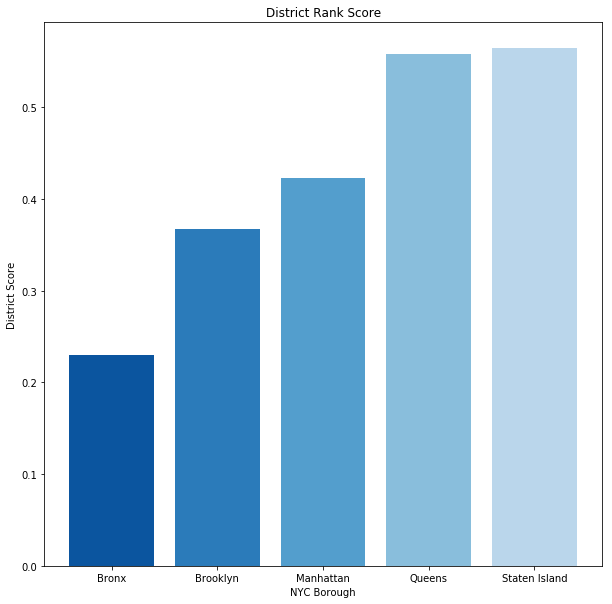

In [32]:
#Create x axis for bar graph
colors = sns.color_palette("Blues_r")

x_axis = np.arange(len(grouped_df))

# Create the ticks for our bar chart's x axis
tick_locations = [value+0.4 for value in x_axis]
plt.xticks(tick_locations, grouped_df["Borough List"])

#Create bar graph for teacher/student ratios
plt.bar(x_axis, grouped_df["Rank Score"], color=colors, align="edge")

fig = plt.gcf()
fig.set_size_inches(10,10)

plt.title("District Rank Score")
plt.xlabel("NYC Borough")
plt.ylabel("District Score")
plt.show()

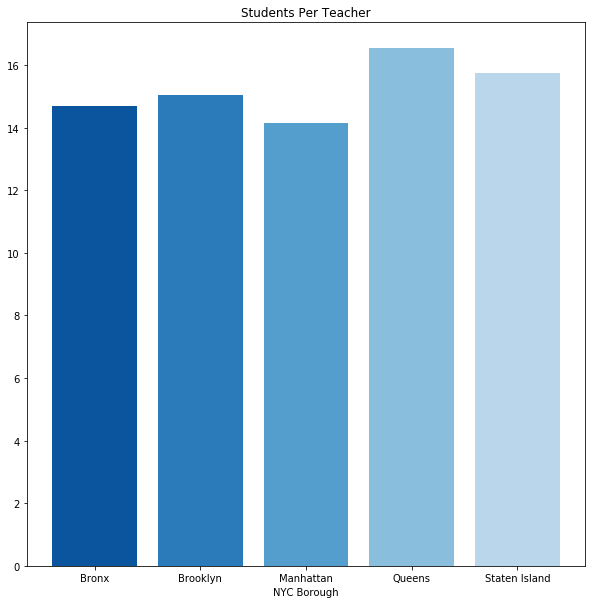

In [34]:
#Create x axis for bar graph
colors = sns.color_palette("Blues_r")

x_axis = np.arange(len(grouped_df))

# Create the ticks for our bar chart's x axis
tick_locations = [value+0.4 for value in x_axis]
plt.xticks(tick_locations, grouped_df["Borough List"])

#Create bar graph for teacher/student ratios
plt.bar(x_axis, grouped_df["Students Per Teacher"], color=colors, align="edge")

fig = plt.gcf()
fig.set_size_inches(10,10)

plt.title("Students Per Teacher")
plt.xlabel("NYC Borough")
plt.show()

In [35]:
#Dependencies
import pandas as pd 
from matplotlib import pyplot as plt
import numpy as np 
import seaborn as sns 
import requests as req
import random 

#Read CSVs and Combine to One Dataframe
file_one = "rollingsales_bronx.csv"
file_two = "rollingsales_brooklyn.csv"
file_three = "rollingsales_manhattan.csv"
file_four = "rollingsales_queens.csv"
file_five = "rollingsales_statenisland.csv"

bronx_pd = pd.read_csv(file_one)
brooklyn_pd = pd.read_csv(file_two)
manhattan_pd = pd.read_csv(file_three)
queens_pd = pd.read_csv(file_four)
staten_island_pd = pd.read_csv(file_five)
sales_df = pd.concat([manhattan_pd, bronx_pd, brooklyn_pd, queens_pd, staten_island_pd])

#Clean missing rows, change Borough numbers to names and sort out residential buildings
sales_df['BOROUGH'] = sales_df['BOROUGH'].map({1:'Manhattan', 2:'Bronx', 3:'Brooklyn', 4:'Queens', 5:'Staten Island'})
sales_df['BUILDING CLASS'], sales_df['CATEGORY'] = sales_df['BUILDING CLASS CATEGORY'].str.split(' ', 1).str
del (sales_df['BUILDING CLASS CATEGORY'], sales_df['BLOCK'], sales_df['LOT'],  sales_df['EASE-MENT'],  sales_df['TAX CLASS AT PRESENT'],
     sales_df['TAX CLASS AT TIME OF SALE'])
sales_df = sales_df.replace('-', np.nan).dropna(thresh=7)
sales_df = sales_df[~sales_df['BUILDING CLASS'].isin(['11A'])]
sales_df[['BUILDING CLASS']] = sales_df[['BUILDING CLASS']].apply(pd.to_numeric)
sales_df[' SALE PRICE '] = pd.to_numeric(sales_df[' SALE PRICE ']) 
#Use Loop to sort out residential buildings

# Create a list to store the data
sale_type = []

# For each row in the column,
for row in sales_df['BUILDING CLASS']:
    if row < 4 :
        sale_type.append('Residential Sale')
    elif row == 6:
        sale_type.append('Residential Sale')
    elif row == 9:
        sale_type.append('Residential Sale')
    elif row == 10:
        sale_type.append('Residential Sale')
    elif row == 12:
        sale_type.append('Residential Sale')
    elif row == 13:
        sale_type.append('Residential Sale')
    elif row == 15:
        sale_type.append('Residential Sale')
    elif row == 16:
        sale_type.append('Residential Sale')
    elif row == 17:
        sale_type.append('Residential Sale')
    else:
        # Append Other
        sale_type.append('Other')
        
# Create a column from the list
sales_df['sale_type'] = sale_type

sales_df = sales_df[~sales_df['sale_type'].isin(['Other'])]

#Create Price Bins and Dataframe for later
price_bins = [0, 250000, 500000, 750000, 1000000, 1500000, 2000000, 3000000, 4000000, 1000000000]

# Create the names for the bins
bin_names = ['$0-250K', '$250K-$500K', '$500K-$750K', '$750K-$1M', '$1M-$1.5M', '$1.5M-$2M',
              '$2M-$3M', '$3M-$4M', '4000000+']

sales_df["Price Category"] = pd.cut(sales_df[' SALE PRICE '], price_bins, labels=bin_names)
sales_df

,BOROUGH,NEIGHBORHOOD,BUILDING CLASS AT PRESENT,ADDRESS,APARTMENT NUMBER,ZIP CODE,RESIDENTIAL UNITS,COMMERCIAL UNITS,TOTAL UNITS,LAND SQUARE FEET,GROSS SQUARE FEET,YEAR BUILT,BUILDING CLASS AT TIME OF SALE,SALE PRICE,SALE DATE,BUILDING CLASS,CATEGORY,sale_type,Price Category
0,Manhattan,INWOOD,A5,49 MARBLE HILL AVENUE,,10463,1.0,0,1,1219,1224,1920,A5,635000.0,8/18/17,1,ONE FAMILY DWELLINGS,Residential Sale,$500K-$750K
1,Manhattan,WASHINGTON HEIGHTS LOWER,A9,16 SYLVAN TERRACE,,10032,1.0,0,1,673,1425,1899,A9,1560000.0,9/28/17,1,ONE FAMILY DWELLINGS,Residential Sale,$1.5M-$2M
2,Manhattan,HARLEM-EAST,A5,104 EAST 101 STREET,,10029,1.0,0,1,1607,1466,1890,A5,NaN,3/31/17,1,ONE FAMILY DWELLINGS,Residential Sale,NaN
3,Manhattan,HARLEM-EAST,A5,104 EAST 101ST STREET,,10029,1.0,0,1,1607,1466,1890,A5,NaN,2/4/17,1,ONE FAMILY DWELLINGS,Residential Sale,NaN
4,Manhattan,HARLEM-EAST,A9,101B EAST 97TH STREET,,10029,1.0,0,1,847,1472,1925,A9,NaN,3/7/17,1,ONE FAMILY DWELLINGS,Residential Sale,NaN
5,Manhattan,LOWER EAST SIDE,S1,515 GRAND STREET,,10002,1.0,1,2,765,1507,1910,S1,NaN,8/31/17,1,ONE FAMILY DWELLINGS,Residential Sale,NaN
6,Manhattan,MURRAY HILL,A4,130 EAST 38TH STREET,,10016,1.0,0,1,491,1824,1910,A4,2650000.0,5/9/17,1,ONE FAMILY DWELLINGS,Residential Sale,$2M-$3M
7,Manhattan,GREENWICH VILLAGE-WEST,S1,21 EIGHTH AVENUE,,10014,1.0,1,2,757,1854,1900,S1,5550000.0,7/12/17,1,ONE FAMILY DWELLINGS,Residential Sale,4000000+
8,Manhattan,GREENWICH VILLAGE-WEST,A9,58 DOWNING STREET,,10014,1.0,0,1,1067,1920,1899,A9,5430000.0,6/28/17,1,ONE FAMILY DWELLINGS,Residential Sale,4000000+
9,Manhattan,MURRAY HILL,A4,132 EAST 38TH STREET,,10016,1.0,0,1,495,1920,1910,A4,3850000.0,7/10/17,1,ONE FAMILY DWELLINGS,Residential Sale,$3M-$4M


In [37]:
#Average Price Per Borough
sns.set_style("dark")

average_price = sales_df.groupby(["BOROUGH"])[" SALE PRICE "].mean()
avg_price_df = pd.DataFrame(average_price).reset_index()
avg_price_df.head()

,BOROUGH,SALE PRICE
0,Bronx,4.018214e+05
1,Brooklyn,9.294838e+05
2,Manhattan,2.063293e+06
3,Queens,5.737254e+05
4,Staten Island,5.025262e+05


In [41]:
#New dataframe with only mean rank score information
grouped_df_ranks = pd.DataFrame(data = grouped_df, columns = {"Borough List","Rank Score"})
grouped_df_ranks = grouped_df_ranks.rename(columns={"Borough List": "BOROUGH"})
grouped_df_ranks

,Rank Score,BOROUGH
0,0.230309,Bronx
1,0.367149,Brooklyn
2,0.422485,Manhattan
3,0.558115,Queens
4,0.564713,Staten Island


In [39]:
#New dataframe with mean sale price and rank score per borough
price_rank_df = pd.merge(avg_price_df, grouped_df_ranks)
price_rank_df

,BOROUGH,SALE PRICE,Rank Score
0,Bronx,4.018214e+05,0.230309
1,Brooklyn,9.294838e+05,0.367149
2,Manhattan,2.063293e+06,0.422485
3,Queens,5.737254e+05,0.558115
4,Staten Island,5.025262e+05,0.564713


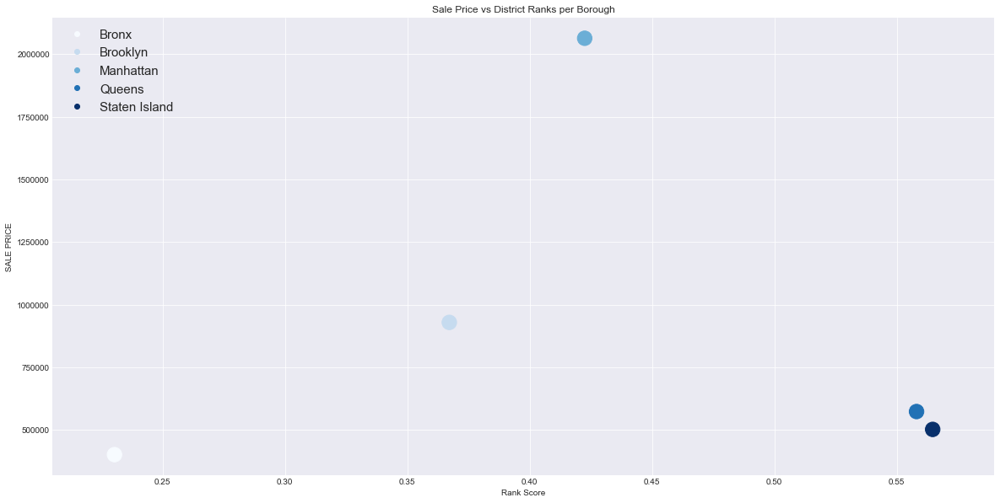

In [85]:
import matplotlib
# Create a scatter plot which compares MPG to horsepower iwth the size being model year
labels = ("Bronx", "Brooklyn", "Manhattan", "Queens", "Staten Island")
size = 300
colors = ("#f7fbff","#c6dbef", "#6baed6", "#2171b5", "#08306b")
price_rank_df.plot(kind="scatter", x="Rank Score", y=" SALE PRICE ", grid=True, figsize=(20,10),
              title="Sale Price vs District Ranks per Borough", s=size, c=colors)

handles = [matplotlib.lines.Line2D([],[], marker="o", color=c, linestyle="none") for c in colors]
# supply proxy artists to handles and last names to labels
plt.legend(handles=handles, labels=list(price_rank_df["BOROUGH"].values), 
           loc='upper left', prop={'size':15},ncol=1, numpoints=1)
plt.show()